# PreProcessing Doublets inference


Doublet inference was done using two packages : Scrublet and DoubletDetection.
These processing steps load the each of the 35 datasets, performs low quality cells filtering then infer the presence of doublets. The cells inferred status (doublet or singlet) is stored in the metadata of each dataset. The datasets are then normalized to 10000 UMIs and aggregated to enabled a first look analysis of the doublet inference results.

[Nasal Biopsies Preprocessing](#Nasal-Biopsies)  
[Nasal Brushings Preprocessing](#Nasal-Brushings)  
[Proximal Biopsies Preprocessing](#Proximal-Biopsies)  
[Intermediate Biopsies Preprocessing](#Intermediate-Biopsies)  
[Distal Brushings Preprocessing](#Distal-Brushings)  
[Concatenate Full Dataset](#Concatenate-full-dataset) 

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import scrublet as scr
import doubletdetection

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

scanpy==1.4+39.gc70f24b anndata==0.6.18 numpy==1.16.2 scipy==1.2.1 pandas==0.24.1 scikit-learn==0.20.3 statsmodels==0.9.0 python-igraph==0.7.1 


In [2]:
def remove_RB_genes(
    df,
    path_to_RB_genes_file = '/home/deprez/HCA/PeerLab_analysis/RB_genes'
):
    """Removes all columns of RB genes as listed in the RB gene file.
    RB_genes_file should contain gene names, one gene name per line.
    Returns RB gene-depleted df, pd.Series with number of counts removed 
    per cell, and a list of RB genes that were in the df."""
    with open(path_to_RB_genes_file,'r') as file:
        lines = file.readlines()
    genes = [x.rstrip('\n') for x in lines]
    RB_genes_in_df = []
    df_genes = df.columns
    for gene in genes:
        if gene in df_genes:
            RB_genes_in_df.append(gene)
    # df_genes = df.columns
    # ribosomal_genes = []
    # for GENE in df_genes:
    #     if GENE[:3] in ['RPL','RPS']:
    #         ribosomal_genes.append(GENE)
    # store the number of RB molecules per cell in a Series object with cell labels as indices
    counts_removed_per_cell = pd.Series(index = df.index)
    for cell in df.index:
        counts_removed_per_cell[cell] = sum(df.loc[cell][RB_genes_in_df])
    # now drop all columns with RB genes:
    df_RB_depleted = df.drop(columns = RB_genes_in_df)
    return df_RB_depleted, counts_removed_per_cell, RB_genes_in_df


In [3]:
sc.settings.set_figure_params(dpi=80)

In [4]:
os.chdir('/home/deprez/HCA/Data/')
outsPath = 'outs/filtered_gene_bc_matrices/ucagenomix-cellranger-hg19-1.3.0/'

# Nasal Biopsies
[Back to top](#Full-Aggregate)

In [5]:
D322_Biop_Nas1 = sc.read_10x_mtx(
    './D322_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D322_Biop_Nas1.var_names_make_unique()
D322_Biop_Nas1.obs['manip'] = 'D322_Biop_Nas1'
D322_Biop_Nas1.obs['position'] = 'Nasal'
D322_Biop_Nas1.obs['method'] = 'Biopsy'
D322_Biop_Nas1.obs['donor'] = 'D322'
D322_Biop_Nas1.obs['name'] = ['D322_Biop_Nas1_' + s for s in list(D322_Biop_Nas1.obs.index)]
D322_Biop_Nas1.obs_names = D322_Biop_Nas1.obs['name']
D322_Biop_Nas1

... reading from cache file ./cache/D322_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1797 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

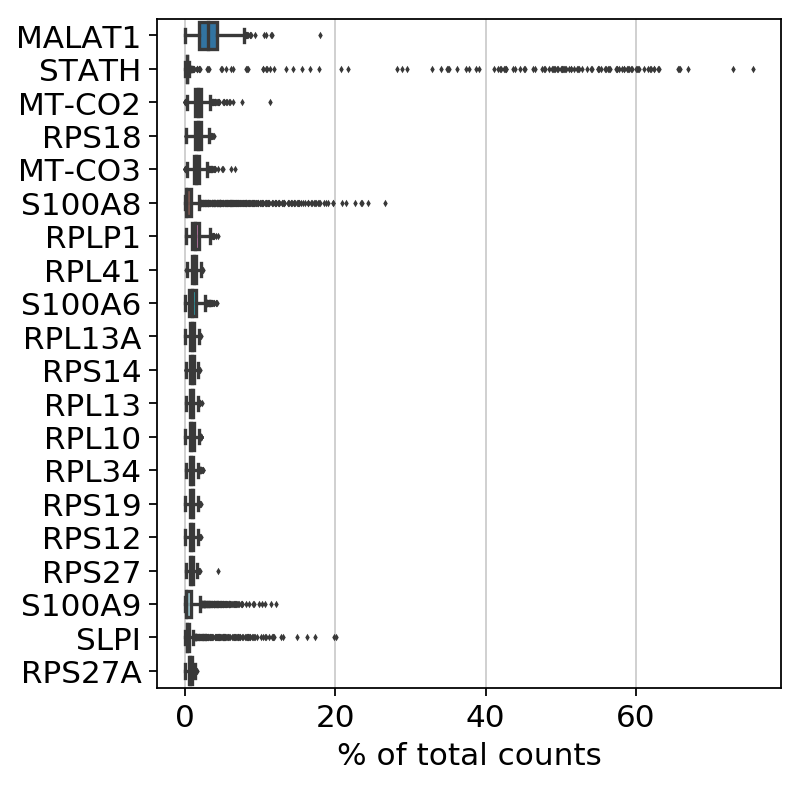

In [6]:
sc.pl.highest_expr_genes(D322_Biop_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


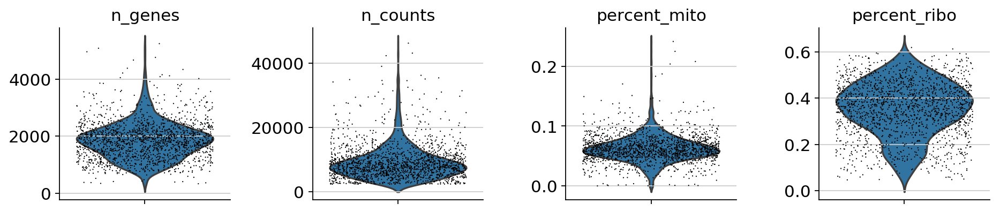

In [7]:
sc.pp.filter_cells(D322_Biop_Nas1, min_genes=0)
mito_genes = D322_Biop_Nas1.var_names.str.startswith('MT-')
D322_Biop_Nas1.obs['percent_mito'] = np.sum(
    D322_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D322_Biop_Nas1.X, axis=1).A1
D322_Biop_Nas1.obs['n_counts'] = D322_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D322_Biop_Nas1.to_df())
ribo_genes = D322_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D322_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D322_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D322_Biop_Nas1.X, axis=1).A1
D322_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D322_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [8]:
sc.pp.filter_cells(D322_Biop_Nas1, min_genes=500)
D322_Biop_Nas1 = D322_Biop_Nas1[D322_Biop_Nas1.obs['n_counts'] < 40000, :]
D322_Biop_Nas1 = D322_Biop_Nas1[D322_Biop_Nas1.obs['percent_mito'] < 0.2, :]

filtered out 10 cells that have less than 500 genes expressed


In [9]:
D322_Biop_Nas1.shape

(1780, 32739)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.17
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 9.6%
Overall doublet rate:
	Expected   = 1.6%
	Estimated  = 4.7%
Elapsed time: 1.4 seconds


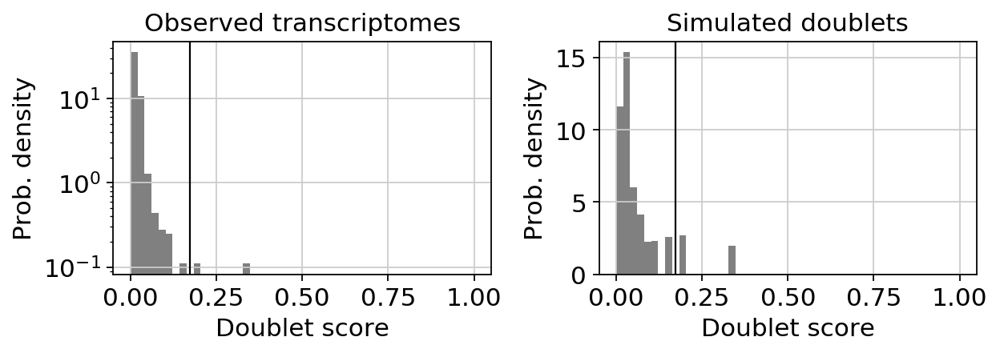

In [10]:
# scrublet
scrub = scr.Scrublet(D322_Biop_Nas1.X, expected_doublet_rate=0.016) 
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D322_Biop_Nas1.obs['doublet_scores'] = doublet_scores
D322_Biop_Nas1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram();

In [11]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D322_Biop_Nas1.X).predict()
D322_Biop_Nas1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.4085679054260254 seconds
Jaccard graph constructed in 0.3359701633453369 seconds
Wrote graph to binary file in 0.1134796142578125 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.851025
After 2 runs, maximum modularity is Q = 0.852223
Louvain completed 22 runs in 0.776637077331543 seconds
PhenoGraph complete in 1.6490111351013184 seconds
Found communities [-1, ... 12], with sizes: [132, 489, 246, 245, 199, 178, 157, 146, 131, 84, 74, 66, 59, 19]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algori

In [12]:
sc.pp.normalize_per_cell(D322_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D322_Biop_Nas1) # log transform the data
D322_Biop_Nas1.raw = D322_Biop_Nas1 # freeze the object (for later use of the raw state of it)

In [13]:
D322_Biop_Nas1 = D322_Biop_Nas1[:, D322_Biop_Nas1.var['ribo_genes']]
D322_Biop_Nas1

View of AnnData object with n_obs × n_vars = 1780 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [14]:
D339_Biop_Nas1 = sc.read_10x_mtx(
    './D339_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Biop_Nas1.var_names_make_unique()
D339_Biop_Nas1.obs['manip'] = 'D339_Biop_Nas1'
D339_Biop_Nas1.obs['position'] = 'Nasal'
D339_Biop_Nas1.obs['method'] = 'Biopsy'
D339_Biop_Nas1.obs['donor'] = 'D339'
D339_Biop_Nas1.obs['name'] = ['D339_Biop_Nas1_' + s for s in list(D339_Biop_Nas1.obs.index)]
D339_Biop_Nas1.obs_names = D339_Biop_Nas1.obs['name']
D339_Biop_Nas1

... reading from cache file ./cache/D339_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1917 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

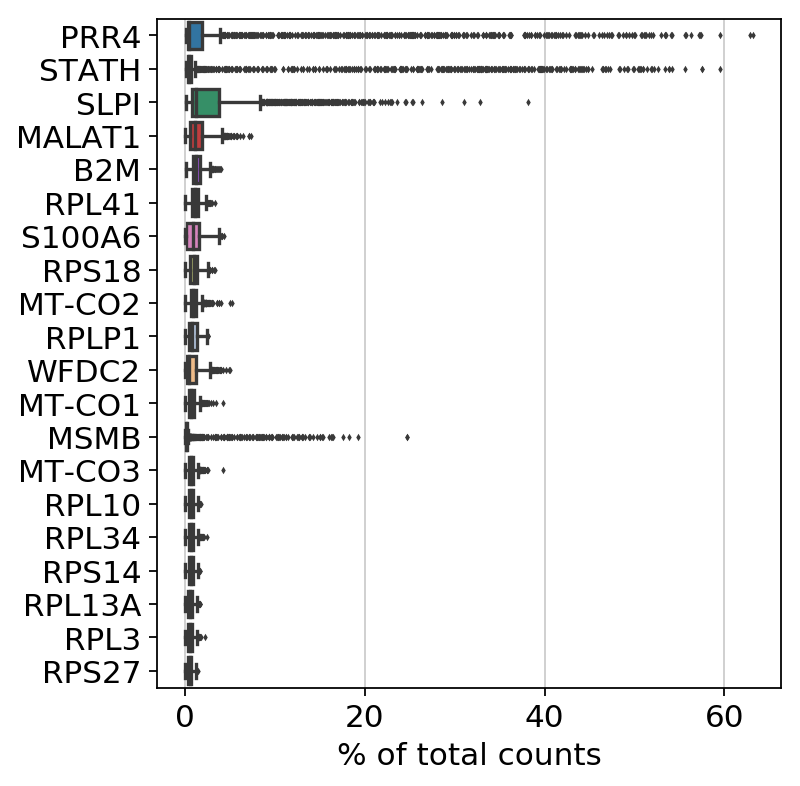

In [15]:
sc.pl.highest_expr_genes(D339_Biop_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


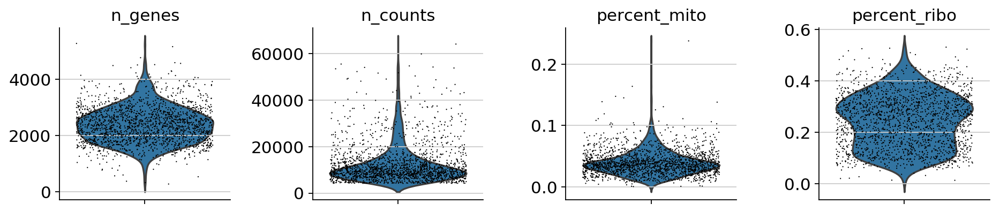

In [16]:
sc.pp.filter_cells(D339_Biop_Nas1, min_genes=0)
mito_genes = D339_Biop_Nas1.var_names.str.startswith('MT-')
D339_Biop_Nas1.obs['percent_mito'] = np.sum(
    D339_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Biop_Nas1.X, axis=1).A1
D339_Biop_Nas1.obs['n_counts'] = D339_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Biop_Nas1.to_df())
ribo_genes = D339_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D339_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D339_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Biop_Nas1.X, axis=1).A1
D339_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [17]:
sc.pp.filter_cells(D339_Biop_Nas1, min_genes=500)
D339_Biop_Nas1 = D339_Biop_Nas1[D339_Biop_Nas1.obs['n_counts'] < 40000, :]
D339_Biop_Nas1 = D339_Biop_Nas1[D339_Biop_Nas1.obs['percent_mito'] < 0.15, :]

filtered out 3 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.47
Detected doublet rate = 0.5%
Estimated detectable doublet fraction = 41.5%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.3%
Elapsed time: 1.4 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ecaf6ff28>,
       dtype=object))

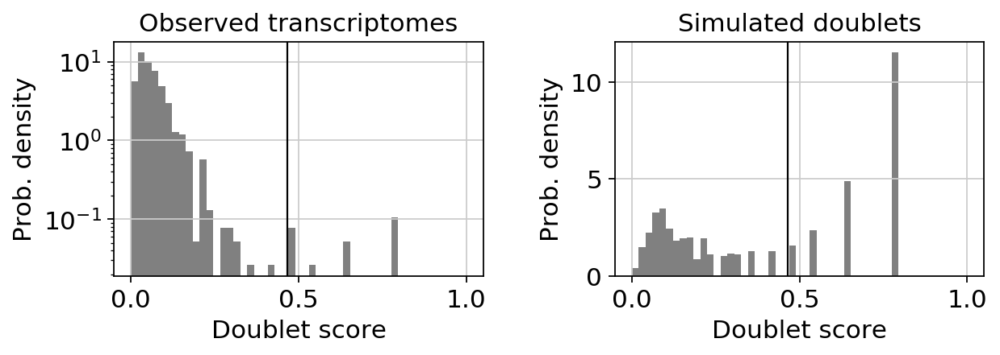

In [18]:
# scrublet
scrub = scr.Scrublet(D339_Biop_Nas1.X, expected_doublet_rate=0.016) 
scrub = scr.Scrublet(D339_Biop_Nas1.X)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D339_Biop_Nas1.obs['doublet_scores'] = doublet_scores
D339_Biop_Nas1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [19]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D339_Biop_Nas1.X).predict()
D339_Biop_Nas1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.2066202163696289 seconds
Jaccard graph constructed in 0.3158748149871826 seconds
Wrote graph to binary file in 0.04000139236450195 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.914813
After 3 runs, maximum modularity is Q = 0.916011
Louvain completed 23 runs in 0.8884556293487549 seconds
PhenoGraph complete in 1.4616329669952393 seconds
Found communities [-1, ... 21], with sizes: [94, 295, 221, 207, 133, 132, 132, 131, 121, 118, 104, 96, 93, 91, 66, 52, 50, 49, 41, 36, 33, 29, 24]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors u

In [20]:
sc.pp.normalize_per_cell(D339_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Biop_Nas1) # log transform the data
D339_Biop_Nas1.raw = D339_Biop_Nas1 # freeze the object (for later use of the raw state of it)

In [21]:
D339_Biop_Nas1 = D339_Biop_Nas1[:, D339_Biop_Nas1.var['ribo_genes']]
D339_Biop_Nas1

View of AnnData object with n_obs × n_vars = 1879 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [22]:
D344_Biop_Nas1 = sc.read_10x_mtx(
    './D344_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Biop_Nas1.var_names_make_unique()
D344_Biop_Nas1.obs['manip'] = 'D344_Biop_Nas1'
D344_Biop_Nas1.obs['position'] = 'Nasal'
D344_Biop_Nas1.obs['method'] = 'Biopsy'
D344_Biop_Nas1.obs['donor'] = 'D344'
D344_Biop_Nas1.obs['name'] = ['D344_Biop_Nas1_' + s for s in list(D344_Biop_Nas1.obs.index)]
D344_Biop_Nas1.obs_names = D344_Biop_Nas1.obs['name']
D344_Biop_Nas1

... reading from cache file ./cache/D344_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2121 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

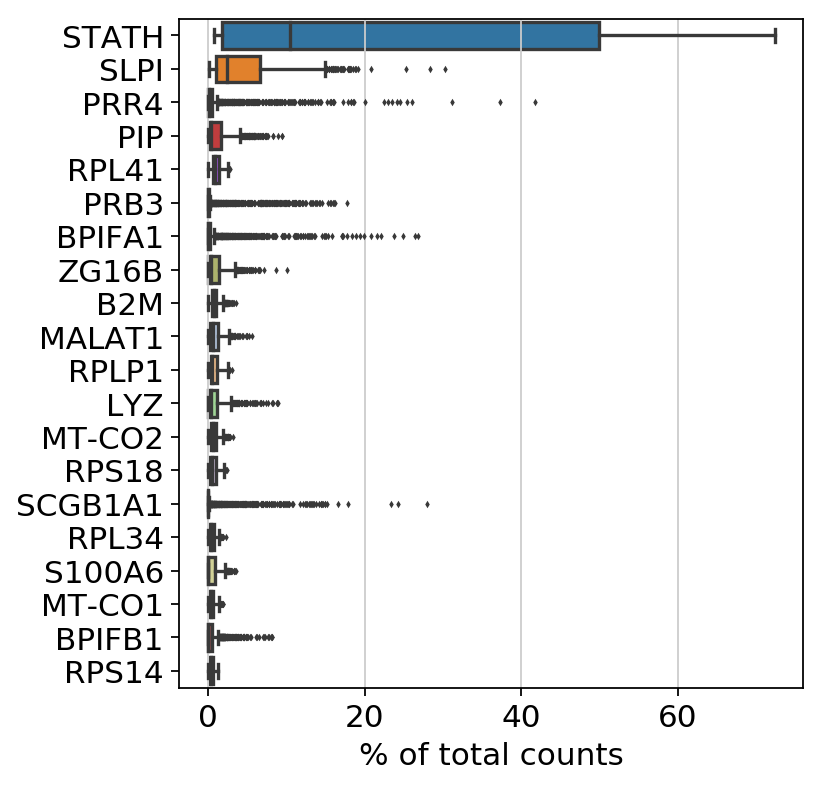

In [23]:
sc.pl.highest_expr_genes(D344_Biop_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


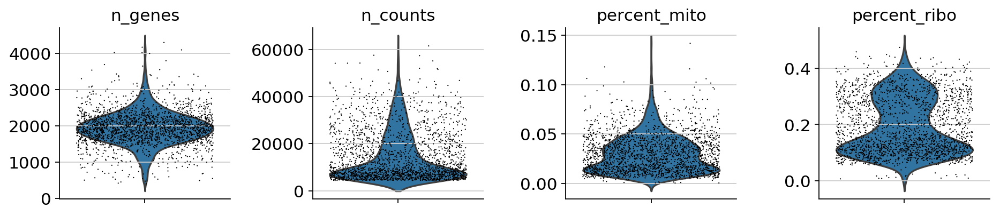

In [24]:
sc.pp.filter_cells(D344_Biop_Nas1, min_genes=0)
mito_genes = D344_Biop_Nas1.var_names.str.startswith('MT-')
D344_Biop_Nas1.obs['percent_mito'] = np.sum(
    D344_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Biop_Nas1.X, axis=1).A1
D344_Biop_Nas1.obs['n_counts'] = D344_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Biop_Nas1.to_df())
ribo_genes = D344_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D344_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D344_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Biop_Nas1.X, axis=1).A1
D344_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [25]:
sc.pp.filter_cells(D344_Biop_Nas1, min_genes=500)
D344_Biop_Nas1 = D344_Biop_Nas1[D344_Biop_Nas1.obs['n_counts'] < 50000, :]
D344_Biop_Nas1 = D344_Biop_Nas1[D344_Biop_Nas1.obs['percent_mito'] < 0.1, :]

filtered out 6 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.18
Detected doublet rate = 0.7%
Estimated detectable doublet fraction = 28.9%
Overall doublet rate:
	Expected   = 1.7%
	Estimated  = 2.3%
Elapsed time: 1.5 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ecbbb5860>,
       dtype=object))

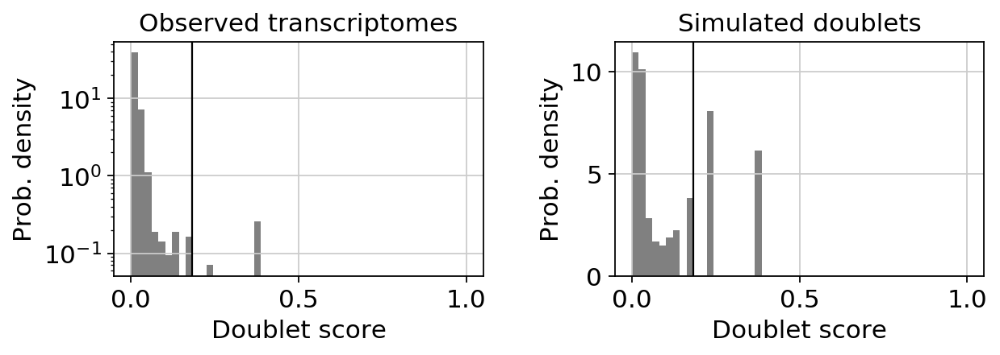

In [26]:
# scrublet
scrub = scr.Scrublet(D344_Biop_Nas1.X, expected_doublet_rate=0.017)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D344_Biop_Nas1.obs['doublet_scores'] = doublet_scores
D344_Biop_Nas1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [27]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D344_Biop_Nas1.X).predict()
D344_Biop_Nas1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.3668093681335449 seconds
Jaccard graph constructed in 0.37114810943603516 seconds
Wrote graph to binary file in 0.04429221153259277 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.905021
Louvain completed 21 runs in 0.8386020660400391 seconds
PhenoGraph complete in 1.6339306831359863 seconds
Found communities [-1, ... 19], with sizes: [183, 344, 283, 240, 182, 176, 175, 132, 124, 117, 98, 86, 86, 72, 71, 60, 58, 55, 36, 23, 17]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors com

In [28]:
sc.pp.normalize_per_cell(D344_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Biop_Nas1) # log transform the data
D344_Biop_Nas1.raw = D344_Biop_Nas1 # freeze the object (for later use of the raw state of it)

In [29]:
D344_Biop_Nas1 = D344_Biop_Nas1[:, D344_Biop_Nas1.var['ribo_genes']]
D344_Biop_Nas1

View of AnnData object with n_obs × n_vars = 2095 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [30]:
D345_Biop_Nas1 = sc.read_10x_mtx(
    './D345_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D345_Biop_Nas1.var_names_make_unique()
D345_Biop_Nas1.obs['manip'] = 'D345_Biop_Nas1'
D345_Biop_Nas1.obs['position'] = 'Nasal'
D345_Biop_Nas1.obs['method'] = 'Biopsy'
D345_Biop_Nas1.obs['donor'] = 'D345'
D345_Biop_Nas1.obs['name'] = ['D345_Biop_Nas1_' + s for s in list(D345_Biop_Nas1.obs.index)]
D345_Biop_Nas1.obs_names = D345_Biop_Nas1.obs['name']
D345_Biop_Nas1

... reading from cache file ./cache/D345_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 3259 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

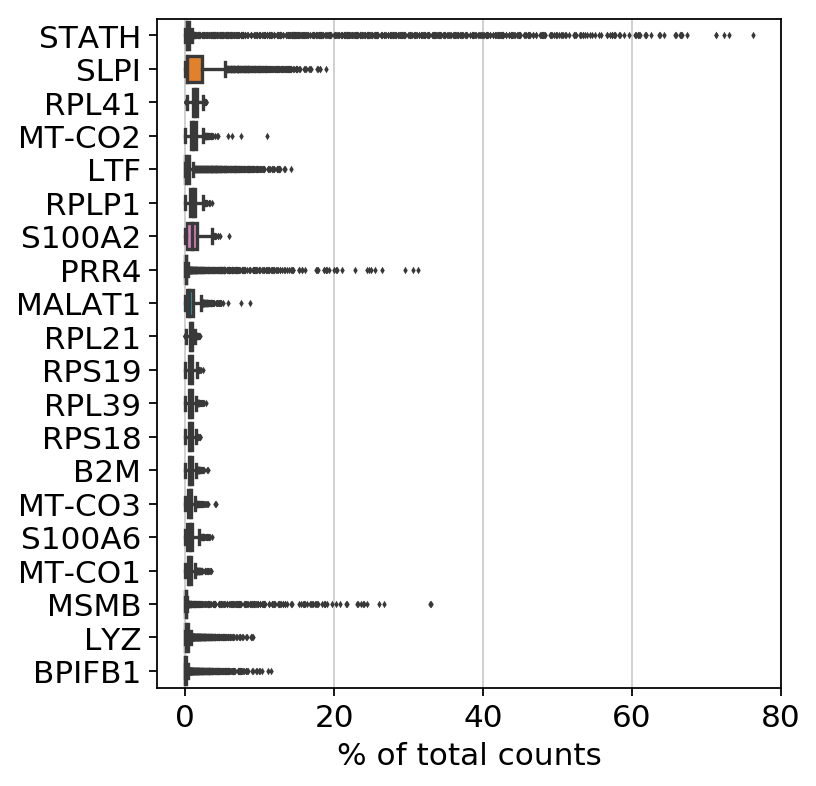

In [31]:
sc.pl.highest_expr_genes(D345_Biop_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


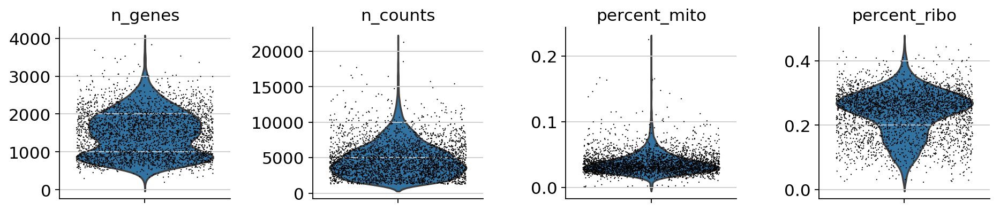

In [32]:
sc.pp.filter_cells(D345_Biop_Nas1, min_genes=0)
mito_genes = D345_Biop_Nas1.var_names.str.startswith('MT-')
D345_Biop_Nas1.obs['percent_mito'] = np.sum(
    D345_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D345_Biop_Nas1.X, axis=1).A1
D345_Biop_Nas1.obs['n_counts'] = D345_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D345_Biop_Nas1.to_df())
ribo_genes = D345_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D345_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D345_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D345_Biop_Nas1.X, axis=1).A1
D345_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D345_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [33]:
sc.pp.filter_cells(D345_Biop_Nas1, min_genes=500)
D345_Biop_Nas1 = D345_Biop_Nas1[D345_Biop_Nas1.obs['n_counts'] < 20000, :]
D345_Biop_Nas1 = D345_Biop_Nas1[D345_Biop_Nas1.obs['percent_mito'] < 0.2, :]

filtered out 32 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.20
Detected doublet rate = 1.0%
Estimated detectable doublet fraction = 33.4%
Overall doublet rate:
	Expected   = 2.5%
	Estimated  = 3.0%
Elapsed time: 2.1 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb8d51208>,
       dtype=object))

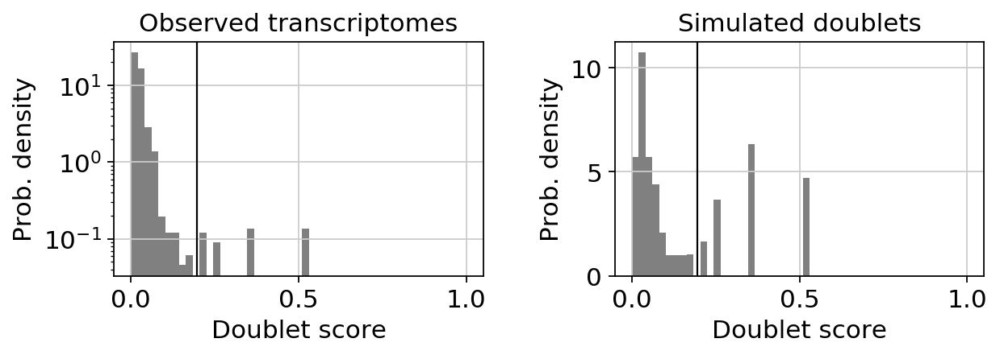

In [34]:
# scrublet
scrub = scr.Scrublet(D345_Biop_Nas1.X, expected_doublet_rate=0.025)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D345_Biop_Nas1.obs['doublet_scores'] = doublet_scores
D345_Biop_Nas1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [35]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D345_Biop_Nas1.X).predict()
D345_Biop_Nas1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.509113073348999 seconds
Jaccard graph constructed in 0.47003698348999023 seconds
Wrote graph to binary file in 0.16583967208862305 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.875367
Louvain completed 21 runs in 1.0838100910186768 seconds
PhenoGraph complete in 2.2446818351745605 seconds
Found communities [-1, ... 20], with sizes: [55, 513, 452, 370, 293, 292, 270, 249, 240, 213, 196, 129, 123, 122, 110, 95, 64, 64, 58, 57, 53, 13]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighb

In [36]:
sc.pp.normalize_per_cell(D345_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D345_Biop_Nas1) # log transform the data
D345_Biop_Nas1.raw = D345_Biop_Nas1 # freeze the object (for later use of the raw state of it)

In [37]:
D345_Biop_Nas1 = D345_Biop_Nas1[:, D345_Biop_Nas1.var['ribo_genes']]
D345_Biop_Nas1

View of AnnData object with n_obs × n_vars = 3225 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

# Nasal Brushings
[Back to top](#Full-Aggregate)

In [38]:
D353_Brus_Nas1 = sc.read_10x_mtx(
    './D353_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Brus_Nas1.var_names_make_unique()
D353_Brus_Nas1.obs['manip'] = 'D353_Brus_Nas1'
D353_Brus_Nas1.obs['position'] = 'Nasal'
D353_Brus_Nas1.obs['method'] = 'Brushing'
D353_Brus_Nas1.obs['donor'] = 'D353'
D353_Brus_Nas1.obs['name'] = ['D353_Brus_Nas1_' + s for s in list(D353_Brus_Nas1.obs.index)]
D353_Brus_Nas1.obs_names = D353_Brus_Nas1.obs['name']
D353_Brus_Nas1

... reading from cache file ./cache/D353_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 5154 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

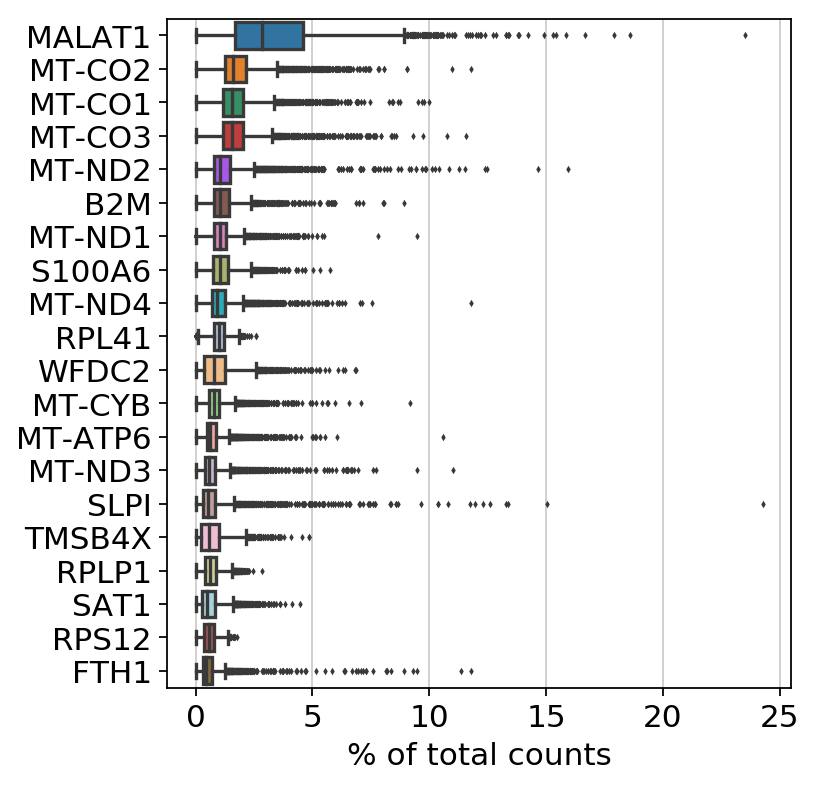

In [39]:
sc.pl.highest_expr_genes(D353_Brus_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


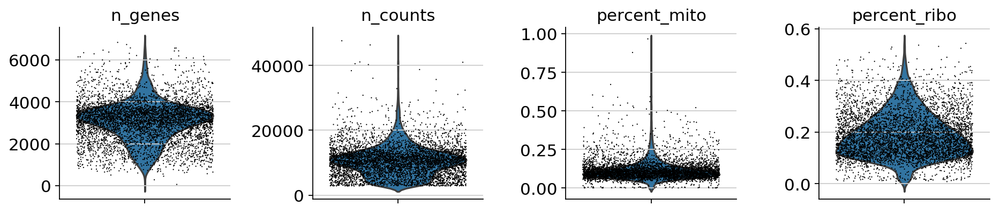

In [40]:
sc.pp.filter_cells(D353_Brus_Nas1, min_genes=0)
mito_genes = D353_Brus_Nas1.var_names.str.startswith('MT-')
D353_Brus_Nas1.obs['percent_mito'] = np.sum(
    D353_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D353_Brus_Nas1.X, axis=1).A1
D353_Brus_Nas1.obs['n_counts'] = D353_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Brus_Nas1.to_df())
ribo_genes = D353_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D353_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D353_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Brus_Nas1.X, axis=1).A1
D353_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [41]:
sc.pp.filter_cells(D353_Brus_Nas1, min_genes=500)
D353_Brus_Nas1 = D353_Brus_Nas1[D353_Brus_Nas1.obs['n_counts'] < 40000, :]
D353_Brus_Nas1 = D353_Brus_Nas1[D353_Brus_Nas1.obs['percent_mito'] < 0.5, :]


filtered out 3 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.47
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 10.8%
Overall doublet rate:
	Expected   = 4.0%
	Estimated  = 0.9%
Elapsed time: 5.6 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ecb02bc50>,
       dtype=object))

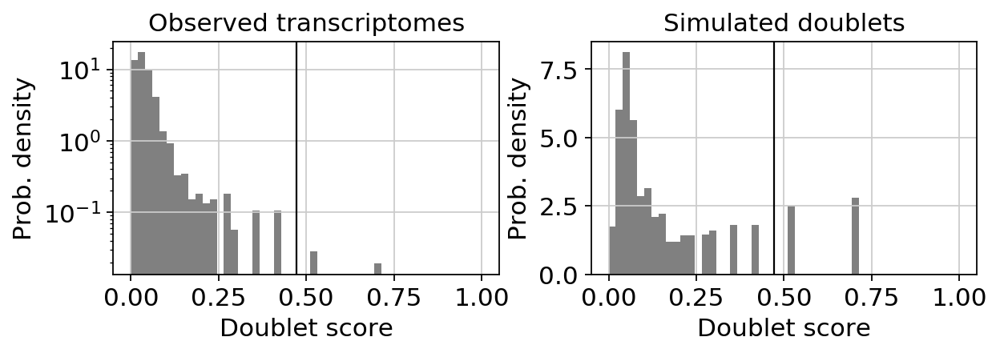

In [42]:
# scrublet
scrub = scr.Scrublet(D353_Brus_Nas1.X, expected_doublet_rate=0.04)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D353_Brus_Nas1.obs['doublet_scores'] = doublet_scores
D353_Brus_Nas1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [43]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D353_Brus_Nas1.X).predict()
D353_Brus_Nas1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.2127726078033447 seconds
Jaccard graph constructed in 0.7197434902191162 seconds
Wrote graph to binary file in 0.25298023223876953 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.909195
After 2 runs, maximum modularity is Q = 0.911025
Louvain completed 22 runs in 1.7851529121398926 seconds
PhenoGraph complete in 3.994328022003174 seconds
Found communities [-1, ... 26], with sizes: [42, 780, 676, 492, 439, 415, 408, 329, 310, 298, 291, 286, 216, 207, 155, 153, 130, 120, 115, 100, 98, 70, 69, 65, 51, 41, 36, 21]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Fi

In [44]:
sc.pp.normalize_per_cell(D353_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Brus_Nas1) # log transform the data
D353_Brus_Nas1.raw = D353_Brus_Nas1 # freeze the object (for later use of the raw state of it)

In [45]:
D353_Brus_Nas1 = D353_Brus_Nas1[:, D353_Brus_Nas1.var['ribo_genes']]
D353_Brus_Nas1

View of AnnData object with n_obs × n_vars = 5131 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [46]:
D363_Brus_Nas1 = sc.read_10x_mtx(
    './D363_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Brus_Nas1.var_names_make_unique()
D363_Brus_Nas1.obs['manip'] = 'D363_Brus_Nas1'
D363_Brus_Nas1.obs['position'] = 'Nasal'
D363_Brus_Nas1.obs['method'] = 'Brushing'
D363_Brus_Nas1.obs['donor'] = 'D363'
D363_Brus_Nas1.obs['name'] = ['D363_Brus_Nas1_' + s for s in list(D363_Brus_Nas1.obs.index)]
D363_Brus_Nas1.obs_names = D363_Brus_Nas1.obs['name']
D363_Brus_Nas1

... reading from cache file ./cache/D363_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 3505 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

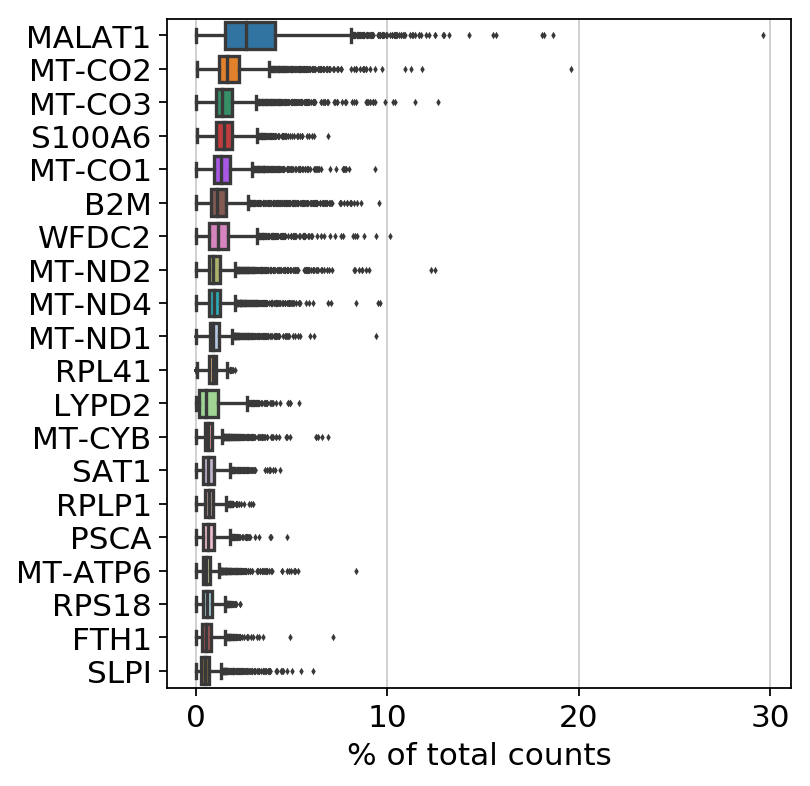

In [47]:
sc.pl.highest_expr_genes(D363_Brus_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


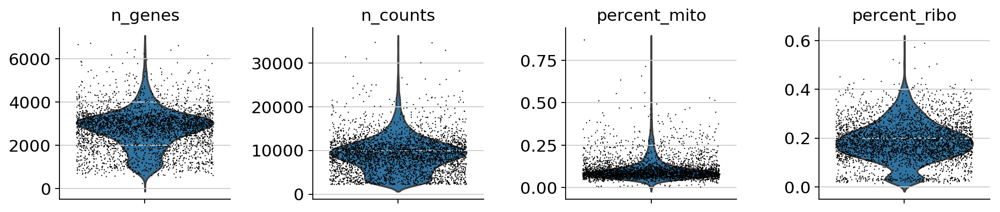

In [48]:
sc.pp.filter_cells(D363_Brus_Nas1, min_genes=0)
mito_genes = D363_Brus_Nas1.var_names.str.startswith('MT-')
D363_Brus_Nas1.obs['percent_mito'] = np.sum(
    D363_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D363_Brus_Nas1.X, axis=1).A1
D363_Brus_Nas1.obs['n_counts'] = D363_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Brus_Nas1.to_df())
ribo_genes = D363_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D363_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D363_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Brus_Nas1.X, axis=1).A1
D363_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [49]:
sc.pp.filter_cells(D363_Brus_Nas1, min_genes=500)
D363_Brus_Nas1 = D363_Brus_Nas1[D363_Brus_Nas1.obs['n_counts'] < 30000, :]
D363_Brus_Nas1 = D363_Brus_Nas1[D363_Brus_Nas1.obs['percent_mito'] < 0.5, :]


filtered out 1 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.34
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 6.1%
Overall doublet rate:
	Expected   = 2.7%
	Estimated  = 2.8%
Elapsed time: 3.1 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb88855f8>,
       dtype=object))

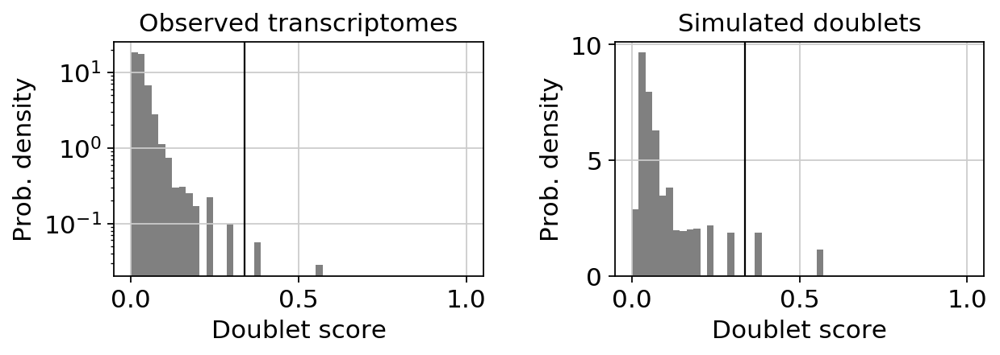

In [50]:
# scrublet
scrub = scr.Scrublet(D363_Brus_Nas1.X, expected_doublet_rate=0.027)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D363_Brus_Nas1.obs['doublet_scores'] = doublet_scores
D363_Brus_Nas1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [51]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D363_Brus_Nas1.X).predict()
D363_Brus_Nas1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.011885166168213 seconds
Jaccard graph constructed in 0.5874404907226562 seconds
Wrote graph to binary file in 0.21593761444091797 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.895554
After 2 runs, maximum modularity is Q = 0.896566
Louvain completed 22 runs in 1.470625638961792 seconds
PhenoGraph complete in 3.3034350872039795 seconds
Found communities [-1, ... 20], with sizes: [93, 554, 551, 513, 398, 285, 271, 256, 205, 167, 166, 141, 136, 106, 92, 86, 85, 83, 80, 52, 27, 15]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors usin

In [52]:
sc.pp.normalize_per_cell(D363_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Brus_Nas1) # log transform the data
D363_Brus_Nas1.raw = D363_Brus_Nas1 # freeze the object (for later use of the raw state of it)

In [53]:
D363_Brus_Nas1 = D363_Brus_Nas1[:, D363_Brus_Nas1.var['ribo_genes']]
D363_Brus_Nas1

View of AnnData object with n_obs × n_vars = 3490 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [54]:
D367_Brus_Nas1 = sc.read_10x_mtx(
    './D367_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Brus_Nas1.var_names_make_unique()
D367_Brus_Nas1.obs['manip'] = 'D367_Brus_Nas1'
D367_Brus_Nas1.obs['position'] = 'Nasal'
D367_Brus_Nas1.obs['method'] = 'Brushing'
D367_Brus_Nas1.obs['donor'] = 'D367'
D367_Brus_Nas1.obs['name'] = ['D367_Brus_Nas1_' + s for s in list(D367_Brus_Nas1.obs.index)]
D367_Brus_Nas1.obs_names = D367_Brus_Nas1.obs['name']
D367_Brus_Nas1

... reading from cache file ./cache/D367_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2596 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

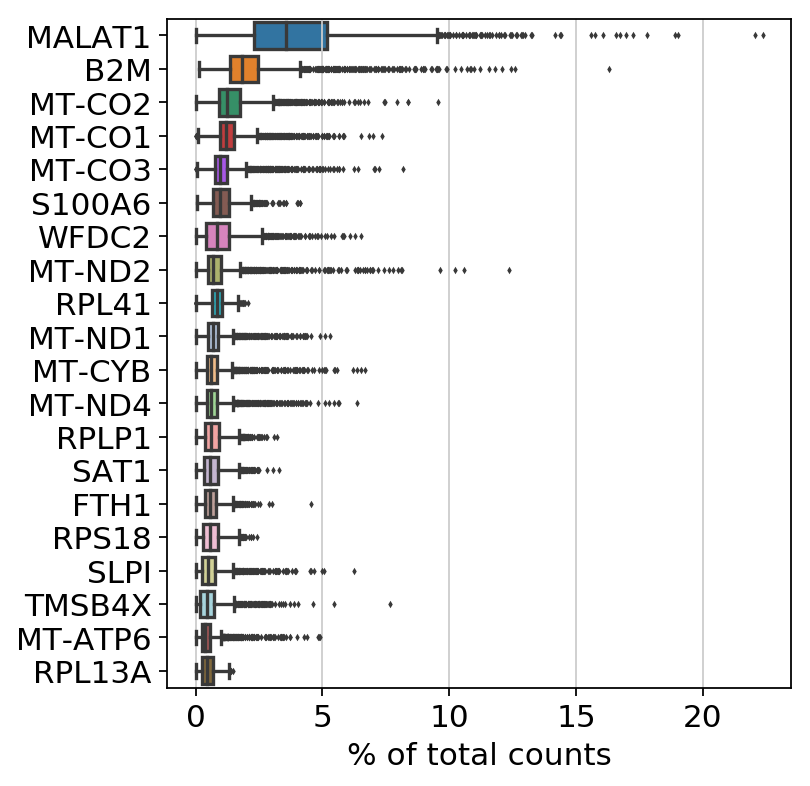

In [55]:
sc.pl.highest_expr_genes(D367_Brus_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


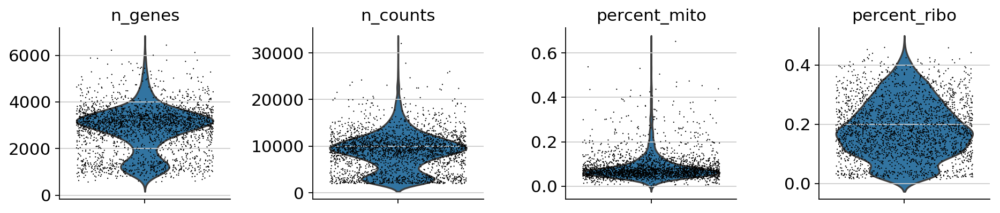

In [56]:
sc.pp.filter_cells(D367_Brus_Nas1, min_genes=0)
mito_genes = D367_Brus_Nas1.var_names.str.startswith('MT-')
D367_Brus_Nas1.obs['percent_mito'] = np.sum(
    D367_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Brus_Nas1.X, axis=1).A1
D367_Brus_Nas1.obs['n_counts'] = D367_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Brus_Nas1.to_df())
ribo_genes = D367_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D367_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D367_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Brus_Nas1.X, axis=1).A1
D367_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [57]:
sc.pp.filter_cells(D367_Brus_Nas1, min_genes=500)
D367_Brus_Nas1 = D367_Brus_Nas1[D367_Brus_Nas1.obs['n_counts'] < 30000, :]
D367_Brus_Nas1 = D367_Brus_Nas1[D367_Brus_Nas1.obs['percent_mito'] < 0.5, :]


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.24
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 12.8%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 2.1%
Elapsed time: 2.3 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ec3f50438>,
       dtype=object))

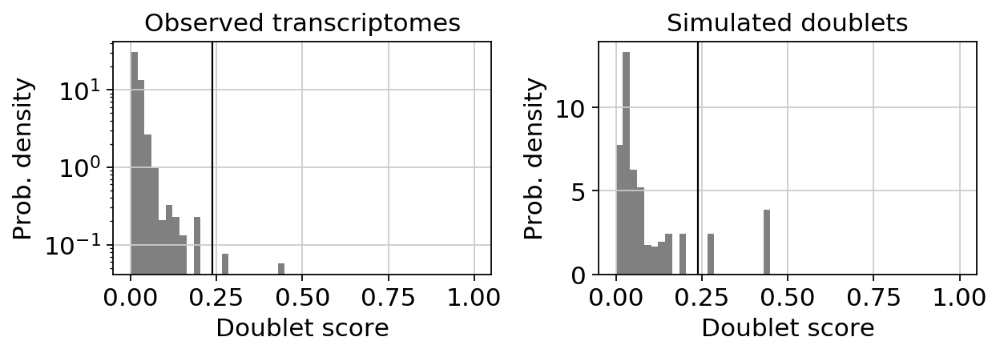

In [58]:
# scrublet
scrub = scr.Scrublet(D367_Brus_Nas1.X, expected_doublet_rate=0.02)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D367_Brus_Nas1.obs['doublet_scores'] = doublet_scores
D367_Brus_Nas1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [59]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D367_Brus_Nas1.X).predict()
D367_Brus_Nas1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.5084607601165771 seconds
Jaccard graph constructed in 0.4668412208557129 seconds
Wrote graph to binary file in 0.1636643409729004 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.900197
After 4 runs, maximum modularity is Q = 0.902022
Louvain completed 24 runs in 1.3420603275299072 seconds
PhenoGraph complete in 2.4956376552581787 seconds
Found communities [-1, ... 20], with sizes: [127, 563, 345, 302, 292, 222, 208, 171, 136, 119, 113, 98, 89, 73, 71, 67, 61, 53, 52, 33, 29, 14]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using

In [60]:
sc.pp.normalize_per_cell(D367_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Brus_Nas1) # log transform the data
D367_Brus_Nas1.raw = D367_Brus_Nas1 # freeze the object (for later use of the raw state of it)

In [61]:
D367_Brus_Nas1 = D367_Brus_Nas1[:, D367_Brus_Nas1.var['ribo_genes']]
D367_Brus_Nas1

View of AnnData object with n_obs × n_vars = 2591 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [62]:
D372_Brus_Nas1 = sc.read_10x_mtx(
    './D372_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Brus_Nas1.var_names_make_unique()
D372_Brus_Nas1.obs['manip'] = 'D372_Brus_Nas1'
D372_Brus_Nas1.obs['position'] = 'Nasal'
D372_Brus_Nas1.obs['method'] = 'Brushing'
D372_Brus_Nas1.obs['donor'] = 'D372'
D372_Brus_Nas1.obs['name'] = ['D372_Brus_Nas1_' + s for s in list(D372_Brus_Nas1.obs.index)]
D372_Brus_Nas1.obs_names = D372_Brus_Nas1.obs['name']
D372_Brus_Nas1

... reading from cache file ./cache/D372_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2336 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

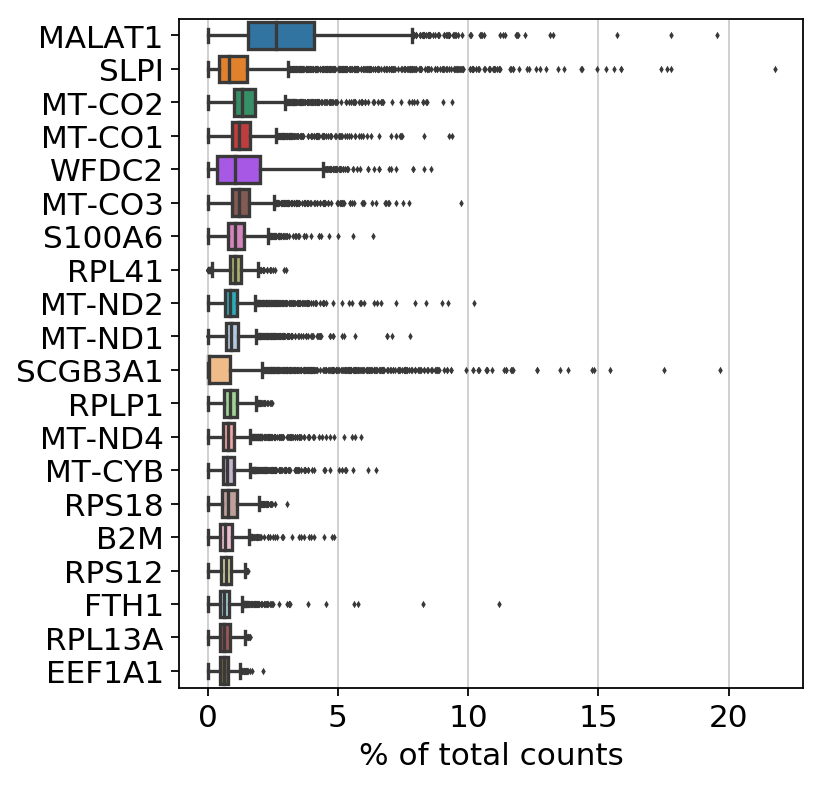

In [63]:
sc.pl.highest_expr_genes(D372_Brus_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


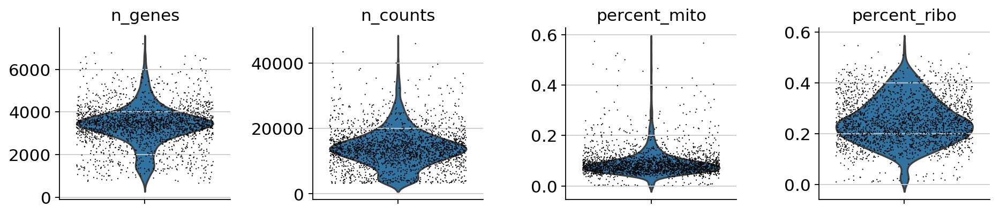

In [64]:
sc.pp.filter_cells(D372_Brus_Nas1, min_genes=0)
mito_genes = D372_Brus_Nas1.var_names.str.startswith('MT-')
D372_Brus_Nas1.obs['percent_mito'] = np.sum(
    D372_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Brus_Nas1.X, axis=1).A1
D372_Brus_Nas1.obs['n_counts'] = D372_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Brus_Nas1.to_df())
ribo_genes = D372_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D372_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D372_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Brus_Nas1.X, axis=1).A1
D372_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [65]:
sc.pp.filter_cells(D372_Brus_Nas1, min_genes=500)
D372_Brus_Nas1 = D372_Brus_Nas1[D372_Brus_Nas1.obs['n_counts'] < 40000, :]
D372_Brus_Nas1 = D372_Brus_Nas1[D372_Brus_Nas1.obs['percent_mito'] < 0.5, :]


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.22
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 15.0%
Overall doublet rate:
	Expected   = 1.9%
	Estimated  = 1.7%
Elapsed time: 2.1 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eca849a20>,
       dtype=object))

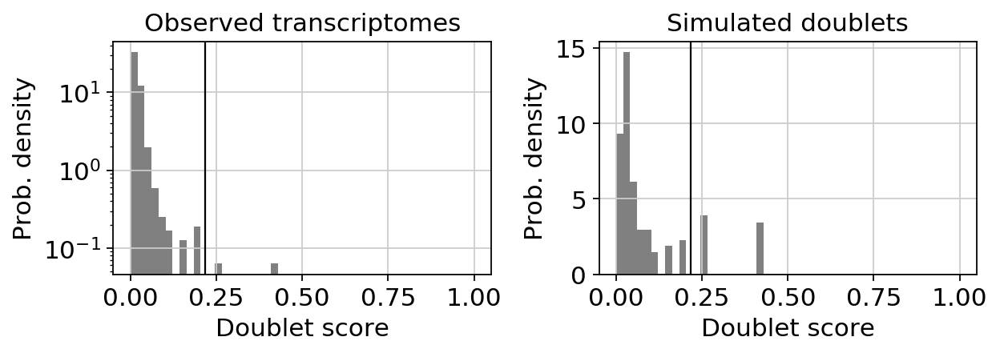

In [66]:
# scrublet
scrub = scr.Scrublet(D372_Brus_Nas1.X, expected_doublet_rate=0.019)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D372_Brus_Nas1.obs['doublet_scores'] = doublet_scores
D372_Brus_Nas1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [67]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D372_Brus_Nas1.X).predict()
D372_Brus_Nas1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.4104349613189697 seconds
Jaccard graph constructed in 0.48456406593322754 seconds
Wrote graph to binary file in 0.05161619186401367 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.902756
Louvain completed 21 runs in 1.038480281829834 seconds
PhenoGraph complete in 1.9975333213806152 seconds
Found communities [-1, ... 21], with sizes: [93, 457, 316, 305, 289, 288, 164, 146, 128, 114, 95, 67, 66, 65, 56, 50, 49, 35, 34, 34, 22, 21, 17]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbo

In [68]:
sc.pp.normalize_per_cell(D372_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Brus_Nas1) # log transform the data
D372_Brus_Nas1.raw = D372_Brus_Nas1 # freeze the object (for later use of the raw state of it)

In [69]:
D372_Brus_Nas1 = D372_Brus_Nas1[:, D372_Brus_Nas1.var['ribo_genes']]
D372_Brus_Nas1

View of AnnData object with n_obs × n_vars = 2329 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

# Proximal Biopsies
[Back to top](#Full-Aggregate)

In [70]:
D322_Biop_Pro1 = sc.read_10x_mtx(
    './D322_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D322_Biop_Pro1.var_names_make_unique()
D322_Biop_Pro1.obs['manip'] = 'D322_Biop_Pro1'
D322_Biop_Pro1.obs['position'] = 'Proximal'
D322_Biop_Pro1.obs['method'] = 'Biopsy'
D322_Biop_Pro1.obs['donor'] = 'D322'
D322_Biop_Pro1.obs['name'] = ['D322_Biop_Pro1_' + s for s in list(D322_Biop_Pro1.obs.index)]
D322_Biop_Pro1.obs_names = D322_Biop_Pro1.obs['name']
D322_Biop_Pro1

... reading from cache file ./cache/D322_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2035 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

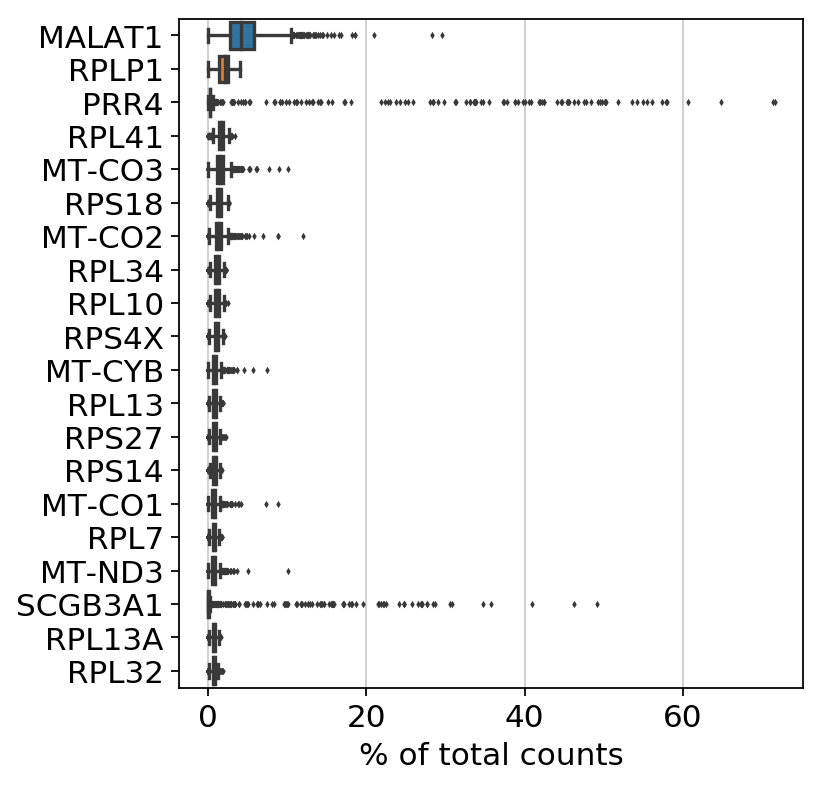

In [71]:
sc.pl.highest_expr_genes(D322_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


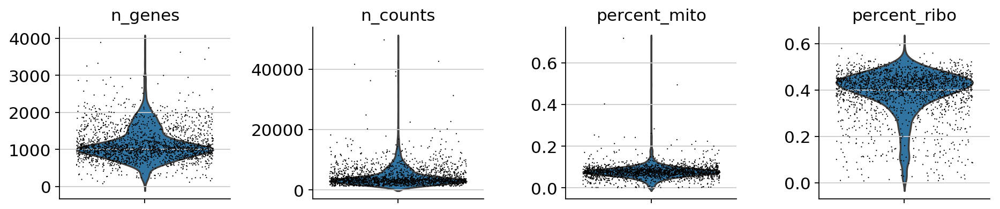

In [72]:
sc.pp.filter_cells(D322_Biop_Pro1, min_genes=0)
mito_genes = D322_Biop_Pro1.var_names.str.startswith('MT-')
D322_Biop_Pro1.obs['percent_mito'] = np.sum(
    D322_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D322_Biop_Pro1.X, axis=1).A1
D322_Biop_Pro1.obs['n_counts'] = D322_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D322_Biop_Pro1.to_df())
ribo_genes = D322_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D322_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D322_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D322_Biop_Pro1.X, axis=1).A1
D322_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D322_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [73]:
sc.pp.filter_cells(D322_Biop_Pro1, min_genes=500)
D322_Biop_Pro1 = D322_Biop_Pro1[D322_Biop_Pro1.obs['n_counts'] < 20000, :]
D322_Biop_Pro1 = D322_Biop_Pro1[D322_Biop_Pro1.obs['percent_mito'] < 0.3, :]


filtered out 60 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.18
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 9.6%
Overall doublet rate:
	Expected   = 1.6%
	Estimated  = 4.3%
Elapsed time: 1.0 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ebfe203c8>,
       dtype=object))

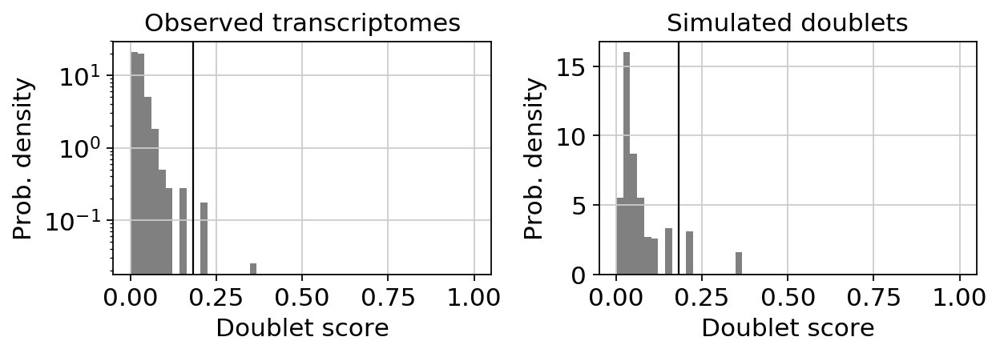

In [74]:
# scrublet
scrub = scr.Scrublet(D322_Biop_Pro1.X, expected_doublet_rate=0.016)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D322_Biop_Pro1.obs['doublet_scores'] = doublet_scores
D322_Biop_Pro1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [75]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D322_Biop_Pro1.X).predict()
D322_Biop_Pro1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.6393563747406006 seconds
Jaccard graph constructed in 0.4113748073577881 seconds
Wrote graph to binary file in 0.0392765998840332 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.900925
Louvain completed 21 runs in 1.0455265045166016 seconds
PhenoGraph complete in 2.1460633277893066 seconds
Found communities [-1, ... 18], with sizes: [140, 811, 395, 198, 155, 147, 92, 74, 68, 53, 48, 42, 38, 38, 35, 32, 28, 24, 22, 12]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0

In [76]:
sc.pp.normalize_per_cell(D322_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D322_Biop_Pro1) # log transform the data
D322_Biop_Pro1.raw = D322_Biop_Pro1 # freeze the object (for later use of the raw state of it)

In [77]:
D322_Biop_Pro1 = D322_Biop_Pro1[:, D322_Biop_Pro1.var['ribo_genes']]
D322_Biop_Pro1

View of AnnData object with n_obs × n_vars = 1962 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [78]:
D326_Biop_Pro1 = sc.read_10x_mtx(
    './D326_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D326_Biop_Pro1.var_names_make_unique()
D326_Biop_Pro1.obs['manip'] = 'D326_Biop_Pro1'
D326_Biop_Pro1.obs['position'] = 'Proximal'
D326_Biop_Pro1.obs['method'] = 'Biopsy'
D326_Biop_Pro1.obs['donor'] = 'D326'
D326_Biop_Pro1.obs['name'] = ['D326_Biop_Pro1_' + s for s in list(D326_Biop_Pro1.obs.index)]
D326_Biop_Pro1.obs_names = D326_Biop_Pro1.obs['name']
D326_Biop_Pro1

... reading from cache file ./cache/D326_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2941 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

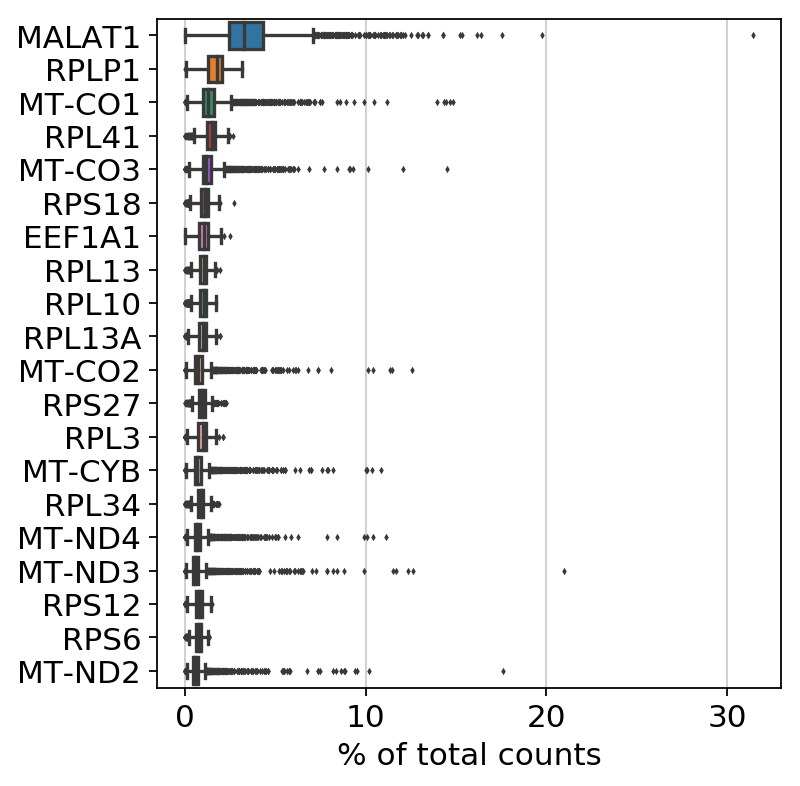

In [79]:
sc.pl.highest_expr_genes(D326_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


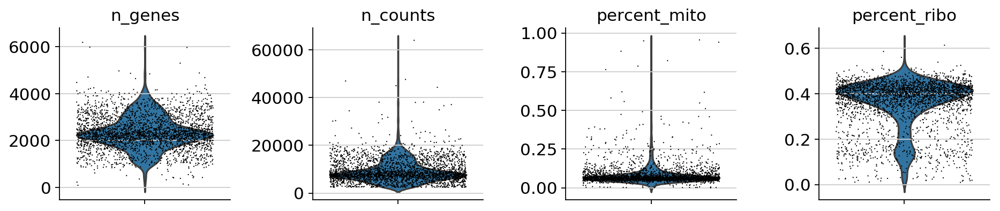

In [80]:
sc.pp.filter_cells(D326_Biop_Pro1, min_genes=0)
mito_genes = D326_Biop_Pro1.var_names.str.startswith('MT-')
D326_Biop_Pro1.obs['percent_mito'] = np.sum(
    D326_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D326_Biop_Pro1.X, axis=1).A1
D326_Biop_Pro1.obs['n_counts'] = D326_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D326_Biop_Pro1.to_df())
ribo_genes = D326_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D326_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D326_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D326_Biop_Pro1.X, axis=1).A1
D326_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D326_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [81]:
sc.pp.filter_cells(D326_Biop_Pro1, min_genes=500)
D326_Biop_Pro1 = D326_Biop_Pro1[D326_Biop_Pro1.obs['n_counts'] < 40000, :]
D326_Biop_Pro1 = D326_Biop_Pro1[D326_Biop_Pro1.obs['percent_mito'] < 0.5, :]


filtered out 12 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.27
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 22.9%
Overall doublet rate:
	Expected   = 2.3%
	Estimated  = 1.9%
Elapsed time: 2.3 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eca851ba8>,
       dtype=object))

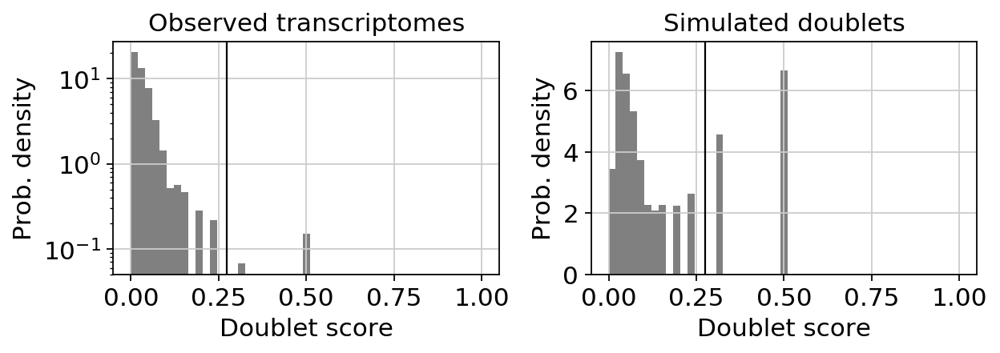

In [82]:
# scrublet
scrub = scr.Scrublet(D326_Biop_Pro1.X, expected_doublet_rate=0.023)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D326_Biop_Pro1.obs['doublet_scores'] = doublet_scores
D326_Biop_Pro1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [83]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D326_Biop_Pro1.X).predict()
D326_Biop_Pro1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.508995771408081 seconds
Jaccard graph constructed in 0.6974852085113525 seconds
Wrote graph to binary file in 0.05855703353881836 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.91892
Louvain completed 21 runs in 1.257519006729126 seconds
PhenoGraph complete in 2.546231269836426 seconds
Found communities [-1, ... 23], with sizes: [242, 1016, 445, 243, 205, 192, 166, 152, 133, 121, 115, 84, 79, 73, 67, 65, 46, 45, 43, 26, 22, 22, 16, 15, 14]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm


In [84]:
sc.pp.normalize_per_cell(D326_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D326_Biop_Pro1) # log transform the data
D326_Biop_Pro1.raw = D326_Biop_Pro1 # freeze the object (for later use of the raw state of it)

In [85]:
D326_Biop_Pro1 = D326_Biop_Pro1[:, D326_Biop_Pro1.var['ribo_genes']]
D326_Biop_Pro1

View of AnnData object with n_obs × n_vars = 2918 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [86]:
D339_Biop_Pro1 = sc.read_10x_mtx(
    './D339_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Biop_Pro1.var_names_make_unique()
D339_Biop_Pro1.obs['manip'] = 'D339_Biop_Pro1'
D339_Biop_Pro1.obs['position'] = 'Proximal'
D339_Biop_Pro1.obs['method'] = 'Biopsy'
D339_Biop_Pro1.obs['donor'] = 'D339'
D339_Biop_Pro1.obs['name'] = ['D339_Biop_Pro1_' + s for s in list(D339_Biop_Pro1.obs.index)]
D339_Biop_Pro1.obs_names = D339_Biop_Pro1.obs['name']
D339_Biop_Pro1

... reading from cache file ./cache/D339_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 762 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

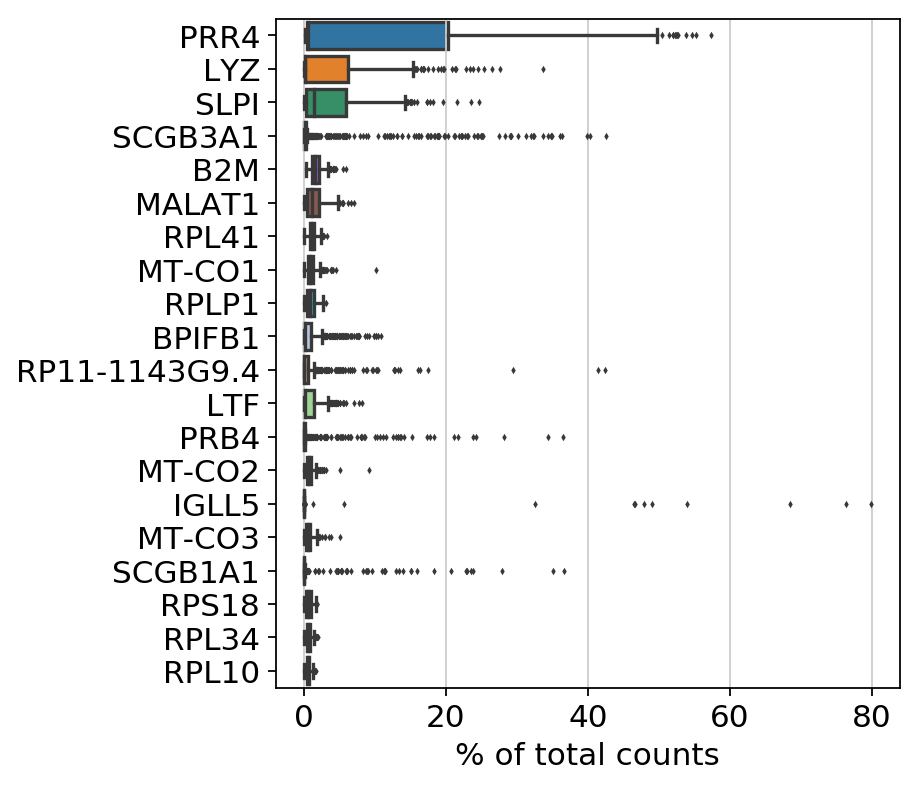

In [87]:
sc.pl.highest_expr_genes(D339_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


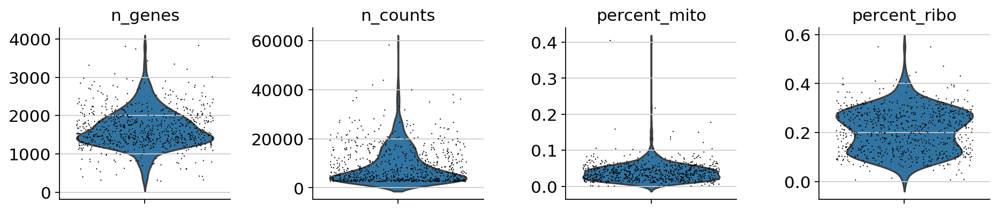

In [88]:
sc.pp.filter_cells(D339_Biop_Pro1, min_genes=0)
mito_genes = D339_Biop_Pro1.var_names.str.startswith('MT-')
D339_Biop_Pro1.obs['percent_mito'] = np.sum(
    D339_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Biop_Pro1.X, axis=1).A1
D339_Biop_Pro1.obs['n_counts'] = D339_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Biop_Pro1.to_df())
ribo_genes = D339_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D339_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D339_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Biop_Pro1.X, axis=1).A1
D339_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [89]:
sc.pp.filter_cells(D339_Biop_Pro1, min_genes=500)
D339_Biop_Pro1 = D339_Biop_Pro1[D339_Biop_Pro1.obs['n_counts'] < 40000, :]
D339_Biop_Pro1 = D339_Biop_Pro1[D339_Biop_Pro1.obs['percent_mito'] < 0.2, :]


filtered out 8 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.05
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 36.6%
Overall doublet rate:
	Expected   = 0.6%
	Estimated  = 0.4%
Elapsed time: 0.4 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ebf9c2898>,
       dtype=object))

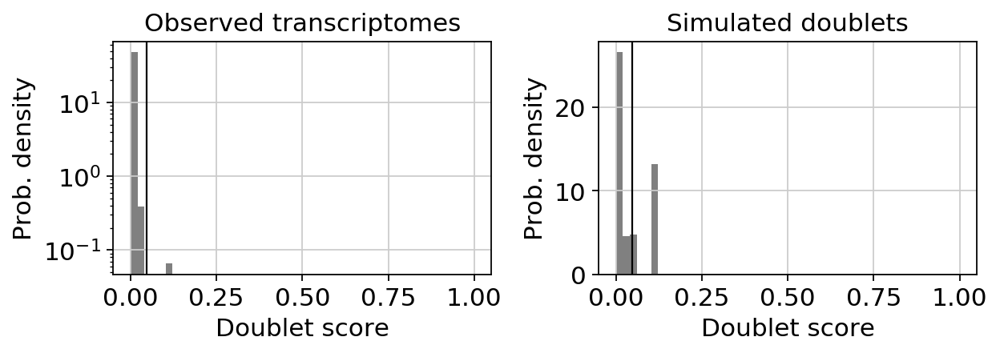

In [90]:
# scrublet
scrub = scr.Scrublet(D339_Biop_Pro1.X, expected_doublet_rate=0.006)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D339_Biop_Pro1.obs['doublet_scores'] = doublet_scores
D339_Biop_Pro1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [91]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D339_Biop_Pro1.X).predict()
D339_Biop_Pro1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.1105043888092041 seconds
Jaccard graph constructed in 0.3054227828979492 seconds
Wrote graph to binary file in 0.021872520446777344 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.871843
Louvain completed 21 runs in 0.8053634166717529 seconds
PhenoGraph complete in 1.2517876625061035 seconds
Found communities [-1, ... 13], with sizes: [108, 112, 98, 90, 77, 65, 65, 65, 54, 51, 47, 33, 31, 28, 12]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11123776435852051 sec

In [92]:
sc.pp.normalize_per_cell(D339_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Biop_Pro1) # log transform the data
D339_Biop_Pro1.raw = D339_Biop_Pro1 # freeze the object (for later use of the raw state of it)

In [93]:
D339_Biop_Pro1 = D339_Biop_Pro1[:, D339_Biop_Pro1.var['ribo_genes']]
D339_Biop_Pro1

View of AnnData object with n_obs × n_vars = 749 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [94]:
D344_Biop_Pro1 = sc.read_10x_mtx(
    './D344_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Biop_Pro1.var_names_make_unique()
D344_Biop_Pro1.obs['manip'] = 'D344_Biop_Pro1'
D344_Biop_Pro1.obs['position'] = 'Proximal'
D344_Biop_Pro1.obs['method'] = 'Biopsy'
D344_Biop_Pro1.obs['donor'] = 'D344'
D344_Biop_Pro1.obs['name'] = ['D344_Biop_Pro1_' + s for s in list(D344_Biop_Pro1.obs.index)]
D344_Biop_Pro1.obs_names = D344_Biop_Pro1.obs['name']
D344_Biop_Pro1

... reading from cache file ./cache/D344_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 313 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

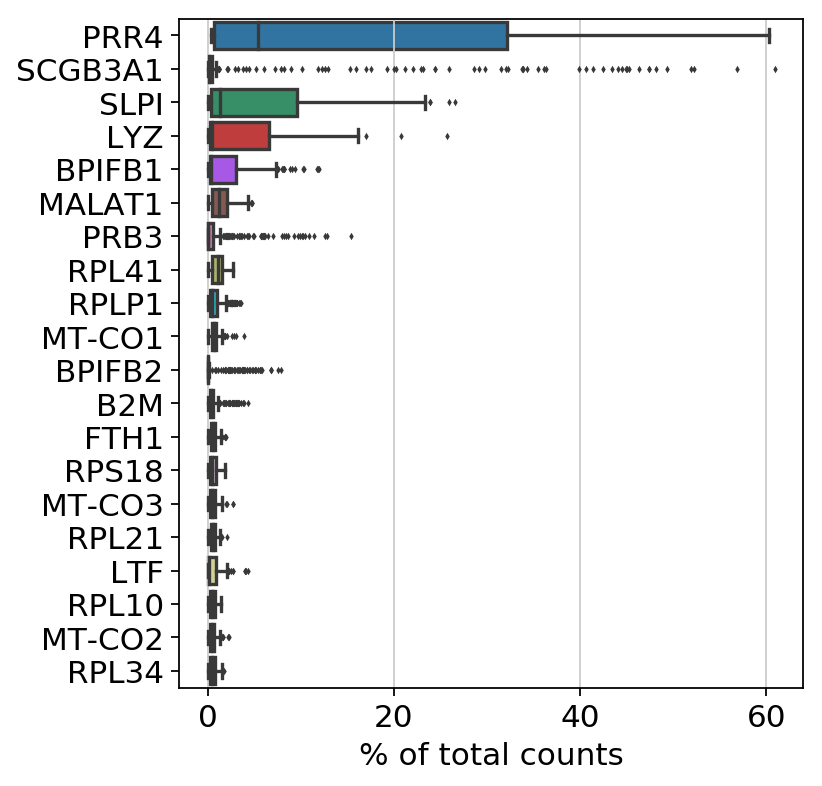

In [95]:
sc.pl.highest_expr_genes(D344_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


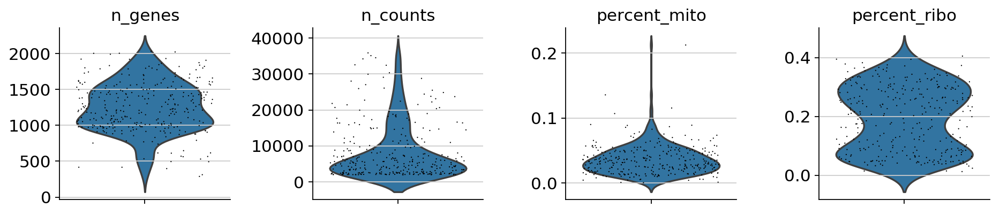

In [96]:
sc.pp.filter_cells(D344_Biop_Pro1, min_genes=0)
mito_genes = D344_Biop_Pro1.var_names.str.startswith('MT-')
D344_Biop_Pro1.obs['percent_mito'] = np.sum(
    D344_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Biop_Pro1.X, axis=1).A1
D344_Biop_Pro1.obs['n_counts'] = D344_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Biop_Pro1.to_df())
ribo_genes = D344_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D344_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D344_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Biop_Pro1.X, axis=1).A1
D344_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [97]:
sc.pp.filter_cells(D344_Biop_Pro1, min_genes=500)
D344_Biop_Pro1 = D344_Biop_Pro1[D344_Biop_Pro1.obs['n_counts'] < 40000, :]
D344_Biop_Pro1 = D344_Biop_Pro1[D344_Biop_Pro1.obs['percent_mito'] < 0.15, :]


filtered out 7 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.02
Detected doublet rate = 0.7%
Estimated detectable doublet fraction = 26.2%
Overall doublet rate:
	Expected   = 0.4%
	Estimated  = 2.5%
Elapsed time: 0.2 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb9d3ba58>,
       dtype=object))

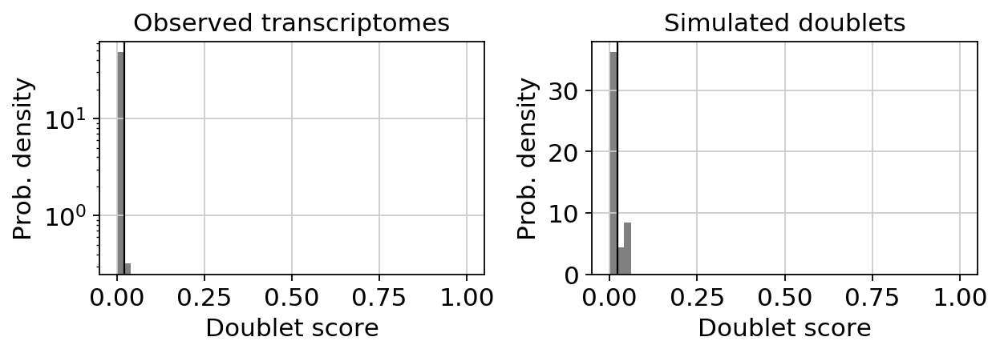

In [98]:
# scrublet
scrub = scr.Scrublet(D344_Biop_Pro1.X, expected_doublet_rate=0.004)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D344_Biop_Pro1.obs['doublet_scores'] = doublet_scores
D344_Biop_Pro1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [99]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D344_Biop_Pro1.X).predict()
D344_Biop_Pro1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.10980510711669922 seconds
Jaccard graph constructed in 0.2169487476348877 seconds
Wrote graph to binary file in 0.007748126983642578 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.809501
Louvain completed 21 runs in 0.8823840618133545 seconds
PhenoGraph complete in 1.2258474826812744 seconds
Found communities [-1, ... 6], with sizes: [100, 57, 49, 47, 43, 40, 26, 19]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11079072952270508 seconds
Jaccard graph constructe

In [100]:
sc.pp.normalize_per_cell(D344_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Biop_Pro1) # log transform the data
D344_Biop_Pro1.raw = D344_Biop_Pro1 # freeze the object (for later use of the raw state of it)

In [101]:
D344_Biop_Pro1 = D344_Biop_Pro1[:, D344_Biop_Pro1.var['ribo_genes']]
D344_Biop_Pro1

View of AnnData object with n_obs × n_vars = 305 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [102]:
D353_Biop_Pro1 = sc.read_10x_mtx(
    './D353_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Biop_Pro1.var_names_make_unique()
D353_Biop_Pro1.obs['manip'] = 'D353_Biop_Pro1'
D353_Biop_Pro1.obs['position'] = 'Proximal'
D353_Biop_Pro1.obs['method'] = 'Biopsy'
D353_Biop_Pro1.obs['donor'] = 'D353'
D353_Biop_Pro1.obs['name'] = ['D353_Biop_Pro1' + s for s in list(D353_Biop_Pro1.obs.index)]
D353_Biop_Pro1.obs_names = D353_Biop_Pro1.obs['name']
D353_Biop_Pro1

... reading from cache file ./cache/D353_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 4234 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

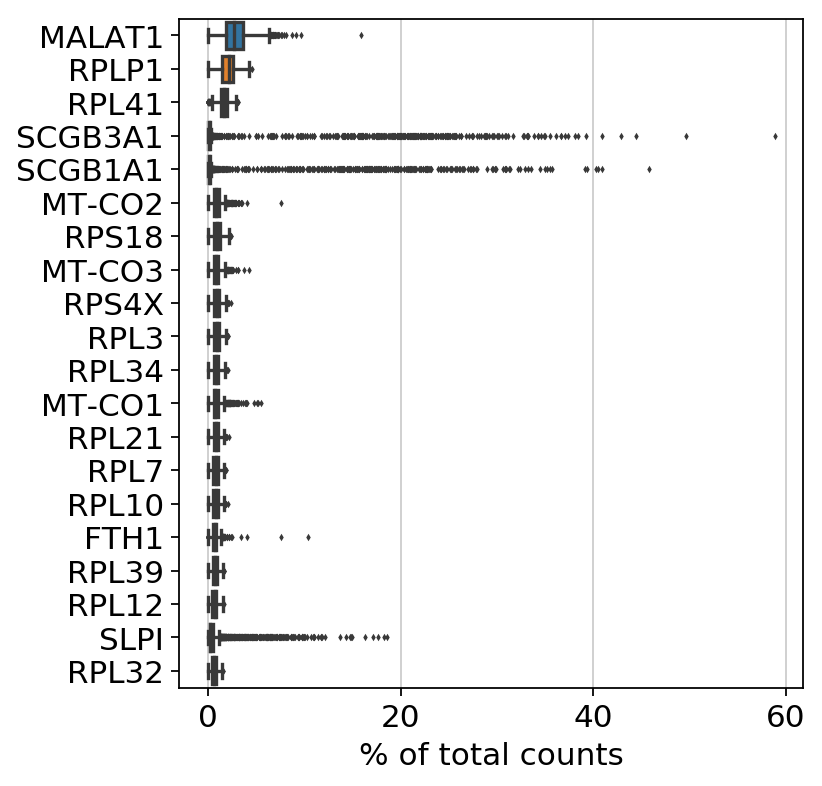

In [103]:
sc.pl.highest_expr_genes(D353_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


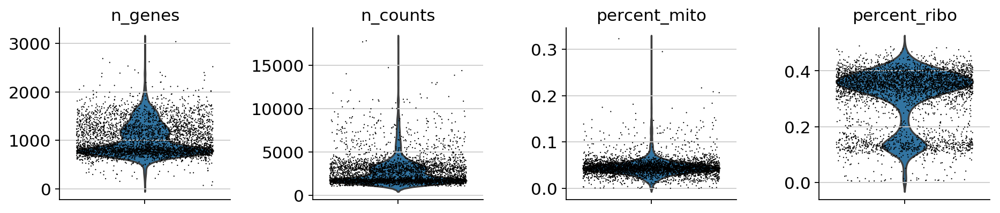

In [104]:
sc.pp.filter_cells(D353_Biop_Pro1, min_genes=0)
mito_genes = D353_Biop_Pro1.var_names.str.startswith('MT-')
D353_Biop_Pro1.obs['percent_mito'] = np.sum(
    D353_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D353_Biop_Pro1.X, axis=1).A1
D353_Biop_Pro1.obs['n_counts'] = D353_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Biop_Pro1.to_df())
ribo_genes = D353_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D353_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D353_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Biop_Pro1.X, axis=1).A1
D353_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [105]:
sc.pp.filter_cells(D353_Biop_Pro1, min_genes=500)
D353_Biop_Pro1 = D353_Biop_Pro1[D353_Biop_Pro1.obs['n_counts'] < 15000, :]
D353_Biop_Pro1 = D353_Biop_Pro1[D353_Biop_Pro1.obs['percent_mito'] < 0.25, :]


filtered out 41 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.39
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 17.4%
Overall doublet rate:
	Expected   = 3.2%
	Estimated  = 2.5%
Elapsed time: 2.6 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb9f09240>,
       dtype=object))

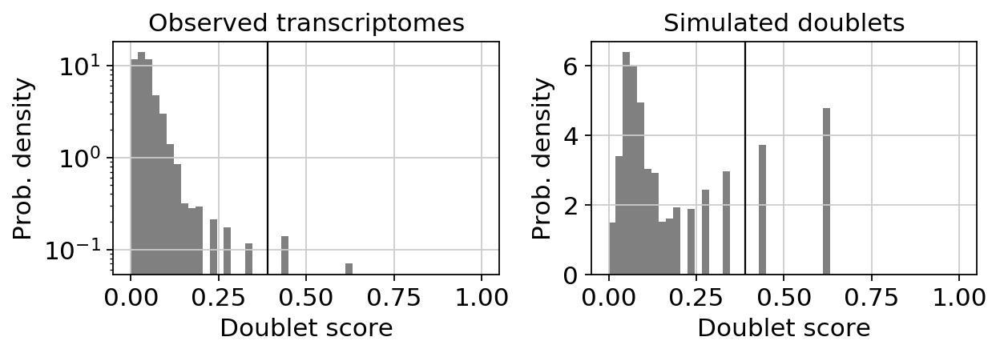

In [106]:
# scrublet
scrub = scr.Scrublet(D353_Biop_Pro1.X, expected_doublet_rate=0.032)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D353_Biop_Pro1.obs['doublet_scores'] = doublet_scores
D353_Biop_Pro1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [107]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D353_Biop_Pro1.X).predict()
D353_Biop_Pro1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.1124141216278076 seconds
Jaccard graph constructed in 0.6793932914733887 seconds
Wrote graph to binary file in 0.07717013359069824 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.898435
Louvain completed 21 runs in 1.5983195304870605 seconds
PhenoGraph complete in 3.4864113330841064 seconds
Found communities [-1, ... 20], with sizes: [293, 1875, 602, 412, 354, 339, 261, 206, 169, 143, 106, 103, 64, 56, 46, 37, 36, 35, 34, 29, 22, 15]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbo

In [108]:
sc.pp.normalize_per_cell(D353_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Biop_Pro1) # log transform the data
D353_Biop_Pro1.raw = D353_Biop_Pro1 # freeze the object (for later use of the raw state of it)

In [109]:
D353_Biop_Pro1 = D353_Biop_Pro1[:, D353_Biop_Pro1.var['ribo_genes']]
D353_Biop_Pro1

View of AnnData object with n_obs × n_vars = 4190 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [110]:
D354_Biop_Pro1 = sc.read_10x_mtx(
    './D354_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D354_Biop_Pro1.var_names_make_unique()
D354_Biop_Pro1.obs['manip'] = 'D354_Biop_Pro1'
D354_Biop_Pro1.obs['position'] = 'Proximal'
D354_Biop_Pro1.obs['method'] = 'Biopsy'
D354_Biop_Pro1.obs['donor'] = 'D354'
D354_Biop_Pro1.obs['name'] = ['D354_Biop_Pro1_' + s for s in list(D354_Biop_Pro1.obs.index)]
D354_Biop_Pro1.obs_names = D354_Biop_Pro1.obs['name']
D354_Biop_Pro1

... reading from cache file ./cache/D354_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1877 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

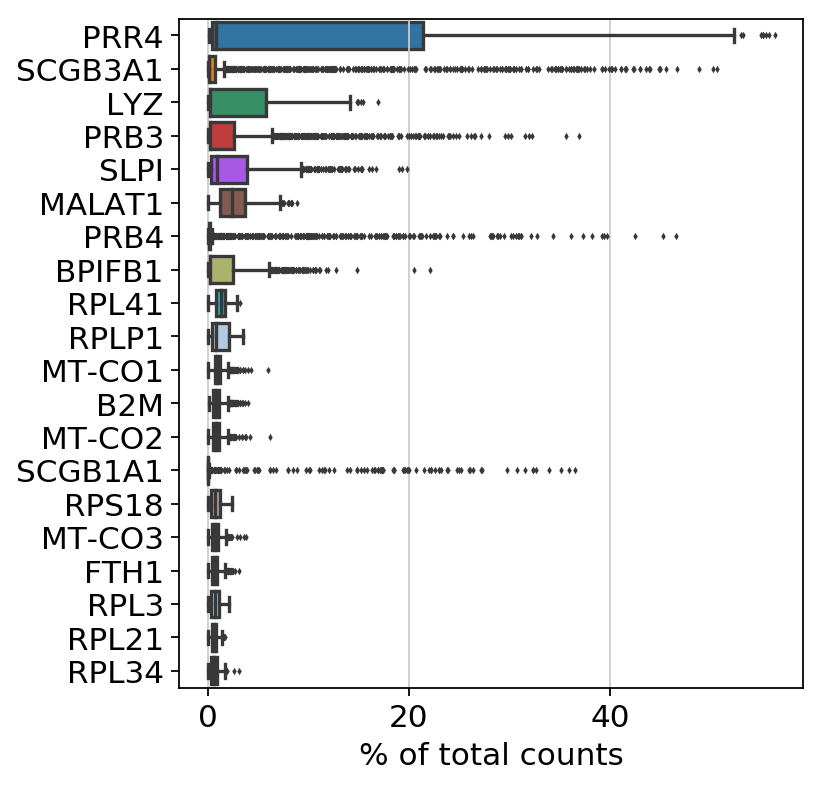

In [111]:
sc.pl.highest_expr_genes(D354_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


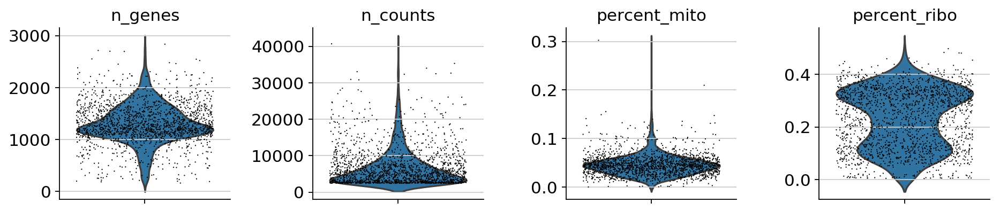

In [112]:
sc.pp.filter_cells(D354_Biop_Pro1, min_genes=0)
mito_genes = D354_Biop_Pro1.var_names.str.startswith('MT-')
D354_Biop_Pro1.obs['percent_mito'] = np.sum(
    D354_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D354_Biop_Pro1.X, axis=1).A1
D354_Biop_Pro1.obs['n_counts'] = D354_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D354_Biop_Pro1.to_df())
ribo_genes = D354_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D354_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D354_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D354_Biop_Pro1.X, axis=1).A1
D354_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D354_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [113]:
sc.pp.filter_cells(D354_Biop_Pro1, min_genes=500)
D354_Biop_Pro1 = D354_Biop_Pro1[D354_Biop_Pro1.obs['n_counts'] < 30000, :]
D354_Biop_Pro1 = D354_Biop_Pro1[D354_Biop_Pro1.obs['percent_mito'] < 0.15, :]


filtered out 57 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.17
Detected doublet rate = 0.7%
Estimated detectable doublet fraction = 34.1%
Overall doublet rate:
	Expected   = 1.6%
	Estimated  = 2.1%
Elapsed time: 1.2 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb4405940>,
       dtype=object))

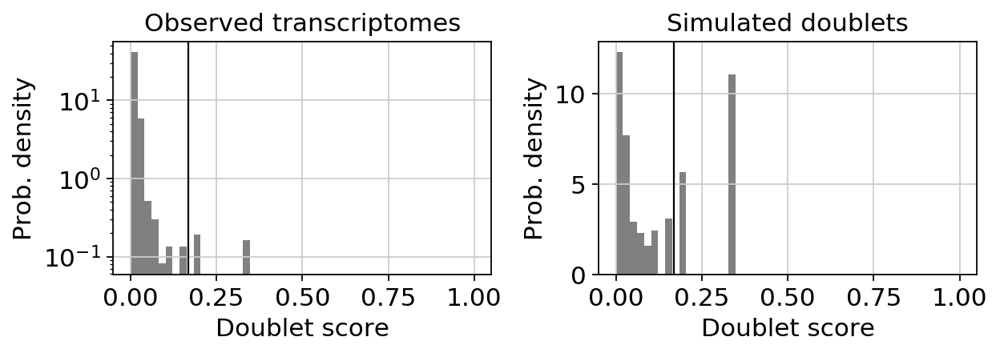

In [114]:
# scrublet
scrub = scr.Scrublet(D354_Biop_Pro1.X, expected_doublet_rate=0.016)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D354_Biop_Pro1.obs['doublet_scores'] = doublet_scores
D354_Biop_Pro1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [115]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D354_Biop_Pro1.X).predict()
D354_Biop_Pro1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.20798563957214355 seconds
Jaccard graph constructed in 0.43631482124328613 seconds
Wrote graph to binary file in 0.03902935981750488 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.894808
Louvain completed 21 runs in 1.1114189624786377 seconds
PhenoGraph complete in 1.8260626792907715 seconds
Found communities [-1, ... 20], with sizes: [224, 369, 250, 203, 158, 151, 149, 135, 107, 85, 65, 60, 57, 54, 51, 31, 24, 22, 20, 18, 15, 13]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors

In [116]:
sc.pp.normalize_per_cell(D354_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D354_Biop_Pro1) # log transform the data
D354_Biop_Pro1.raw = D354_Biop_Pro1 # freeze the object (for later use of the raw state of it)

In [117]:
D354_Biop_Pro1 = D354_Biop_Pro1[:, D354_Biop_Pro1.var['ribo_genes']]
D354_Biop_Pro1

View of AnnData object with n_obs × n_vars = 1809 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [118]:
D363_Biop_Pro1 = sc.read_10x_mtx(
    './D363_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Biop_Pro1.var_names_make_unique()
D363_Biop_Pro1.obs['manip'] = 'D363_Biop_Pro1'
D363_Biop_Pro1.obs['position'] = 'Proximal'
D363_Biop_Pro1.obs['method'] = 'Biopsy'
D363_Biop_Pro1.obs['donor'] = 'D363'
D363_Biop_Pro1.obs['name'] = ['D363_Biop_Pro1_' + s for s in list(D363_Biop_Pro1.obs.index)]
D363_Biop_Pro1.obs_names = D363_Biop_Pro1.obs['name']
D363_Biop_Pro1

... reading from cache file ./cache/D363_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1531 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

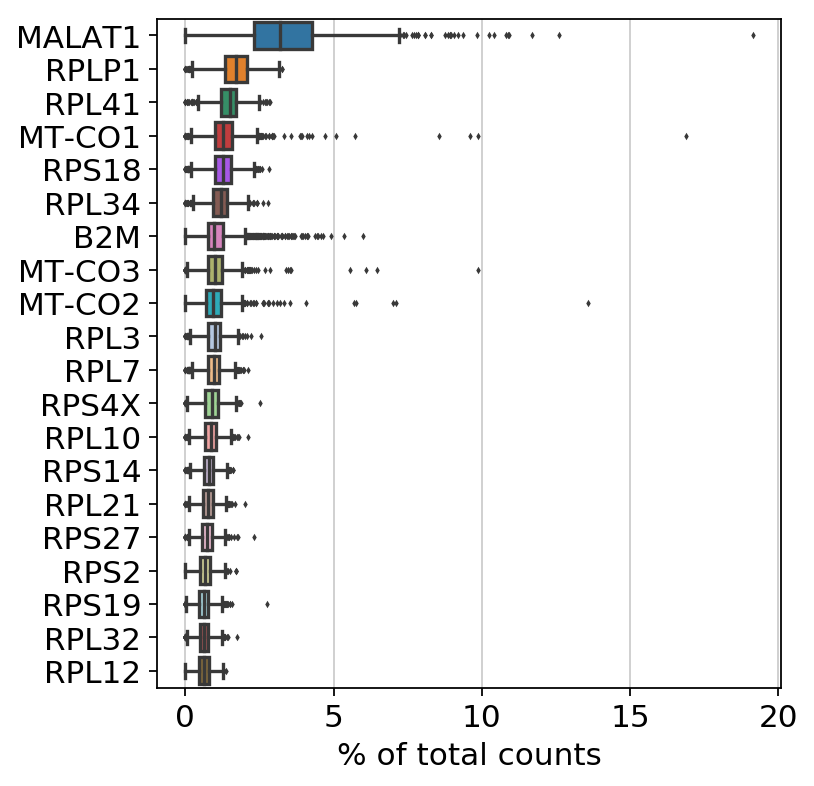

In [119]:
sc.pl.highest_expr_genes(D363_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


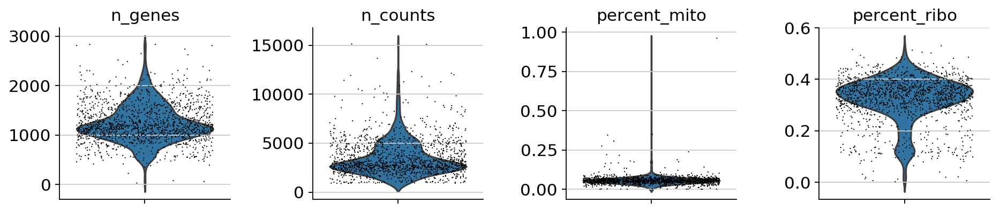

In [120]:
sc.pp.filter_cells(D363_Biop_Pro1, min_genes=0)
mito_genes = D363_Biop_Pro1.var_names.str.startswith('MT-')
D363_Biop_Pro1.obs['percent_mito'] = np.sum(
    D363_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D363_Biop_Pro1.X, axis=1).A1
D363_Biop_Pro1.obs['n_counts'] = D363_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Biop_Pro1.to_df())
ribo_genes = D363_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D363_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D363_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Biop_Pro1.X, axis=1).A1
D363_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [121]:
sc.pp.filter_cells(D363_Biop_Pro1, min_genes=500)
D363_Biop_Pro1 = D363_Biop_Pro1[D363_Biop_Pro1.obs['n_counts'] < 15000, :]
D363_Biop_Pro1 = D363_Biop_Pro1[D363_Biop_Pro1.obs['percent_mito'] < 0.25, :]


filtered out 20 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.12
Detected doublet rate = 0.7%
Estimated detectable doublet fraction = 17.0%
Overall doublet rate:
	Expected   = 1.1%
	Estimated  = 3.9%
Elapsed time: 0.8 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb46fca90>,
       dtype=object))

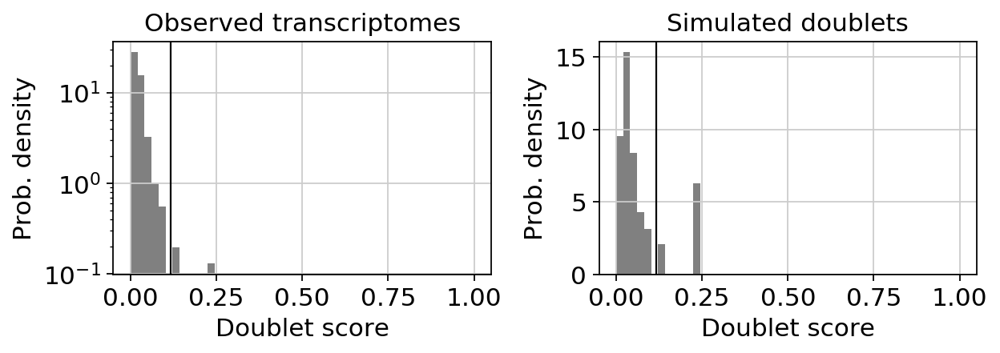

In [122]:
# scrublet
scrub = scr.Scrublet(D363_Biop_Pro1.X, expected_doublet_rate=0.011)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D363_Biop_Pro1.obs['doublet_scores'] = doublet_scores
D363_Biop_Pro1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [123]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D363_Biop_Pro1.X).predict()
D363_Biop_Pro1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.30674242973327637 seconds
Jaccard graph constructed in 0.4128077030181885 seconds
Wrote graph to binary file in 0.02238774299621582 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.869635
Louvain completed 21 runs in 1.0842034816741943 seconds
PhenoGraph complete in 1.836641788482666 seconds
Found communities [-1, ... 14], with sizes: [279, 496, 313, 213, 140, 76, 64, 62, 58, 41, 35, 28, 25, 19, 18, 18]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.208500385284423

In [124]:
sc.pp.normalize_per_cell(D363_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Biop_Pro1) # log transform the data
D363_Biop_Pro1.raw = D363_Biop_Pro1 # freeze the object (for later use of the raw state of it)

In [125]:
D363_Biop_Pro1 = D363_Biop_Pro1[:, D363_Biop_Pro1.var['ribo_genes']]
D363_Biop_Pro1

View of AnnData object with n_obs × n_vars = 1508 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [126]:
D367_Biop_Pro1 = sc.read_10x_mtx(
    './D367_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Biop_Pro1.var_names_make_unique()
D367_Biop_Pro1.obs['manip'] = 'D367_Biop_Pro1'
D367_Biop_Pro1.obs['position'] = 'Proximal'
D367_Biop_Pro1.obs['method'] = 'Biopsy'
D367_Biop_Pro1.obs['donor'] = 'D367'
D367_Biop_Pro1.obs['name'] = ['D367_Biop_Pro1_' + s for s in list(D367_Biop_Pro1.obs.index)]
D367_Biop_Pro1.obs_names = D367_Biop_Pro1.obs['name']
D367_Biop_Pro1

... reading from cache file ./cache/D367_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 3180 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

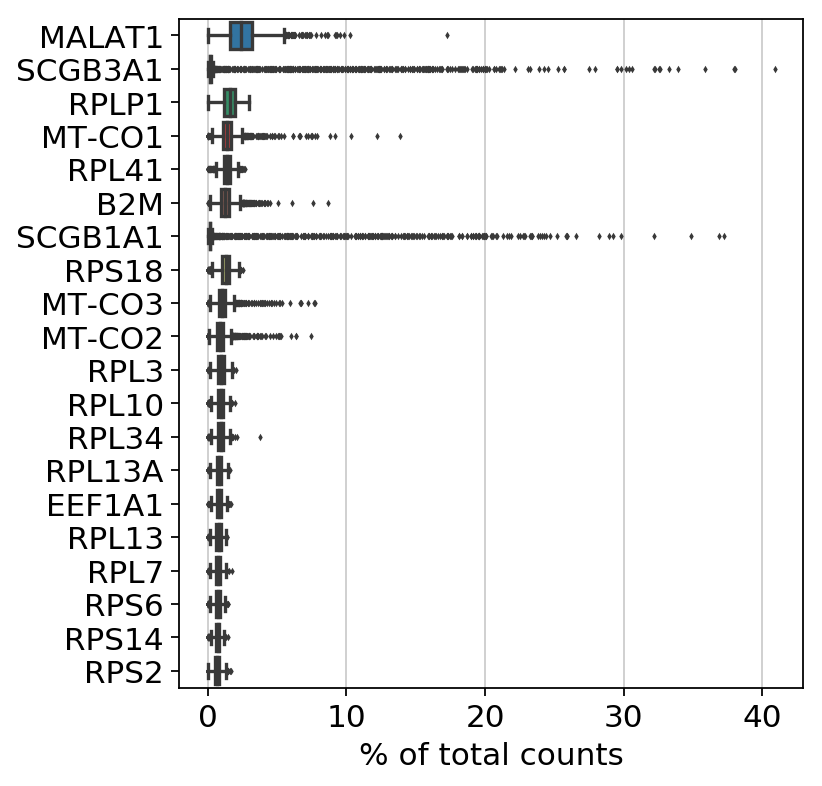

In [127]:
sc.pl.highest_expr_genes(D367_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


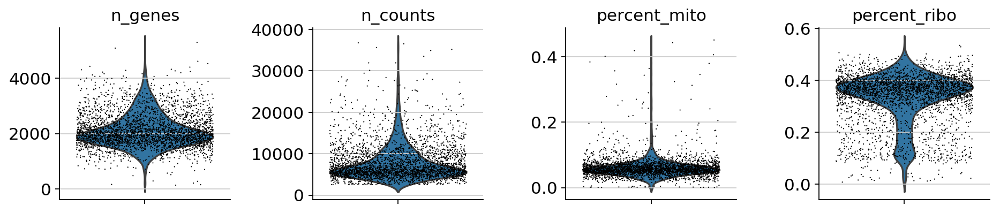

In [128]:
sc.pp.filter_cells(D367_Biop_Pro1, min_genes=0)
mito_genes = D367_Biop_Pro1.var_names.str.startswith('MT-')
D367_Biop_Pro1.obs['percent_mito'] = np.sum(
    D367_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Biop_Pro1.X, axis=1).A1
D367_Biop_Pro1.obs['n_counts'] = D367_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Biop_Pro1.to_df())
ribo_genes = D367_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D367_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D367_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Biop_Pro1.X, axis=1).A1
D367_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [129]:
sc.pp.filter_cells(D367_Biop_Pro1, min_genes=500)
D367_Biop_Pro1 = D367_Biop_Pro1[D367_Biop_Pro1.obs['n_counts'] < 30000, :]
D367_Biop_Pro1 = D367_Biop_Pro1[D367_Biop_Pro1.obs['percent_mito'] < 0.4, :]


filtered out 7 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.30
Detected doublet rate = 0.6%
Estimated detectable doublet fraction = 16.0%
Overall doublet rate:
	Expected   = 2.4%
	Estimated  = 3.8%
Elapsed time: 2.4 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb62285c0>,
       dtype=object))

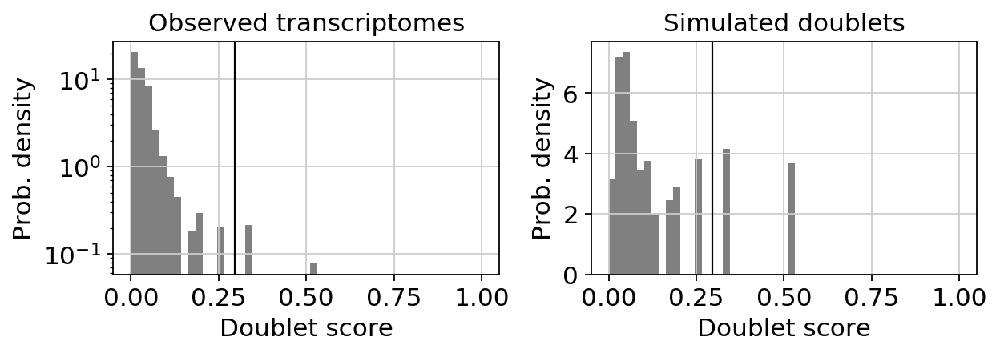

In [130]:
# scrublet
scrub = scr.Scrublet(D367_Biop_Pro1.X, expected_doublet_rate=0.024)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D367_Biop_Pro1.obs['doublet_scores'] = doublet_scores
D367_Biop_Pro1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [131]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D367_Biop_Pro1.X).predict()
D367_Biop_Pro1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.8105325698852539 seconds
Jaccard graph constructed in 0.5572328567504883 seconds
Wrote graph to binary file in 0.05981707572937012 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.920174
Louvain completed 21 runs in 1.4654748439788818 seconds
PhenoGraph complete in 2.9070277214050293 seconds
Found communities [-1, ... 21], with sizes: [194, 1216, 420, 238, 223, 212, 167, 158, 137, 115, 108, 94, 92, 85, 83, 80, 74, 53, 52, 49, 40, 35, 23]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neig

In [132]:
sc.pp.normalize_per_cell(D367_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Biop_Pro1) # log transform the data
D367_Biop_Pro1.raw = D367_Biop_Pro1 # freeze the object (for later use of the raw state of it)

In [133]:
D367_Biop_Pro1 = D367_Biop_Pro1[:, D367_Biop_Pro1.var['ribo_genes']]
D367_Biop_Pro1

View of AnnData object with n_obs × n_vars = 3159 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [134]:
D372_Biop_Pro1 = sc.read_10x_mtx(
    './D372_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Biop_Pro1.var_names_make_unique()
D372_Biop_Pro1.obs['manip'] = 'D372_Biop_Pro1'
D372_Biop_Pro1.obs['position'] = 'Proximal'
D372_Biop_Pro1.obs['method'] = 'Biopsy'
D372_Biop_Pro1.obs['donor'] = 'D372'
D372_Biop_Pro1.obs['name'] = ['D372_Biop_Pro1_' + s for s in list(D372_Biop_Pro1.obs.index)]
D372_Biop_Pro1.obs_names = D372_Biop_Pro1.obs['name']
D372_Biop_Pro1

... reading from cache file ./cache/D372_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 4585 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

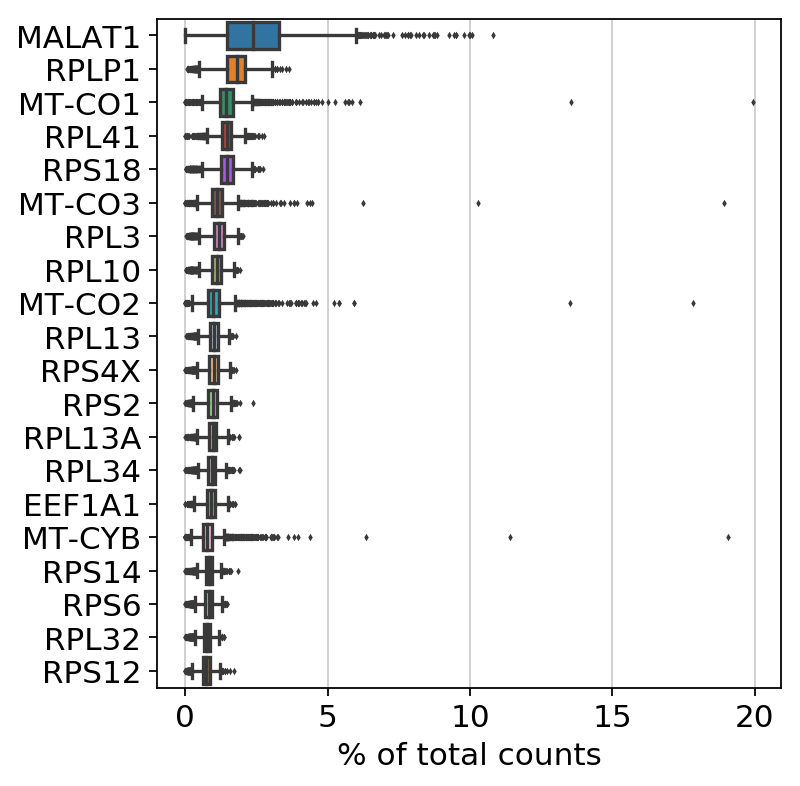

In [135]:
sc.pl.highest_expr_genes(D372_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


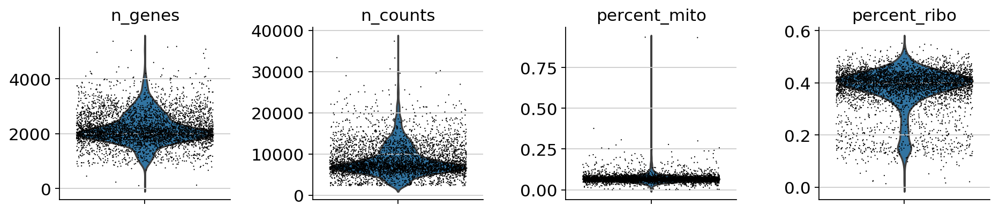

In [136]:
sc.pp.filter_cells(D372_Biop_Pro1, min_genes=0)
mito_genes = D372_Biop_Pro1.var_names.str.startswith('MT-')
D372_Biop_Pro1.obs['percent_mito'] = np.sum(
    D372_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Biop_Pro1.X, axis=1).A1
D372_Biop_Pro1.obs['n_counts'] = D372_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Biop_Pro1.to_df())
ribo_genes = D372_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D372_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D372_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Biop_Pro1.X, axis=1).A1
D372_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [137]:
sc.pp.filter_cells(D372_Biop_Pro1, min_genes=500)
D372_Biop_Pro1 = D372_Biop_Pro1[D372_Biop_Pro1.obs['n_counts'] < 30000, :]
D372_Biop_Pro1 = D372_Biop_Pro1[D372_Biop_Pro1.obs['percent_mito'] < 0.3, :]


filtered out 4 cells that have less than 500 genes expressed


Preprocessing...


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/scrublet/helper_functions.py:238: RuntimeWarning: invalid value encountered in log
  gLog = lambda input: np.log(input[1] * np.exp(-input[0]) + input[2])


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.45
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 7.3%
Overall doublet rate:
	Expected   = 3.8%
	Estimated  = 4.2%
Elapsed time: 4.0 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb663b198>,
       dtype=object))

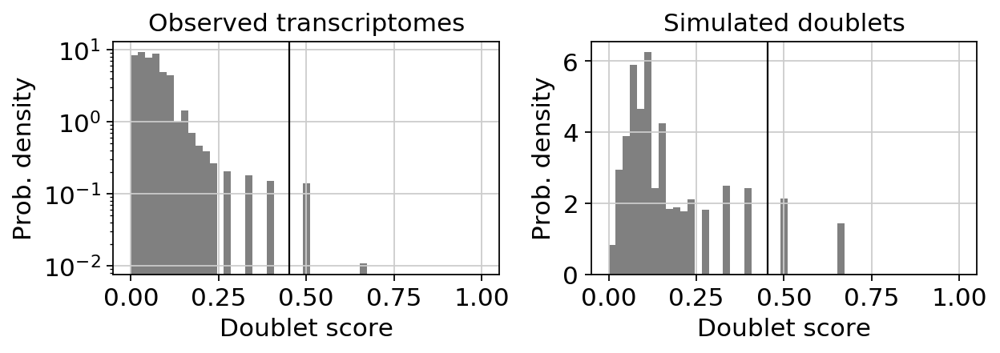

In [138]:
# scrublet
scrub = scr.Scrublet(D372_Biop_Pro1.X, expected_doublet_rate=0.038)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D372_Biop_Pro1.obs['doublet_scores'] = doublet_scores
D372_Biop_Pro1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [139]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D372_Biop_Pro1.X).predict()
D372_Biop_Pro1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.9112594127655029 seconds
Jaccard graph constructed in 0.7462267875671387 seconds
Wrote graph to binary file in 0.28792905807495117 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.928885
Louvain completed 21 runs in 1.7388286590576172 seconds
PhenoGraph complete in 3.702601909637451 seconds
Found communities [-1, ... 23], with sizes: [238, 1608, 936, 499, 469, 425, 221, 191, 121, 120, 109, 105, 100, 92, 78, 66, 64, 54, 50, 41, 39, 34, 25, 21, 11]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algor

In [140]:
sc.pp.normalize_per_cell(D372_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Biop_Pro1) # log transform the data
D372_Biop_Pro1.raw = D372_Biop_Pro1 # freeze the object (for later use of the raw state of it)

In [141]:
D372_Biop_Pro1 = D372_Biop_Pro1[:, D372_Biop_Pro1.var['ribo_genes']]
D372_Biop_Pro1

View of AnnData object with n_obs × n_vars = 4574 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

# Intermediate Biopsies
[Back to top](#Full-Aggregate)

In [142]:
D322_Biop_Int1 = sc.read_10x_mtx(
    './D322_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D322_Biop_Int1.var_names_make_unique()
D322_Biop_Int1.obs['manip'] = 'D322_Biop_Int1'
D322_Biop_Int1.obs['position'] = 'Intermediate'
D322_Biop_Int1.obs['method'] = 'Biopsy'
D322_Biop_Int1.obs['donor'] = 'D322'
D322_Biop_Int1.obs['name'] = ['D322_Biop_Int1_' + s for s in list(D322_Biop_Int1.obs.index)]
D322_Biop_Int1.obs_names = D322_Biop_Int1.obs['name']
D322_Biop_Int1

... reading from cache file ./cache/D322_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1923 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

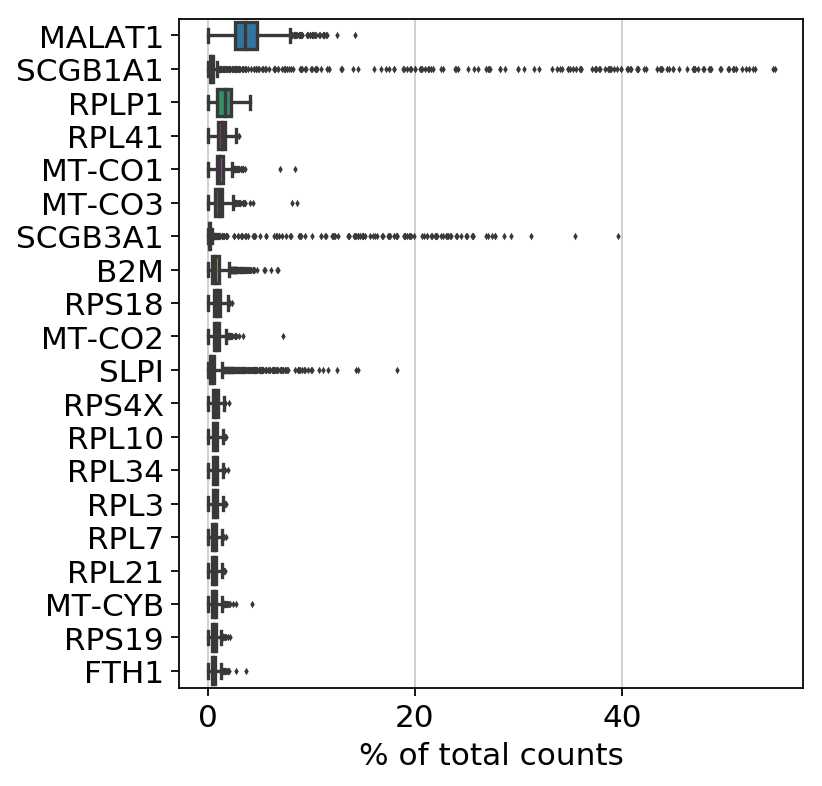

In [143]:
sc.pl.highest_expr_genes(D322_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


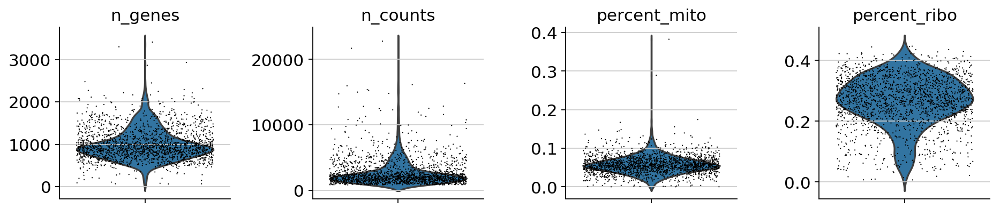

In [144]:
sc.pp.filter_cells(D322_Biop_Int1, min_genes=0)
mito_genes = D322_Biop_Int1.var_names.str.startswith('MT-')
D322_Biop_Int1.obs['percent_mito'] = np.sum(
    D322_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D322_Biop_Int1.X, axis=1).A1
D322_Biop_Int1.obs['n_counts'] = D322_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D322_Biop_Int1.to_df())
ribo_genes = D322_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D322_Biop_Int1.obs['percent_ribo'] = np.sum(
    D322_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D322_Biop_Int1.X, axis=1).A1
D322_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D322_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [145]:
sc.pp.filter_cells(D322_Biop_Int1, min_genes=500)
D322_Biop_Int1 = D322_Biop_Int1[D322_Biop_Int1.obs['n_counts'] < 20000, :]
D322_Biop_Int1 = D322_Biop_Int1[D322_Biop_Int1.obs['percent_mito'] < 0.2 , :]


filtered out 64 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.18
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 16.4%
Overall doublet rate:
	Expected   = 1.6%
	Estimated  = 2.6%
Elapsed time: 0.9 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb5251908>,
       dtype=object))

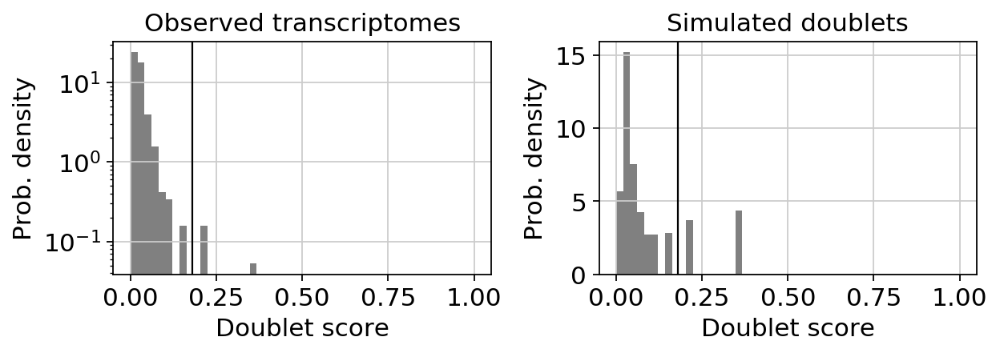

In [146]:
# scrublet
scrub = scr.Scrublet(D322_Biop_Int1.X, expected_doublet_rate=0.016)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D322_Biop_Int1.obs['doublet_scores'] = doublet_scores
D322_Biop_Int1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [147]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D322_Biop_Int1.X).predict()
D322_Biop_Int1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.4068300724029541 seconds
Jaccard graph constructed in 0.4693014621734619 seconds
Wrote graph to binary file in 0.031632184982299805 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.87247
After 12 runs, maximum modularity is Q = 0.873539
Louvain completed 32 runs in 1.9383304119110107 seconds
PhenoGraph complete in 2.8590123653411865 seconds
Found communities [-1, ... 16], with sizes: [201, 587, 261, 196, 170, 154, 117, 111, 88, 75, 68, 59, 55, 53, 49, 32, 23, 22]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric

In [148]:
sc.pp.normalize_per_cell(D322_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D322_Biop_Int1) # log transform the data
D322_Biop_Int1.raw = D322_Biop_Int1 # freeze the object (for later use of the raw state of it)

In [149]:
D322_Biop_Int1 = D322_Biop_Int1[:, D322_Biop_Int1.var['ribo_genes']]
D322_Biop_Int1

View of AnnData object with n_obs × n_vars = 1857 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [150]:
D326_Biop_Int1 = sc.read_10x_mtx(
    './D326_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D326_Biop_Int1.var_names_make_unique()
D326_Biop_Int1.obs['manip'] = 'D326_Biop_Int1'
D326_Biop_Int1.obs['position'] = 'Intermediate'
D326_Biop_Int1.obs['method'] = 'Biopsy'
D326_Biop_Int1.obs['donor'] = 'D326'
D326_Biop_Int1.obs['name'] = ['D326_Biop_Int1_' + s for s in list(D326_Biop_Int1.obs.index)]
D326_Biop_Int1.obs_names = D326_Biop_Int1.obs['name']
D326_Biop_Int1

... reading from cache file ./cache/D326_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1248 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

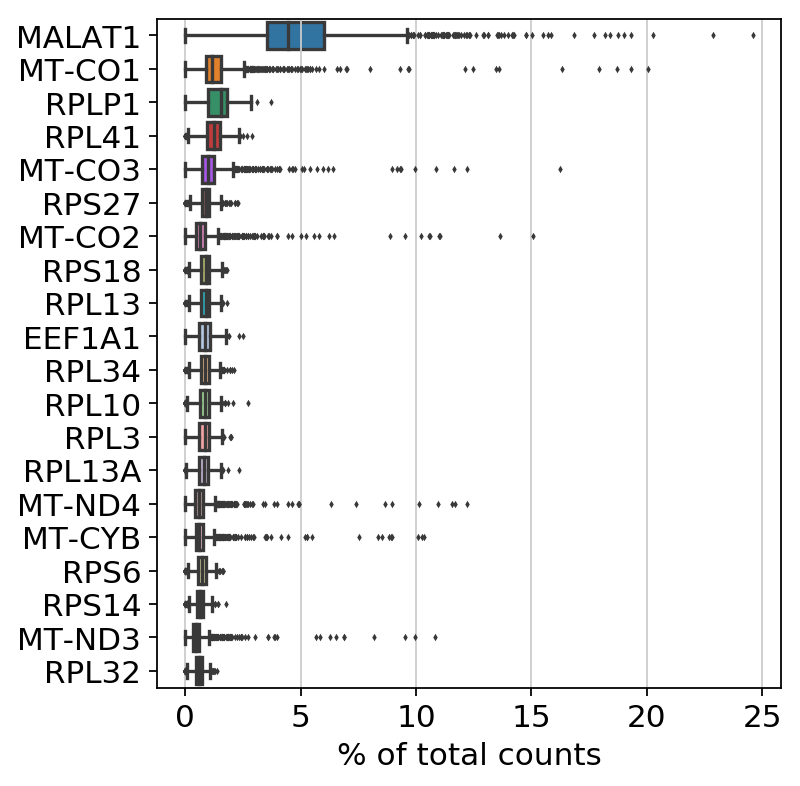

In [151]:
sc.pl.highest_expr_genes(D326_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


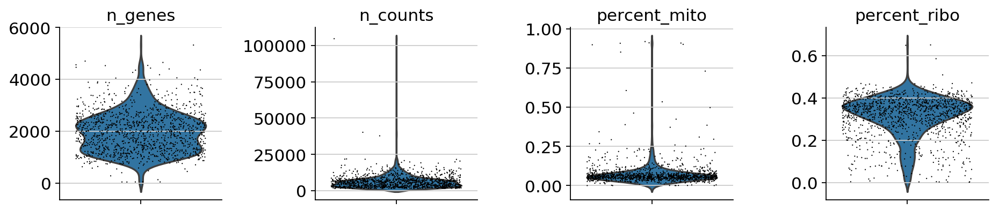

In [152]:
sc.pp.filter_cells(D326_Biop_Int1, min_genes=0)
mito_genes = D326_Biop_Int1.var_names.str.startswith('MT-')
D326_Biop_Int1.obs['percent_mito'] = np.sum(
    D326_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D326_Biop_Int1.X, axis=1).A1
D326_Biop_Int1.obs['n_counts'] = D326_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D326_Biop_Int1.to_df())
ribo_genes = D326_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D326_Biop_Int1.obs['percent_ribo'] = np.sum(
    D326_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D326_Biop_Int1.X, axis=1).A1
D326_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D326_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [153]:
sc.pp.filter_cells(D326_Biop_Int1, min_genes=500)
D326_Biop_Int1 = D326_Biop_Int1[D326_Biop_Int1.obs['n_counts'] < 25000, :]
D326_Biop_Int1 = D326_Biop_Int1[D326_Biop_Int1.obs['percent_mito'] < 0.3, :]


filtered out 11 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.11
Detected doublet rate = 0.7%
Estimated detectable doublet fraction = 16.1%
Overall doublet rate:
	Expected   = 1.1%
	Estimated  = 4.1%
Elapsed time: 0.7 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb019b240>,
       dtype=object))

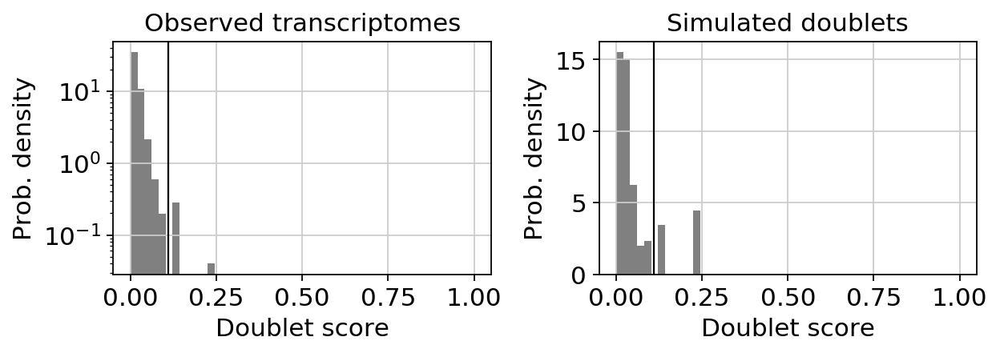

In [154]:
# scrublet
scrub = scr.Scrublet(D326_Biop_Int1.X, expected_doublet_rate=0.011)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D326_Biop_Int1.obs['doublet_scores'] = doublet_scores
D326_Biop_Int1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [155]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D326_Biop_Int1.X).predict()
D326_Biop_Int1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.21250677108764648 seconds
Jaccard graph constructed in 0.3636820316314697 seconds
Wrote graph to binary file in 0.02783966064453125 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.872555
After 2 runs, maximum modularity is Q = 0.876168
Louvain completed 22 runs in 1.3342251777648926 seconds
PhenoGraph complete in 1.9531424045562744 seconds
Found communities [-1, ... 16], with sizes: [245, 265, 183, 152, 106, 72, 70, 69, 64, 60, 55, 40, 35, 31, 29, 28, 15, 13]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric an

In [156]:
sc.pp.normalize_per_cell(D326_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D326_Biop_Int1) # log transform the data
D326_Biop_Int1.raw = D326_Biop_Int1 # freeze the object (for later use of the raw state of it)

In [157]:
D326_Biop_Int1 = D326_Biop_Int1[:, D326_Biop_Int1.var['ribo_genes']]
D326_Biop_Int1

View of AnnData object with n_obs × n_vars = 1226 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [158]:
D339_Biop_Int1 = sc.read_10x_mtx(
    './D339_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Biop_Int1.var_names_make_unique()
D339_Biop_Int1.obs['manip'] = 'D339_Biop_Int1'
D339_Biop_Int1.obs['position'] = 'Intermediate'
D339_Biop_Int1.obs['method'] = 'Biopsy'
D339_Biop_Int1.obs['donor'] = 'D339'
D339_Biop_Int1.obs['name'] = ['D339_Biop_Int1_' + s for s in list(D339_Biop_Int1.obs.index)]
D339_Biop_Int1.obs_names = D339_Biop_Int1.obs['name']
D339_Biop_Int1

... reading from cache file ./cache/D339_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 3348 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

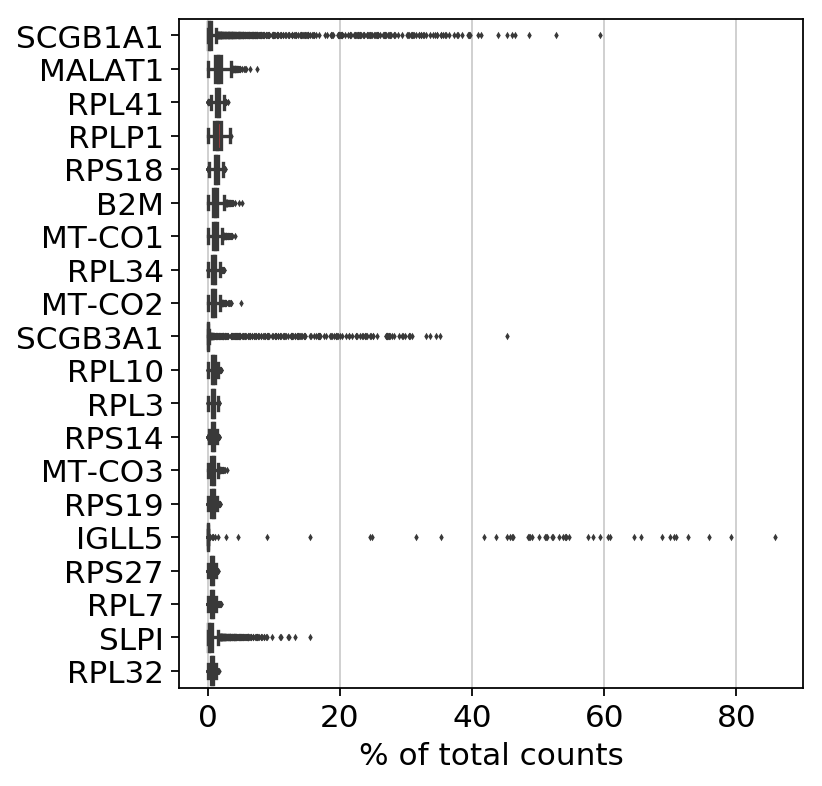

In [159]:
sc.pl.highest_expr_genes(D339_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


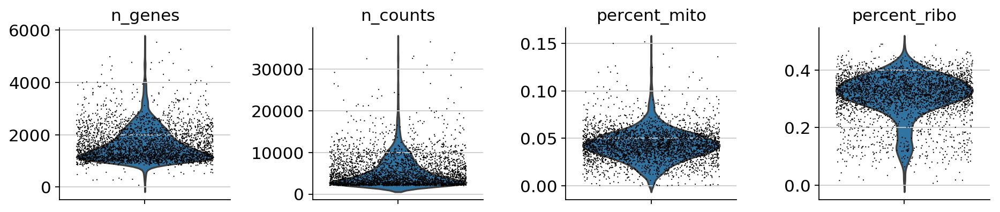

In [160]:
sc.pp.filter_cells(D339_Biop_Int1, min_genes=0)
mito_genes = D339_Biop_Int1.var_names.str.startswith('MT-')
D339_Biop_Int1.obs['percent_mito'] = np.sum(
    D339_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Biop_Int1.X, axis=1).A1
D339_Biop_Int1.obs['n_counts'] = D339_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Biop_Int1.to_df())
ribo_genes = D339_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D339_Biop_Int1.obs['percent_ribo'] = np.sum(
    D339_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Biop_Int1.X, axis=1).A1
D339_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [161]:
sc.pp.filter_cells(D339_Biop_Int1, min_genes=500)
D339_Biop_Int1 = D339_Biop_Int1[D339_Biop_Int1.obs['n_counts'] < 30000, :]
D339_Biop_Int1 = D339_Biop_Int1[D339_Biop_Int1.obs['percent_mito'] < 0.15, :]


filtered out 9 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.32
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 10.6%
Overall doublet rate:
	Expected   = 2.6%
	Estimated  = 3.7%
Elapsed time: 2.3 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea9ab0a20>,
       dtype=object))

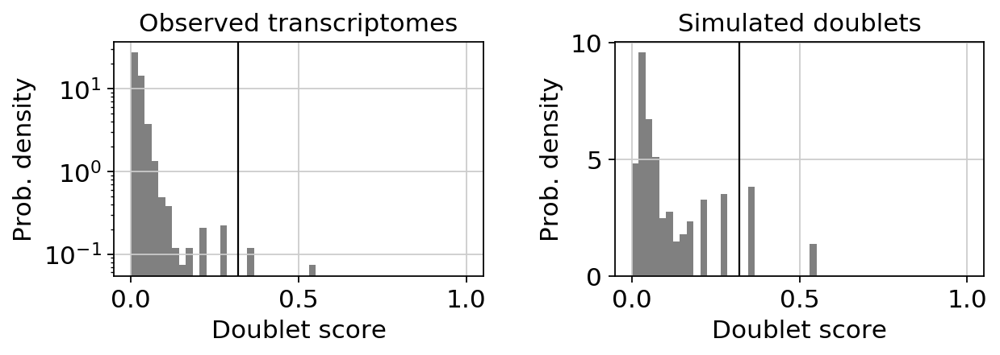

In [162]:
# scrublet
scrub = scr.Scrublet(D339_Biop_Int1.X, expected_doublet_rate=0.026)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D339_Biop_Int1.obs['doublet_scores'] = doublet_scores
D339_Biop_Int1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [163]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D339_Biop_Int1.X).predict()
D339_Biop_Int1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.6120181083679199 seconds
Jaccard graph constructed in 0.6159374713897705 seconds
Wrote graph to binary file in 0.06875061988830566 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.910447
Louvain completed 21 runs in 1.5944838523864746 seconds
PhenoGraph complete in 2.907468795776367 seconds
Found communities [-1, ... 27], with sizes: [111, 718, 381, 364, 245, 229, 189, 186, 176, 133, 132, 128, 122, 122, 119, 117, 108, 96, 80, 71, 57, 54, 48, 46, 34, 28, 28, 22, 18]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metr

In [164]:
sc.pp.normalize_per_cell(D339_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Biop_Int1) # log transform the data
D339_Biop_Int1.raw = D339_Biop_Int1 # freeze the object (for later use of the raw state of it)

In [165]:
D339_Biop_Int1 = D339_Biop_Int1[:, D339_Biop_Int1.var['ribo_genes']]
D339_Biop_Int1

View of AnnData object with n_obs × n_vars = 3330 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [166]:
D344_Biop_Int1 = sc.read_10x_mtx(
    './D344_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Biop_Int1.var_names_make_unique()
D344_Biop_Int1.obs['manip'] = 'D344_Biop_Int1'
D344_Biop_Int1.obs['position'] = 'Intermediate'
D344_Biop_Int1.obs['method'] = 'Biopsy'
D344_Biop_Int1.obs['donor'] = 'D344'
D344_Biop_Int1.obs['name'] = ['D344_Biop_Int1_' + s for s in list(D344_Biop_Int1.obs.index)]
D344_Biop_Int1.obs_names = D344_Biop_Int1.obs['name']
D344_Biop_Int1

... reading from cache file ./cache/D344_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1051 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

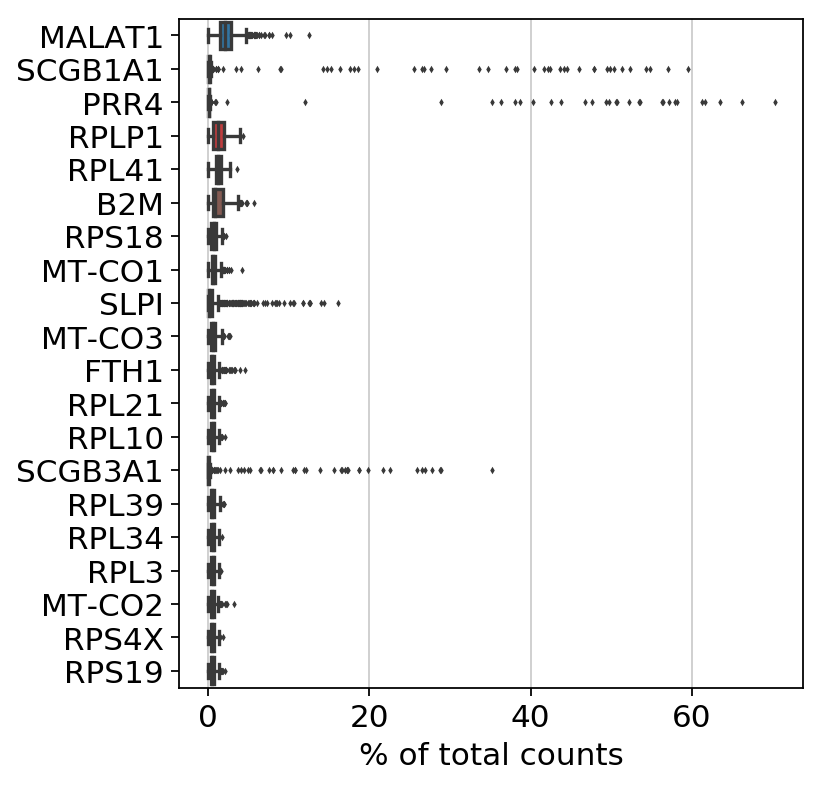

In [167]:
sc.pl.highest_expr_genes(D344_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


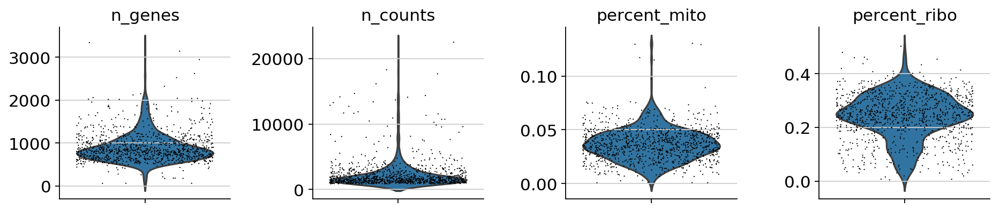

In [168]:
sc.pp.filter_cells(D344_Biop_Int1, min_genes=0)
mito_genes = D344_Biop_Int1.var_names.str.startswith('MT-')
D344_Biop_Int1.obs['percent_mito'] = np.sum(
    D344_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Biop_Int1.X, axis=1).A1
D344_Biop_Int1.obs['n_counts'] = D344_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Biop_Int1.to_df())
ribo_genes = D344_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D344_Biop_Int1.obs['percent_ribo'] = np.sum(
    D344_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Biop_Int1.X, axis=1).A1
D344_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [169]:
sc.pp.filter_cells(D344_Biop_Int1, min_genes=500)
D344_Biop_Int1 = D344_Biop_Int1[D344_Biop_Int1.obs['n_counts'] < 10000, :]
D344_Biop_Int1 = D344_Biop_Int1[D344_Biop_Int1.obs['percent_mito'] < 0.1, :]


filtered out 27 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.07
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 34.1%
Overall doublet rate:
	Expected   = 0.8%
	Estimated  = 1.2%
Elapsed time: 0.4 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea9f3ec88>,
       dtype=object))

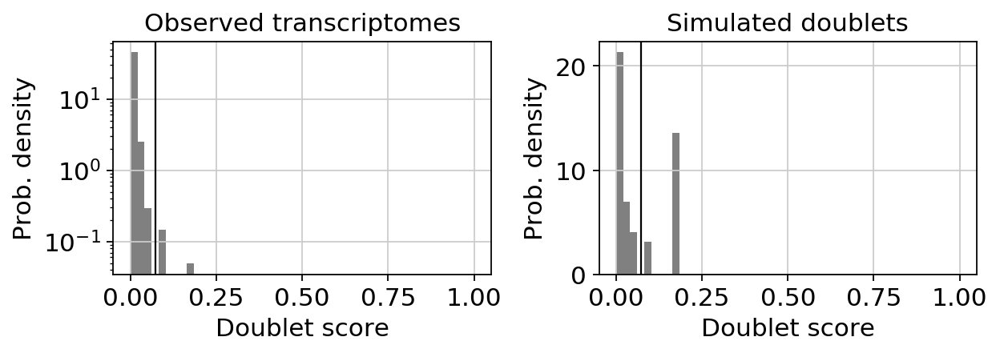

In [170]:
# scrublet
scrub = scr.Scrublet(D344_Biop_Int1.X, expected_doublet_rate=0.008)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D344_Biop_Int1.obs['doublet_scores'] = doublet_scores
D344_Biop_Int1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [171]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D344_Biop_Int1.X).predict()
D344_Biop_Int1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.21145963668823242 seconds
Jaccard graph constructed in 0.3449239730834961 seconds
Wrote graph to binary file in 0.021248817443847656 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.880122
Louvain completed 21 runs in 1.1646614074707031 seconds
PhenoGraph complete in 1.7518534660339355 seconds
Found communities [-1, ... 14], with sizes: [185, 297, 150, 118, 87, 80, 67, 43, 39, 39, 37, 36, 33, 14, 13, 12]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11079335212707

In [172]:
sc.pp.normalize_per_cell(D344_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Biop_Int1) # log transform the data
D344_Biop_Int1.raw = D344_Biop_Int1 # freeze the object (for later use of the raw state of it)

In [173]:
D344_Biop_Int1 = D344_Biop_Int1[:, D344_Biop_Int1.var['ribo_genes']]
D344_Biop_Int1

View of AnnData object with n_obs × n_vars = 1000 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [174]:
D353_Biop_Int2 = sc.read_10x_mtx(
    './D353_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Biop_Int2.var_names_make_unique()
D353_Biop_Int2.obs['manip'] = 'D353_Biop_Int2'
D353_Biop_Int2.obs['position'] = 'Intermediate'
D353_Biop_Int2.obs['method'] = 'Biopsy'
D353_Biop_Int2.obs['donor'] = 'D353'
D353_Biop_Int2.obs['name'] = ['D353_Biop_Int2_' + s for s in list(D353_Biop_Int2.obs.index)]
D353_Biop_Int2.obs_names = D353_Biop_Int2.obs['name']
D353_Biop_Int2

... reading from cache file ./cache/D353_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2291 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

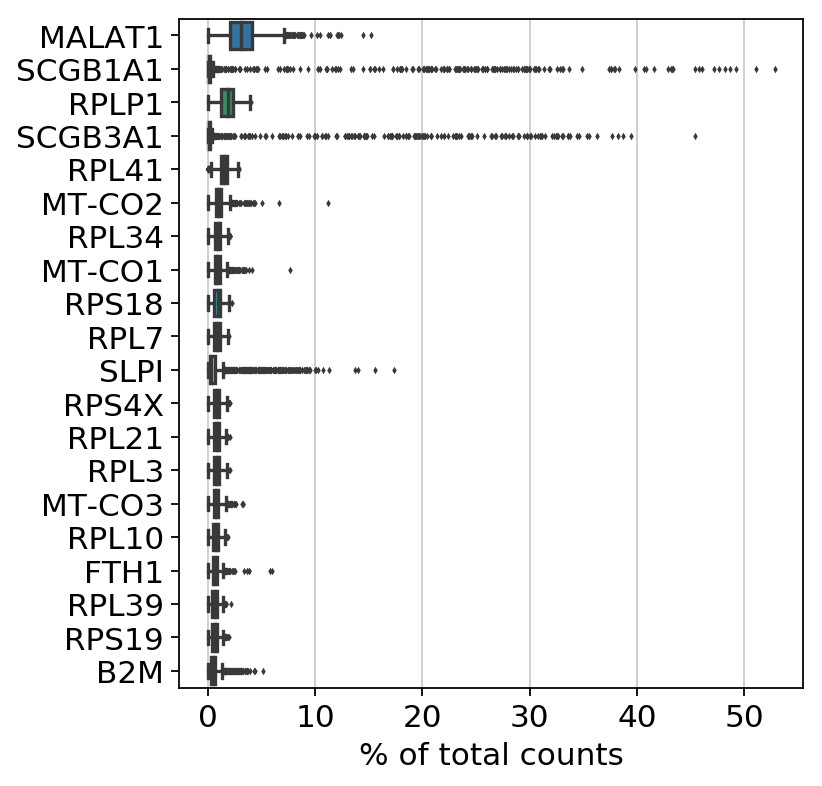

In [175]:
sc.pl.highest_expr_genes(D353_Biop_Int2, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


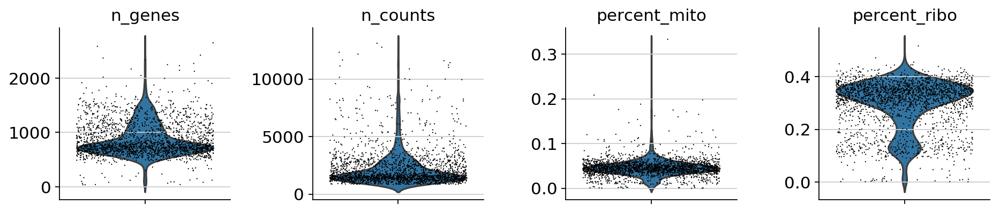

In [176]:
sc.pp.filter_cells(D353_Biop_Int2, min_genes=0)
mito_genes = D353_Biop_Int2.var_names.str.startswith('MT-')
D353_Biop_Int2.obs['percent_mito'] = np.sum(
    D353_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D353_Biop_Int2.X, axis=1).A1
D353_Biop_Int2.obs['n_counts'] = D353_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Biop_Int2.to_df())
ribo_genes = D353_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D353_Biop_Int2.obs['percent_ribo'] = np.sum(
    D353_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Biop_Int2.X, axis=1).A1
D353_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [177]:
sc.pp.filter_cells(D353_Biop_Int2, min_genes=500)
D353_Biop_Int2 = D353_Biop_Int2[D353_Biop_Int2.obs['n_counts'] < 10000, :]
D353_Biop_Int2 = D353_Biop_Int2[D353_Biop_Int2.obs['percent_mito'] < 0.15, :]


filtered out 72 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.21
Detected doublet rate = 0.5%
Estimated detectable doublet fraction = 14.3%
Overall doublet rate:
	Expected   = 1.8%
	Estimated  = 3.8%
Elapsed time: 1.1 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea9933cf8>,
       dtype=object))

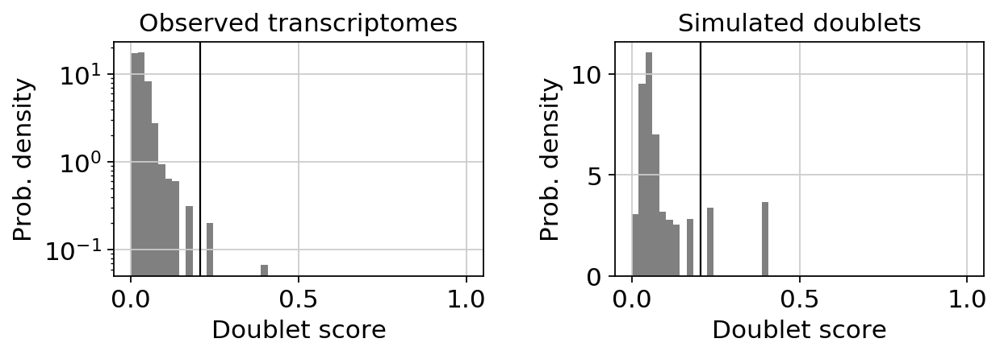

In [178]:
# scrublet
scrub = scr.Scrublet(D353_Biop_Int2.X, expected_doublet_rate=0.018)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D353_Biop_Int2.obs['doublet_scores'] = doublet_scores
D353_Biop_Int2.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [179]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D353_Biop_Int2.X).predict()
D353_Biop_Int2.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.4091353416442871 seconds
Jaccard graph constructed in 0.6043984889984131 seconds
Wrote graph to binary file in 0.03512072563171387 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.890691
Louvain completed 21 runs in 1.3956241607666016 seconds
PhenoGraph complete in 2.4567246437072754 seconds
Found communities [-1, ... 15], with sizes: [228, 1040, 693, 144, 95, 79, 78, 61, 60, 46, 44, 39, 38, 28, 26, 24, 22]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.40806484222

In [180]:
sc.pp.normalize_per_cell(D353_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Biop_Int2) # log transform the data
D353_Biop_Int2.raw = D353_Biop_Int2 # freeze the object (for later use of the raw state of it)

In [181]:
D353_Biop_Int2 = D353_Biop_Int2[:, D353_Biop_Int2.var['ribo_genes']]
D353_Biop_Int2

View of AnnData object with n_obs × n_vars = 2196 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [182]:
D354_Biop_Int2 = sc.read_10x_mtx(
    './D354_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D354_Biop_Int2.var_names_make_unique()
D354_Biop_Int2.obs['manip'] = 'D354_Biop_Int2'
D354_Biop_Int2.obs['position'] = 'Intermediate'
D354_Biop_Int2.obs['method'] = 'Biopsy'
D354_Biop_Int2.obs['donor'] = 'D354'
D354_Biop_Int2.obs['name'] = ['D354_Biop_Int2_' + s for s in list(D354_Biop_Int2.obs.index)]
D354_Biop_Int2.obs_names = D354_Biop_Int2.obs['name']
D354_Biop_Int2

... reading from cache file ./cache/D354_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2775 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

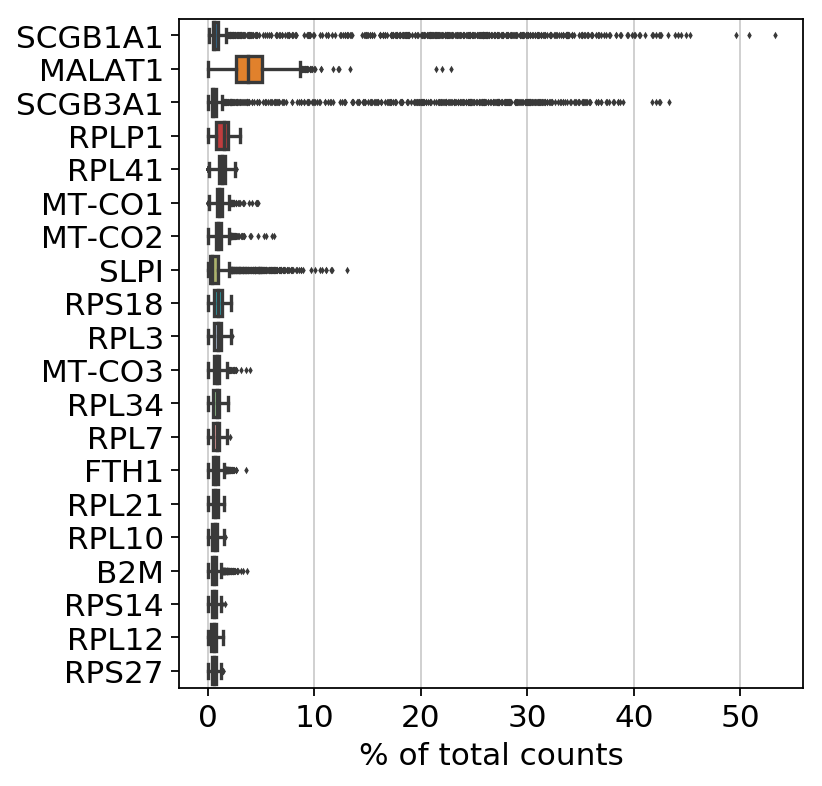

In [183]:
sc.pl.highest_expr_genes(D354_Biop_Int2, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


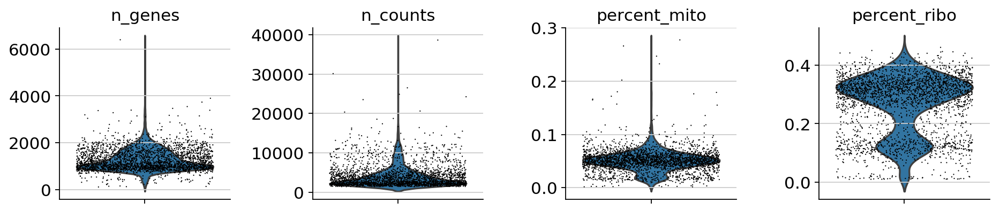

In [184]:
sc.pp.filter_cells(D354_Biop_Int2, min_genes=0)
mito_genes = D354_Biop_Int2.var_names.str.startswith('MT-')
D354_Biop_Int2.obs['percent_mito'] = np.sum(
    D354_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D354_Biop_Int2.X, axis=1).A1
D354_Biop_Int2.obs['n_counts'] = D354_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D354_Biop_Int2.to_df())
ribo_genes = D354_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D354_Biop_Int2.obs['percent_ribo'] = np.sum(
    D354_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D354_Biop_Int2.X, axis=1).A1
D354_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D354_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [185]:
sc.pp.filter_cells(D354_Biop_Int2, min_genes=500)
D354_Biop_Int2 = D354_Biop_Int2[D354_Biop_Int2.obs['n_counts'] < 20000, :]
D354_Biop_Int2 = D354_Biop_Int2[D354_Biop_Int2.obs['percent_mito'] < 0.2, :]


filtered out 51 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.26
Detected doublet rate = 0.6%
Estimated detectable doublet fraction = 14.5%
Overall doublet rate:
	Expected   = 2.2%
	Estimated  = 4.1%
Elapsed time: 1.6 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1eb525b3c8>,
       dtype=object))

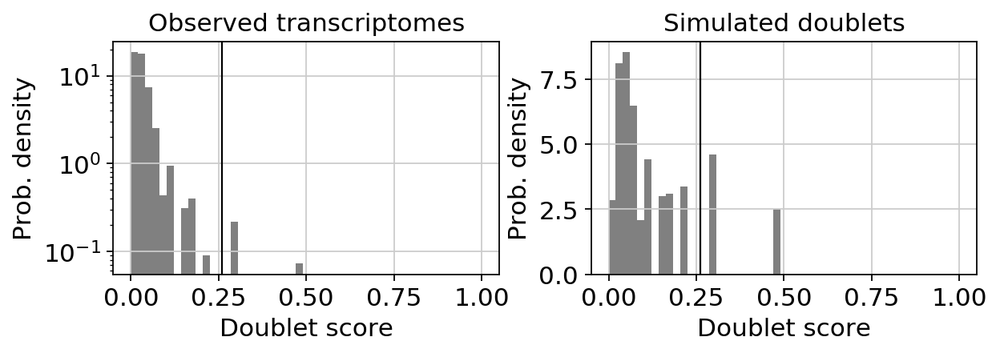

In [186]:
# scrublet
scrub = scr.Scrublet(D354_Biop_Int2.X, expected_doublet_rate=0.022)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D354_Biop_Int2.obs['doublet_scores'] = doublet_scores
D354_Biop_Int2.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [187]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D354_Biop_Int2.X).predict()
D354_Biop_Int2.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.6089456081390381 seconds
Jaccard graph constructed in 0.5493769645690918 seconds
Wrote graph to binary file in 0.047583818435668945 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.903417
After 3 runs, maximum modularity is Q = 0.904579
Louvain completed 23 runs in 1.9260752201080322 seconds
PhenoGraph complete in 3.146135091781616 seconds
Found communities [-1, ... 20], with sizes: [243, 1162, 328, 305, 257, 185, 178, 161, 96, 77, 74, 46, 45, 41, 35, 31, 29, 25, 25, 17, 16, 12]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using 

In [188]:
sc.pp.normalize_per_cell(D354_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D354_Biop_Int2) # log transform the data
D354_Biop_Int2.raw = D354_Biop_Int2 # freeze the object (for later use of the raw state of it)

In [189]:
D354_Biop_Int2 = D354_Biop_Int2[:, D354_Biop_Int2.var['ribo_genes']]
D354_Biop_Int2

View of AnnData object with n_obs × n_vars = 2711 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [190]:
D363_Biop_Int2 = sc.read_10x_mtx(
    './D363_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Biop_Int2.var_names_make_unique()
D363_Biop_Int2.obs['manip'] = 'D363_Biop_Int2'
D363_Biop_Int2.obs['position'] = 'Intermediate'
D363_Biop_Int2.obs['method'] = 'Biopsy'
D363_Biop_Int2.obs['donor'] = 'D363'
D363_Biop_Int2.obs['name'] = ['D363_Biop_Int2_' + s for s in list(D363_Biop_Int2.obs.index)]
D363_Biop_Int2.obs_names = D363_Biop_Int2.obs['name']
D363_Biop_Int2

... reading from cache file ./cache/D363_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1290 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

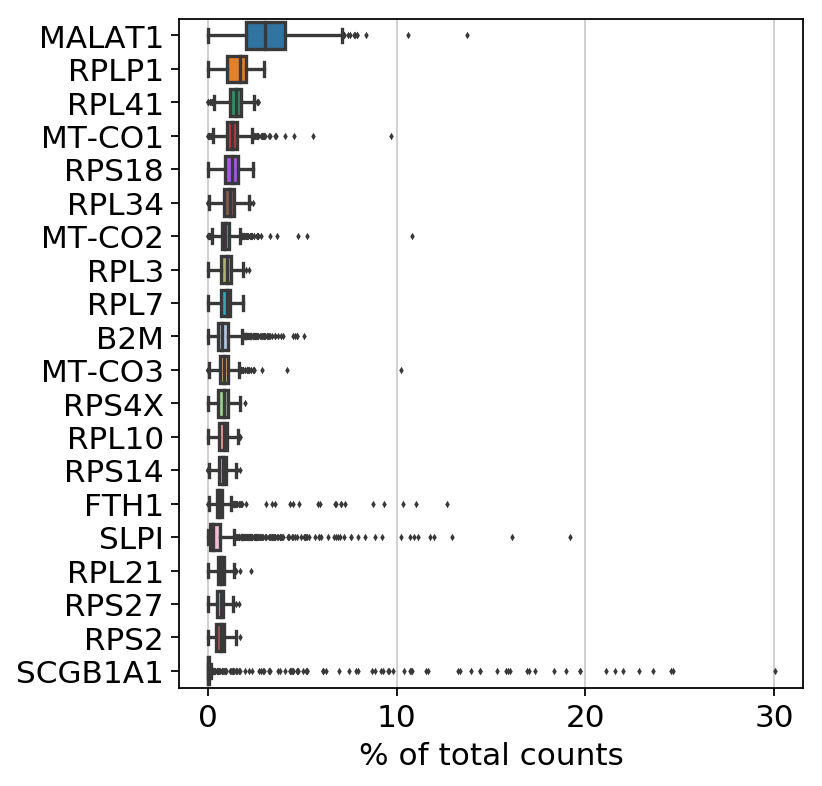

In [191]:
sc.pl.highest_expr_genes(D363_Biop_Int2, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


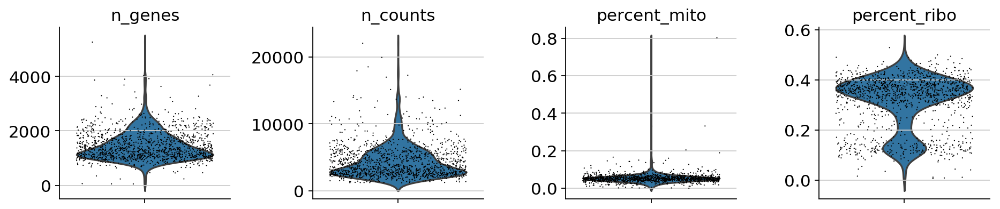

In [192]:
sc.pp.filter_cells(D363_Biop_Int2, min_genes=0)
mito_genes = D363_Biop_Int2.var_names.str.startswith('MT-')
D363_Biop_Int2.obs['percent_mito'] = np.sum(
    D363_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D363_Biop_Int2.X, axis=1).A1
D363_Biop_Int2.obs['n_counts'] = D363_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Biop_Int2.to_df())
ribo_genes = D363_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D363_Biop_Int2.obs['percent_ribo'] = np.sum(
    D363_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Biop_Int2.X, axis=1).A1
D363_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [193]:
sc.pp.filter_cells(D363_Biop_Int2, min_genes=500)
D363_Biop_Int2 = D363_Biop_Int2[D363_Biop_Int2.obs['n_counts'] < 15000, :]
D363_Biop_Int2 = D363_Biop_Int2[D363_Biop_Int2.obs['percent_mito'] < 0.2, :]


filtered out 10 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.11
Detected doublet rate = 0.7%
Estimated detectable doublet fraction = 23.5%
Overall doublet rate:
	Expected   = 1.1%
	Estimated  = 3.0%
Elapsed time: 0.7 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea7e4dac8>,
       dtype=object))

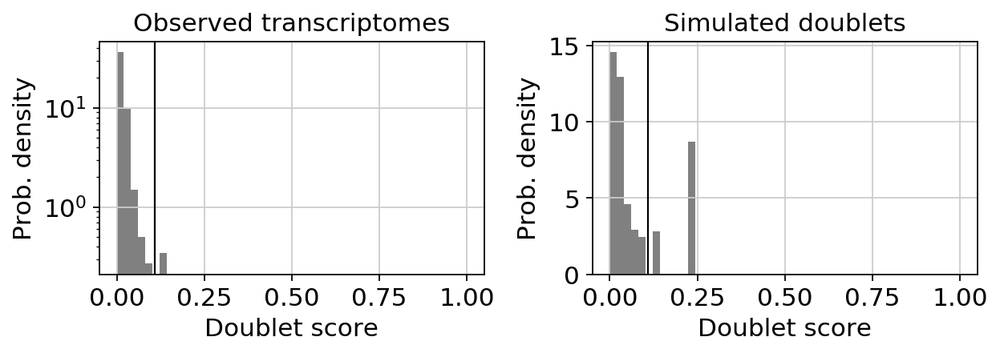

In [194]:
# scrublet
scrub = scr.Scrublet(D363_Biop_Int2.X, expected_doublet_rate=0.011)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D363_Biop_Int2.obs['doublet_scores'] = doublet_scores
D363_Biop_Int2.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [195]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D363_Biop_Int2.X).predict()
D363_Biop_Int2.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11090898513793945 seconds
Jaccard graph constructed in 0.37721800804138184 seconds
Wrote graph to binary file in 0.019229888916015625 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.846293
Louvain completed 21 runs in 1.2453773021697998 seconds
PhenoGraph complete in 1.7667901515960693 seconds
Found communities [-1, ... 15], with sizes: [224, 394, 176, 167, 101, 96, 89, 67, 54, 50, 38, 33, 28, 26, 16, 15, 13]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.21318125

In [196]:
sc.pp.normalize_per_cell(D363_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Biop_Int2) # log transform the data
D363_Biop_Int2.raw = D363_Biop_Int2 # freeze the object (for later use of the raw state of it)

In [197]:
D363_Biop_Int2 = D363_Biop_Int2[:, D363_Biop_Int2.var['ribo_genes']]
D363_Biop_Int2

View of AnnData object with n_obs × n_vars = 1270 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [198]:
D367_Biop_Int1 = sc.read_10x_mtx(
    './D367_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Biop_Int1.var_names_make_unique()
D367_Biop_Int1.obs['manip'] = 'D367_Biop_Int1'
D367_Biop_Int1.obs['position'] = 'Intermediate'
D367_Biop_Int1.obs['method'] = 'Biopsy'
D367_Biop_Int1.obs['donor'] = 'D367'
D367_Biop_Int1.obs['name'] = ['D367_Biop_Int1_' + s for s in list(D367_Biop_Int1.obs.index)]
D367_Biop_Int1.obs_names = D367_Biop_Int1.obs['name']
D367_Biop_Int1

... reading from cache file ./cache/D367_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2310 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

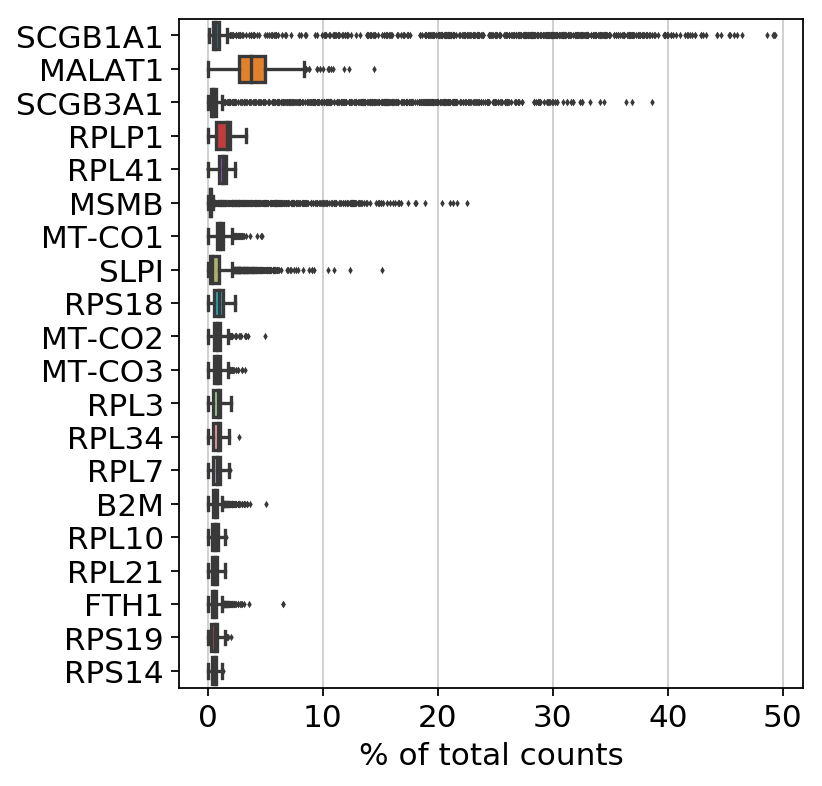

In [199]:
sc.pl.highest_expr_genes(D367_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


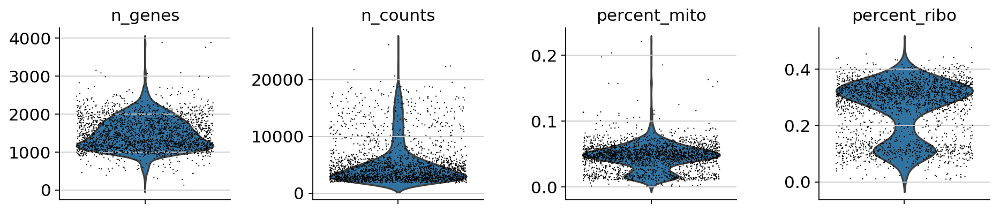

In [200]:
sc.pp.filter_cells(D367_Biop_Int1, min_genes=0)
mito_genes = D367_Biop_Int1.var_names.str.startswith('MT-')
D367_Biop_Int1.obs['percent_mito'] = np.sum(
    D367_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Biop_Int1.X, axis=1).A1
D367_Biop_Int1.obs['n_counts'] = D367_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Biop_Int1.to_df())
ribo_genes = D367_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D367_Biop_Int1.obs['percent_ribo'] = np.sum(
    D367_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Biop_Int1.X, axis=1).A1
D367_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [201]:
sc.pp.filter_cells(D367_Biop_Int1, min_genes=500)
D367_Biop_Int1 = D367_Biop_Int1[D367_Biop_Int1.obs['n_counts'] < 20000, :]
D367_Biop_Int1 = D367_Biop_Int1[D367_Biop_Int1.obs['percent_mito'] < 0.1, :]


filtered out 12 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.21
Detected doublet rate = 0.6%
Estimated detectable doublet fraction = 26.6%
Overall doublet rate:
	Expected   = 1.8%
	Estimated  = 2.3%
Elapsed time: 1.3 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea865b828>,
       dtype=object))

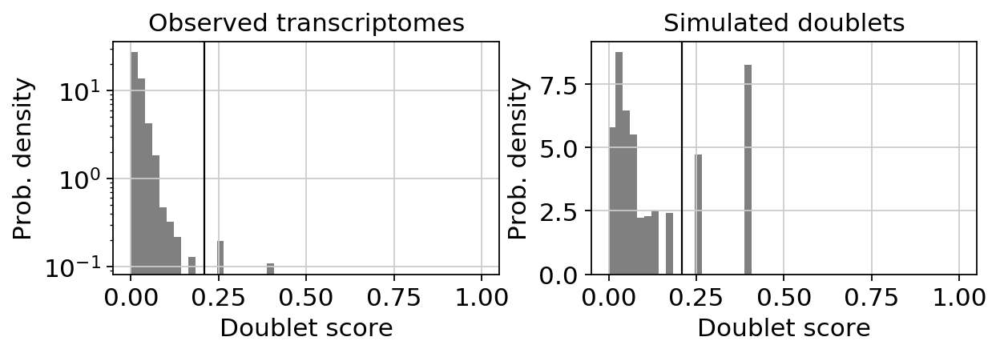

In [202]:
# scrublet
scrub = scr.Scrublet(D367_Biop_Int1.X, expected_doublet_rate=0.018)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D367_Biop_Int1.obs['doublet_scores'] = doublet_scores
D367_Biop_Int1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [203]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D367_Biop_Int1.X).predict()
D367_Biop_Int1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.514470100402832 seconds
Jaccard graph constructed in 0.5651981830596924 seconds
Wrote graph to binary file in 0.038552045822143555 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.890353
Louvain completed 21 runs in 1.4390356540679932 seconds
PhenoGraph complete in 2.5758235454559326 seconds
Found communities [-1, ... 20], with sizes: [262, 591, 509, 257, 243, 166, 134, 130, 84, 68, 65, 62, 57, 50, 40, 30, 18, 18, 15, 13, 12, 11]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors co

In [204]:
sc.pp.normalize_per_cell(D367_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Biop_Int1) # log transform the data
D367_Biop_Int1.raw = D367_Biop_Int1 # freeze the object (for later use of the raw state of it)

In [205]:
D367_Biop_Int1 = D367_Biop_Int1[:, D367_Biop_Int1.var['ribo_genes']]
D367_Biop_Int1

View of AnnData object with n_obs × n_vars = 2268 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [206]:
D372_Biop_Int1 = sc.read_10x_mtx(
    './D372_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Biop_Int1.var_names_make_unique()
D372_Biop_Int1.obs['manip'] = 'D372_Biop_Int1'
D372_Biop_Int1.obs['position'] = 'Intermediate'
D372_Biop_Int1.obs['method'] = 'Biopsy'
D372_Biop_Int1.obs['donor'] = 'D372'
D372_Biop_Int1.obs['name'] = ['D372_Biop_Int1_' + s for s in list(D372_Biop_Int1.obs.index)]
D372_Biop_Int1.obs_names = D372_Biop_Int1.obs['name']
D372_Biop_Int1

... reading from cache file ./cache/D372_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1255 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

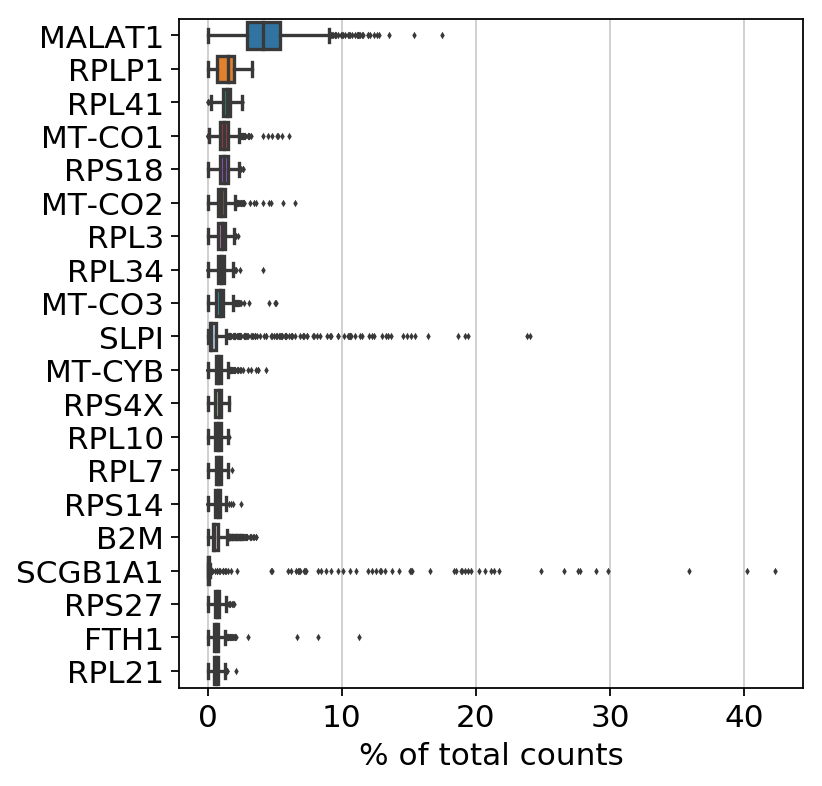

In [207]:
sc.pl.highest_expr_genes(D372_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


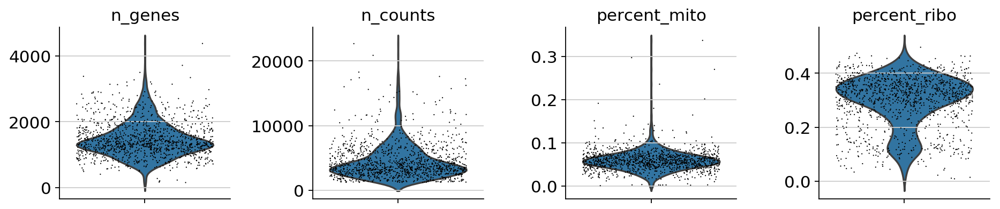

In [208]:
sc.pp.filter_cells(D372_Biop_Int1, min_genes=0)
mito_genes = D372_Biop_Int1.var_names.str.startswith('MT-')
D372_Biop_Int1.obs['percent_mito'] = np.sum(
    D372_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Biop_Int1.X, axis=1).A1
D372_Biop_Int1.obs['n_counts'] = D372_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Biop_Int1.to_df())
ribo_genes = D372_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D372_Biop_Int1.obs['percent_ribo'] = np.sum(
    D372_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Biop_Int1.X, axis=1).A1
D372_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [209]:
sc.pp.filter_cells(D372_Biop_Int1, min_genes=500)
D372_Biop_Int1 = D372_Biop_Int1[D372_Biop_Int1.obs['n_counts'] < 20000, :]
D372_Biop_Int1 = D372_Biop_Int1[D372_Biop_Int1.obs['percent_mito'] < 0.2, :]


filtered out 8 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.11
Detected doublet rate = 0.5%
Estimated detectable doublet fraction = 26.9%
Overall doublet rate:
	Expected   = 1.1%
	Estimated  = 1.8%
Elapsed time: 0.6 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea1fab1d0>,
       dtype=object))

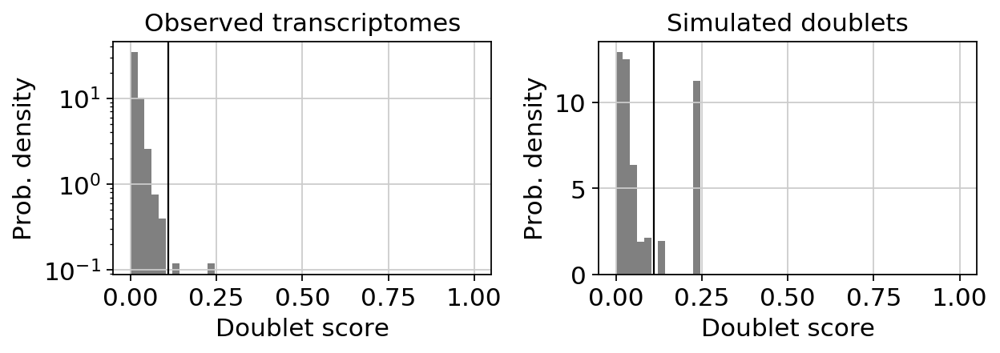

In [210]:
# scrublet
scrub = scr.Scrublet(D372_Biop_Int1.X, expected_doublet_rate=0.011)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D372_Biop_Int1.obs['doublet_scores'] = doublet_scores
D372_Biop_Int1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [211]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D372_Biop_Int1.X).predict()
D372_Biop_Int1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11031770706176758 seconds
Jaccard graph constructed in 0.4518752098083496 seconds
Wrote graph to binary file in 0.02142500877380371 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.865176
After 14 runs, maximum modularity is Q = 0.866203
Louvain completed 34 runs in 2.141688346862793 seconds
PhenoGraph complete in 2.7349908351898193 seconds
Found communities [-1, ... 17], with sizes: [263, 385, 219, 84, 79, 65, 57, 53, 52, 48, 48, 37, 35, 34, 30, 26, 13, 11, 11]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric 

In [212]:
sc.pp.normalize_per_cell(D372_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Biop_Int1) # log transform the data
D372_Biop_Int1.raw = D372_Biop_Int1 # freeze the object (for later use of the raw state of it)

In [213]:
D372_Biop_Int1 = D372_Biop_Int1[:, D372_Biop_Int1.var['ribo_genes']]
D372_Biop_Int1

View of AnnData object with n_obs × n_vars = 1240 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [214]:
D372_Biop_Int2 = sc.read_10x_mtx(
    './D372_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Biop_Int2.var_names_make_unique()
D372_Biop_Int2.obs['manip'] = 'D372_Biop_Int2'
D372_Biop_Int2.obs['position'] = 'Intermediate'
D372_Biop_Int2.obs['method'] = 'Biopsy'
D372_Biop_Int2.obs['donor'] = 'D372'
D372_Biop_Int2.obs['name'] = ['D372_Biop_Int2_' + s for s in list(D372_Biop_Int2.obs.index)]
D372_Biop_Int2.obs_names = D372_Biop_Int2.obs['name']
D372_Biop_Int2

... reading from cache file ./cache/D372_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 4003 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

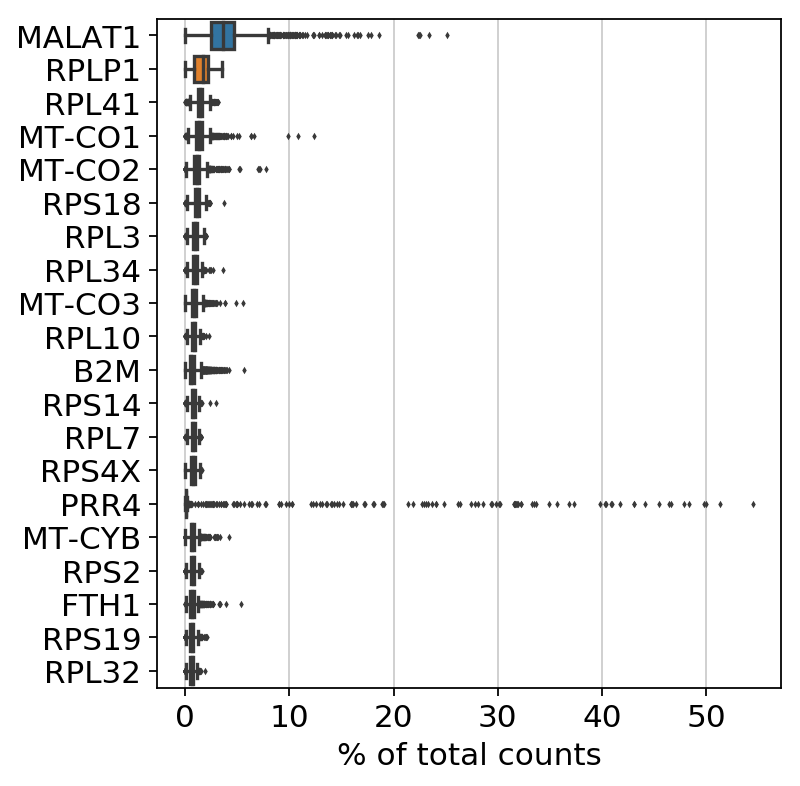

In [215]:
sc.pl.highest_expr_genes(D372_Biop_Int2, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


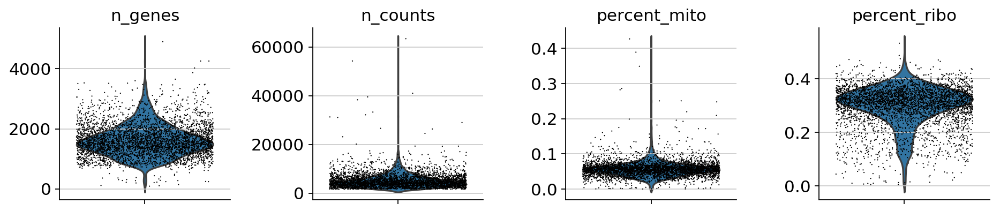

In [216]:
sc.pp.filter_cells(D372_Biop_Int2, min_genes=0)
mito_genes = D372_Biop_Int2.var_names.str.startswith('MT-')
D372_Biop_Int2.obs['percent_mito'] = np.sum(
    D372_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D372_Biop_Int2.X, axis=1).A1
D372_Biop_Int2.obs['n_counts'] = D372_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Biop_Int2.to_df())
ribo_genes = D372_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D372_Biop_Int2.obs['percent_ribo'] = np.sum(
    D372_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Biop_Int2.X, axis=1).A1
D372_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [217]:
sc.pp.filter_cells(D372_Biop_Int2, min_genes=500)
D372_Biop_Int2 = D372_Biop_Int2[D372_Biop_Int2.obs['n_counts'] < 20000, :]
D372_Biop_Int2 = D372_Biop_Int2[D372_Biop_Int2.obs['percent_mito'] < 0.2, :]


filtered out 25 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.25
Detected doublet rate = 1.3%
Estimated detectable doublet fraction = 27.9%
Overall doublet rate:
	Expected   = 3.1%
	Estimated  = 4.8%
Elapsed time: 2.9 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ecbb42898>,
       dtype=object))

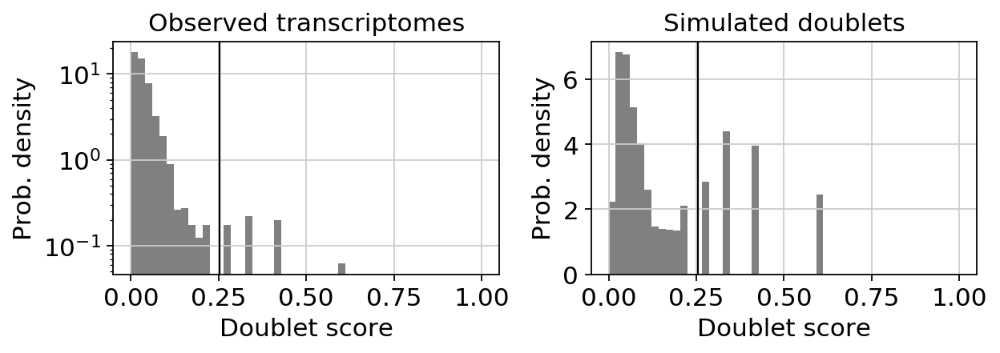

In [218]:
# scrublet
scrub = scr.Scrublet(D372_Biop_Int2.X, expected_doublet_rate=0.031)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D372_Biop_Int2.obs['doublet_scores'] = doublet_scores
D372_Biop_Int2.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [219]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D372_Biop_Int2.X).predict()
D372_Biop_Int2.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.8117721080780029 seconds
Jaccard graph constructed in 1.0435481071472168 seconds
Wrote graph to binary file in 0.08883523941040039 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.935617
After 11 runs, maximum modularity is Q = 0.93678
Louvain completed 31 runs in 2.9441475868225098 seconds
PhenoGraph complete in 4.906459808349609 seconds
Found communities [-1, ... 29], with sizes: [168, 849, 797, 383, 343, 269, 268, 243, 240, 215, 120, 113, 98, 91, 79, 78, 74, 62, 61, 55, 50, 49, 44, 36, 35, 34, 32, 17, 14, 13, 13]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=Tr

In [220]:
sc.pp.normalize_per_cell(D372_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Biop_Int2) # log transform the data
D372_Biop_Int2.raw = D372_Biop_Int2 # freeze the object (for later use of the raw state of it)

In [221]:
D372_Biop_Int2 = D372_Biop_Int2[:, D372_Biop_Int2.var['ribo_genes']]
D372_Biop_Int2

View of AnnData object with n_obs × n_vars = 3955 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

# Distal Brushings
[Back to top](#Full-Aggregate)

In [222]:
D326_Brus_Dis1 = sc.read_10x_mtx(
    './D326_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D326_Brus_Dis1.var_names_make_unique()
D326_Brus_Dis1.obs['manip'] = 'D326_Brus_Dis1'
D326_Brus_Dis1.obs['position'] = 'Distal'
D326_Brus_Dis1.obs['method'] = 'Brushing'
D326_Brus_Dis1.obs['donor'] = 'D326'
D326_Brus_Dis1.obs['name'] = ['D326_Brus_Dis1_' + s for s in list(D326_Brus_Dis1.obs.index)]
D326_Brus_Dis1.obs_names = D326_Brus_Dis1.obs['name']
D326_Brus_Dis1

... reading from cache file ./cache/D326_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1250 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

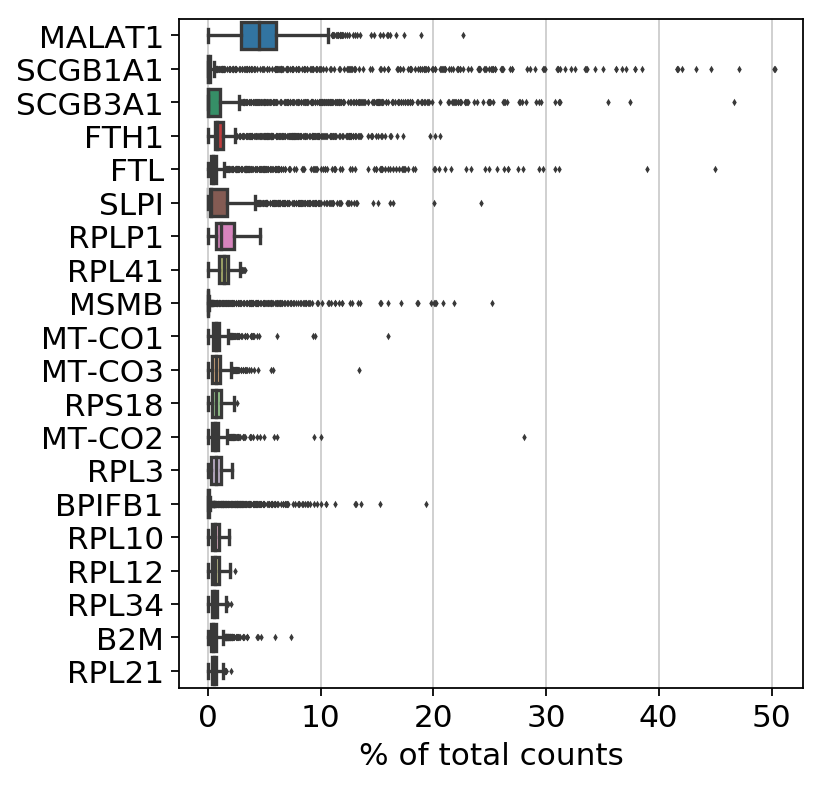

In [223]:
sc.pl.highest_expr_genes(D326_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


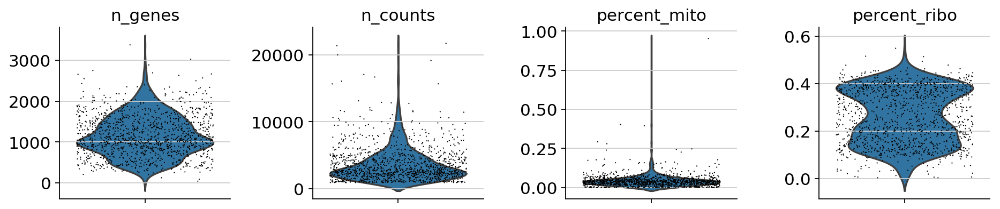

In [224]:
sc.pp.filter_cells(D326_Brus_Dis1, min_genes=0)
mito_genes = D326_Brus_Dis1.var_names.str.startswith('MT-')
D326_Brus_Dis1.obs['percent_mito'] = np.sum(
    D326_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D326_Brus_Dis1.X, axis=1).A1
D326_Brus_Dis1.obs['n_counts'] = D326_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D326_Brus_Dis1.to_df())
ribo_genes = D326_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D326_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D326_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D326_Brus_Dis1.X, axis=1).A1
D326_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D326_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [225]:
sc.pp.filter_cells(D326_Brus_Dis1, min_genes=500)
D326_Brus_Dis1 = D326_Brus_Dis1[D326_Brus_Dis1.obs['n_counts'] < 15000, :]
D326_Brus_Dis1 = D326_Brus_Dis1[D326_Brus_Dis1.obs['percent_mito'] < 0.25 , :]


filtered out 126 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.09
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 32.9%
Overall doublet rate:
	Expected   = 1.0%
	Estimated  = 1.4%
Elapsed time: 0.6 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea7e52160>,
       dtype=object))

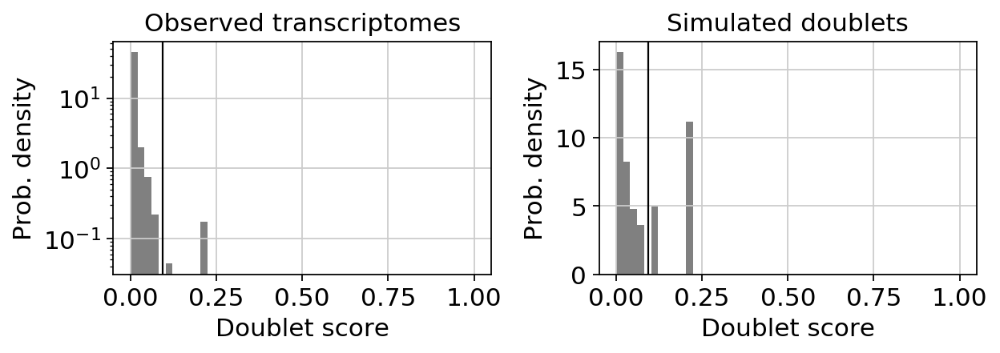

In [226]:
# scrublet
scrub = scr.Scrublet(D326_Brus_Dis1.X, expected_doublet_rate=0.01)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D326_Brus_Dis1.obs['doublet_scores'] = doublet_scores
D326_Brus_Dis1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [227]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D326_Brus_Dis1.X).predict()
D326_Brus_Dis1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.21236729621887207 seconds
Jaccard graph constructed in 0.3849825859069824 seconds
Wrote graph to binary file in 0.026634931564331055 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.885995
After 2 runs, maximum modularity is Q = 0.887532
Louvain completed 22 runs in 1.5970864295959473 seconds
PhenoGraph complete in 2.232036828994751 seconds
Found communities [-1, ... 15], with sizes: [175, 276, 195, 102, 99, 82, 76, 63, 57, 49, 48, 40, 31, 30, 25, 22, 22]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'au

In [228]:
sc.pp.normalize_per_cell(D326_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D326_Brus_Dis1) # log transform the data
D326_Brus_Dis1.raw = D326_Brus_Dis1 # freeze the object (for later use of the raw state of it)

In [229]:
D326_Brus_Dis1 = D326_Brus_Dis1[:, D326_Brus_Dis1.var['ribo_genes']]
D326_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1114 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [230]:
D337_Brus_Dis1 = sc.read_10x_mtx(
    './D337_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D337_Brus_Dis1.var_names_make_unique()
D337_Brus_Dis1.obs['manip'] = 'D337_Brus_Dis1'
D337_Brus_Dis1.obs['position'] = 'Distal'
D337_Brus_Dis1.obs['method'] = 'Brushing'
D337_Brus_Dis1.obs['donor'] = 'D337'
D337_Brus_Dis1.obs['name'] = ['D337_Brus_Dis1' + s for s in list(D337_Brus_Dis1.obs.index)]
D337_Brus_Dis1.obs_names = D337_Brus_Dis1.obs['name']
D337_Brus_Dis1

... reading from cache file ./cache/D337_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1428 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

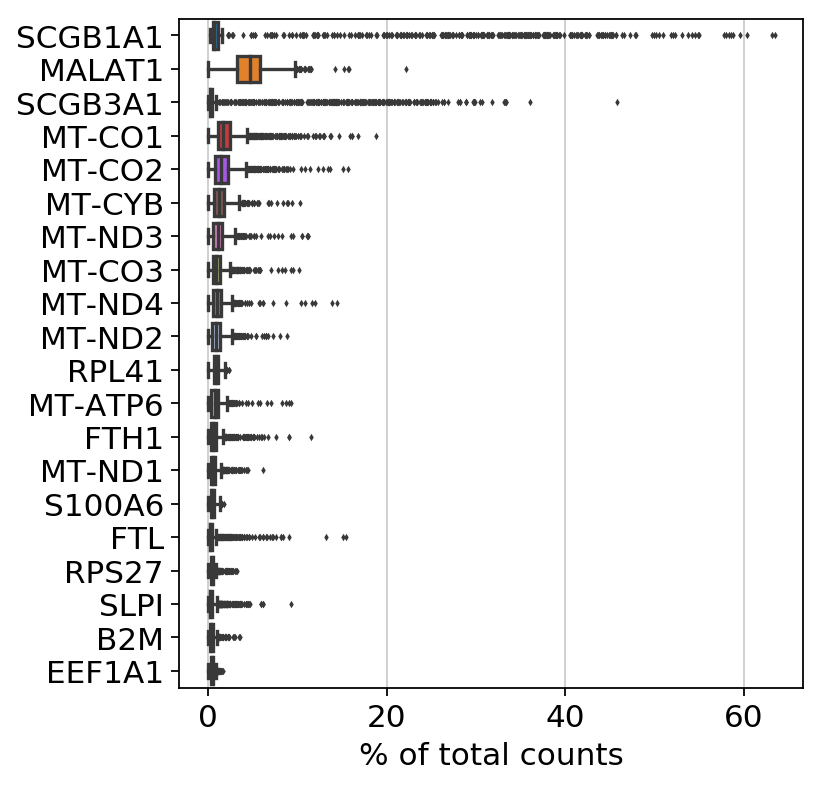

In [231]:
sc.pl.highest_expr_genes(D337_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


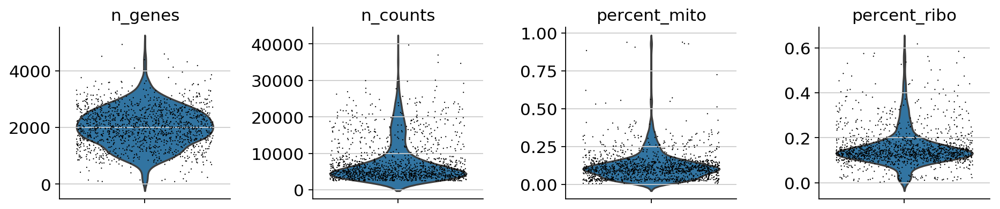

In [232]:
sc.pp.filter_cells(D337_Brus_Dis1, min_genes=0)
mito_genes = D337_Brus_Dis1.var_names.str.startswith('MT-')
D337_Brus_Dis1.obs['percent_mito'] = np.sum(
    D337_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D337_Brus_Dis1.X, axis=1).A1
D337_Brus_Dis1.obs['n_counts'] = D337_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D337_Brus_Dis1.to_df())
ribo_genes = D337_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D337_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D337_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D337_Brus_Dis1.X, axis=1).A1
D337_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D337_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [233]:
sc.pp.filter_cells(D337_Brus_Dis1, min_genes=500)
D337_Brus_Dis1 = D337_Brus_Dis1[D337_Brus_Dis1.obs['n_counts'] < 30000, :]
D337_Brus_Dis1 = D337_Brus_Dis1[D337_Brus_Dis1.obs['percent_mito'] < 0.5 , :]


filtered out 17 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.12
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 40.2%
Overall doublet rate:
	Expected   = 1.2%
	Estimated  = 1.1%
Elapsed time: 1.0 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea294a2b0>,
       dtype=object))

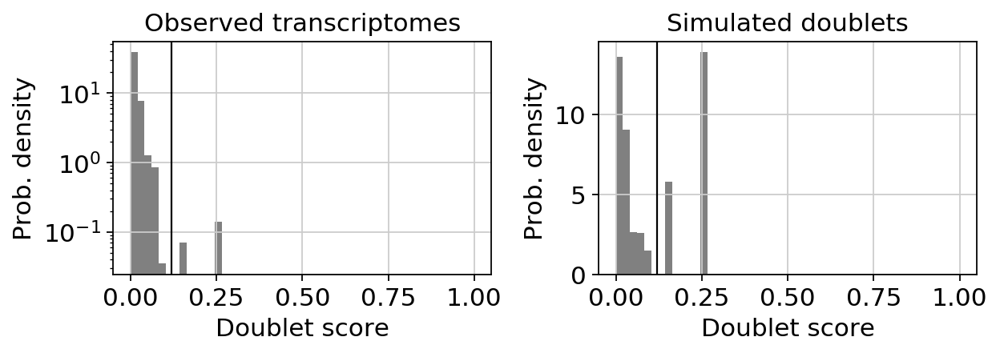

In [234]:
# scrublet
scrub = scr.Scrublet(D337_Brus_Dis1.X, expected_doublet_rate=0.012)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D337_Brus_Dis1.obs['doublet_scores'] = doublet_scores
D337_Brus_Dis1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [235]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D337_Brus_Dis1.X).predict()
D337_Brus_Dis1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.21335673332214355 seconds
Jaccard graph constructed in 0.4331936836242676 seconds
Wrote graph to binary file in 0.04625391960144043 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.889309
Louvain completed 21 runs in 1.4623045921325684 seconds
PhenoGraph complete in 2.1702306270599365 seconds
Found communities [-1, ... 17], with sizes: [280, 286, 234, 125, 122, 108, 95, 82, 73, 67, 53, 41, 33, 33, 31, 25, 24, 20, 15]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.2

In [236]:
sc.pp.normalize_per_cell(D337_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D337_Brus_Dis1) # log transform the data
D337_Brus_Dis1.raw = D337_Brus_Dis1 # freeze the object (for later use of the raw state of it)

In [237]:
D337_Brus_Dis1 = D337_Brus_Dis1[:, D337_Brus_Dis1.var['ribo_genes']]
D337_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1398 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [238]:
D339_Brus_Dis1 = sc.read_10x_mtx(
    './D339_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Brus_Dis1.var_names_make_unique()
D339_Brus_Dis1.obs['manip'] = 'D339_Brus_Dis1'
D339_Brus_Dis1.obs['position'] = 'Distal'
D339_Brus_Dis1.obs['method'] = 'Brushing'
D339_Brus_Dis1.obs['donor'] = 'D339'
D339_Brus_Dis1.obs['name'] = ['D339_Brus_Dis1_' + s for s in list(D339_Brus_Dis1.obs.index)]
D339_Brus_Dis1.obs_names = D339_Brus_Dis1.obs['name']
D339_Brus_Dis1

... reading from cache file ./cache/D339_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1382 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

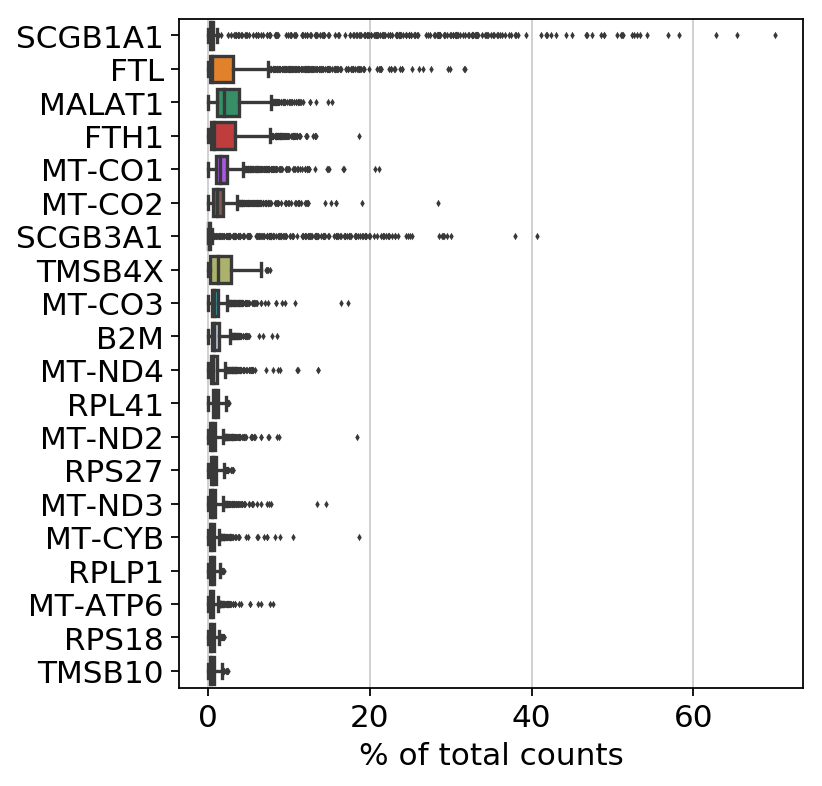

In [239]:
sc.pl.highest_expr_genes(D339_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


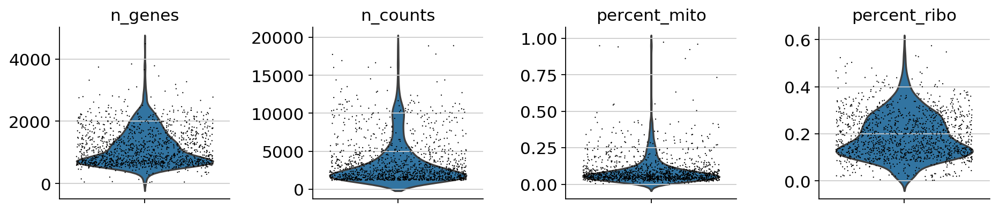

In [240]:
sc.pp.filter_cells(D339_Brus_Dis1, min_genes=0)
mito_genes = D339_Brus_Dis1.var_names.str.startswith('MT-')
D339_Brus_Dis1.obs['percent_mito'] = np.sum(
    D339_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Brus_Dis1.X, axis=1).A1
D339_Brus_Dis1.obs['n_counts'] = D339_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Brus_Dis1.to_df())
ribo_genes = D339_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D339_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D339_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Brus_Dis1.X, axis=1).A1
D339_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [241]:
sc.pp.filter_cells(D339_Brus_Dis1, min_genes=500)
D339_Brus_Dis1 = D339_Brus_Dis1[D339_Brus_Dis1.obs['n_counts'] < 15000, :]
D339_Brus_Dis1 = D339_Brus_Dis1[D339_Brus_Dis1.obs['percent_mito'] < 0.5 , :]


filtered out 35 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.12
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 31.3%
Overall doublet rate:
	Expected   = 1.2%
	Estimated  = 1.4%
Elapsed time: 0.7 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea0b3f7b8>,
       dtype=object))

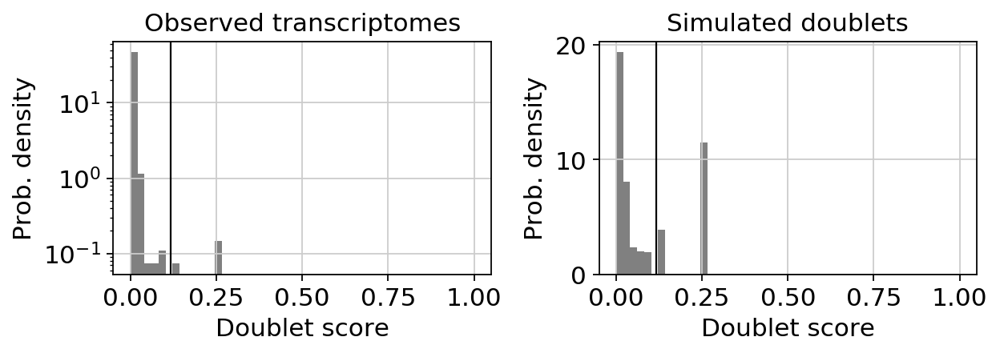

In [242]:
# scrublet
scrub = scr.Scrublet(D339_Brus_Dis1.X, expected_doublet_rate=0.012)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D339_Brus_Dis1.obs['doublet_scores'] = doublet_scores
D339_Brus_Dis1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [243]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D339_Brus_Dis1.X).predict()
D339_Brus_Dis1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.11077642440795898 seconds
Jaccard graph constructed in 0.46425771713256836 seconds
Wrote graph to binary file in 0.029248476028442383 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.885009
Louvain completed 21 runs in 1.3841643333435059 seconds
PhenoGraph complete in 2.0007967948913574 seconds
Found communities [-1, ... 21], with sizes: [160, 162, 153, 140, 111, 95, 91, 81, 77, 76, 76, 69, 69, 65, 53, 33, 32, 25, 23, 22, 21, 18, 16]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbor

In [244]:
sc.pp.normalize_per_cell(D339_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Brus_Dis1) # log transform the data
D339_Brus_Dis1.raw = D339_Brus_Dis1 # freeze the object (for later use of the raw state of it)

In [245]:
D339_Brus_Dis1 = D339_Brus_Dis1[:, D339_Brus_Dis1.var['ribo_genes']]
D339_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1335 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [246]:
D344_Brus_Dis1 = sc.read_10x_mtx(
    './D344_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Brus_Dis1.var_names_make_unique()
D344_Brus_Dis1.obs['manip'] = 'D344_Brus_Dis1'
D344_Brus_Dis1.obs['position'] = 'Distal'
D344_Brus_Dis1.obs['method'] = 'Brushing'
D344_Brus_Dis1.obs['donor'] = 'D344'
D344_Brus_Dis1.obs['name'] = ['D344_Brus_Dis1_' + s for s in list(D344_Brus_Dis1.obs.index)]
D344_Brus_Dis1.obs_names = D344_Brus_Dis1.obs['name']
D344_Brus_Dis1

... reading from cache file ./cache/D344_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2817 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

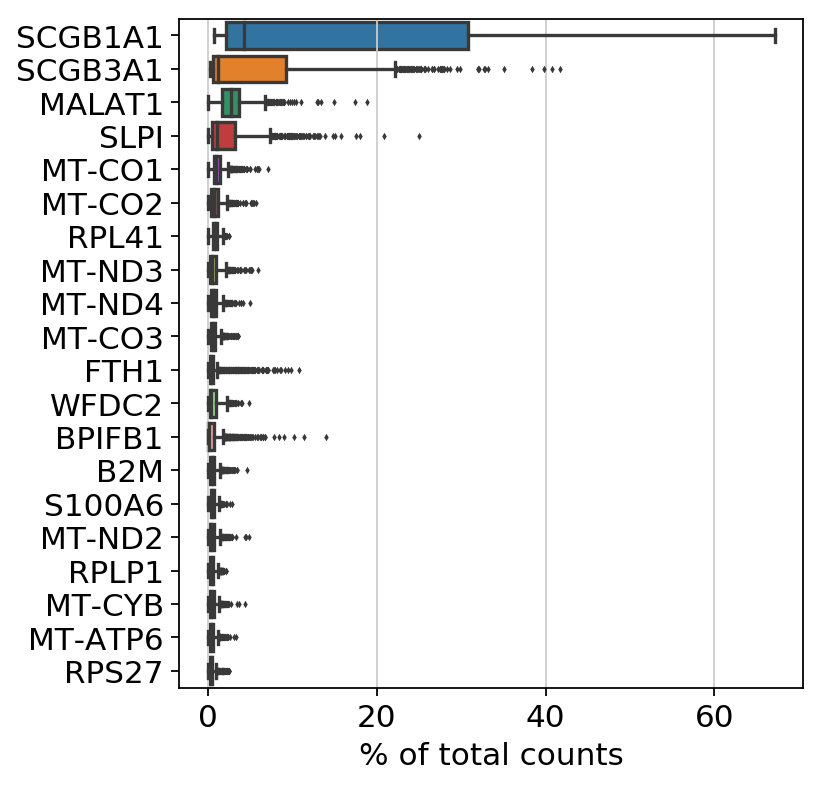

In [247]:
sc.pl.highest_expr_genes(D344_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


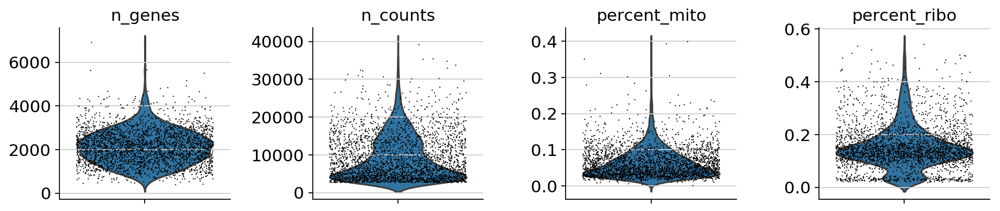

In [248]:
sc.pp.filter_cells(D344_Brus_Dis1, min_genes=0)
mito_genes = D344_Brus_Dis1.var_names.str.startswith('MT-')
D344_Brus_Dis1.obs['percent_mito'] = np.sum(
    D344_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Brus_Dis1.X, axis=1).A1
D344_Brus_Dis1.obs['n_counts'] = D344_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Brus_Dis1.to_df())
ribo_genes = D344_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D344_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D344_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Brus_Dis1.X, axis=1).A1
D344_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [249]:
sc.pp.filter_cells(D344_Brus_Dis1, min_genes=500)
D344_Brus_Dis1 = D344_Brus_Dis1[D344_Brus_Dis1.obs['n_counts'] < 30000, :]
D344_Brus_Dis1 = D344_Brus_Dis1[D344_Brus_Dis1.obs['percent_mito'] < 0.3 , :]


filtered out 8 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.17
Detected doublet rate = 1.4%
Estimated detectable doublet fraction = 42.4%
Overall doublet rate:
	Expected   = 2.3%
	Estimated  = 3.4%
Elapsed time: 2.5 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea282b630>,
       dtype=object))

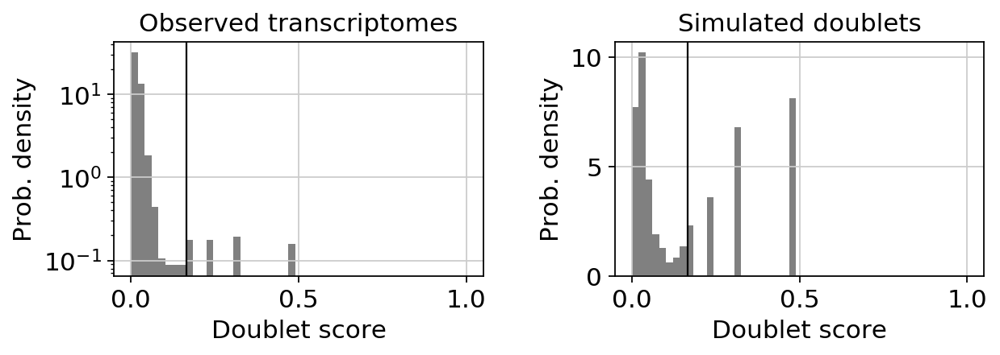

In [250]:
# scrublet
scrub = scr.Scrublet(D344_Brus_Dis1.X, expected_doublet_rate=0.023)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D344_Brus_Dis1.obs['doublet_scores'] = doublet_scores
D344_Brus_Dis1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [251]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D344_Brus_Dis1.X).predict()
D344_Brus_Dis1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.4087679386138916 seconds
Jaccard graph constructed in 0.676398515701294 seconds
Wrote graph to binary file in 0.06066608428955078 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.908475
After 2 runs, maximum modularity is Q = 0.910893
Louvain completed 22 runs in 2.0190682411193848 seconds
PhenoGraph complete in 3.1778438091278076 seconds
Found communities [-1, ... 21], with sizes: [180, 658, 412, 412, 283, 264, 186, 150, 147, 114, 87, 81, 79, 79, 67, 54, 48, 44, 39, 33, 31, 26, 12]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors us

In [252]:
sc.pp.normalize_per_cell(D344_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Brus_Dis1) # log transform the data
D344_Brus_Dis1.raw = D344_Brus_Dis1 # freeze the object (for later use of the raw state of it)

In [253]:
D344_Brus_Dis1 = D344_Brus_Dis1[:, D344_Brus_Dis1.var['ribo_genes']]
D344_Brus_Dis1

View of AnnData object with n_obs × n_vars = 2789 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [254]:
D353_Brus_Dis1 = sc.read_10x_mtx(
    './D353_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Brus_Dis1.var_names_make_unique()
D353_Brus_Dis1.obs['manip'] = 'D353_Brus_Dis1'
D353_Brus_Dis1.obs['position'] = 'Distal'
D353_Brus_Dis1.obs['method'] = 'Brushing'
D353_Brus_Dis1.obs['donor'] = 'D353'
D353_Brus_Dis1.obs['name'] = ['D353_Brus_Dis1_' + s for s in list(D353_Brus_Dis1.obs.index)]
D353_Brus_Dis1.obs_names = D353_Brus_Dis1.obs['name']
D353_Brus_Dis1

... reading from cache file ./cache/D353_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 4787 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

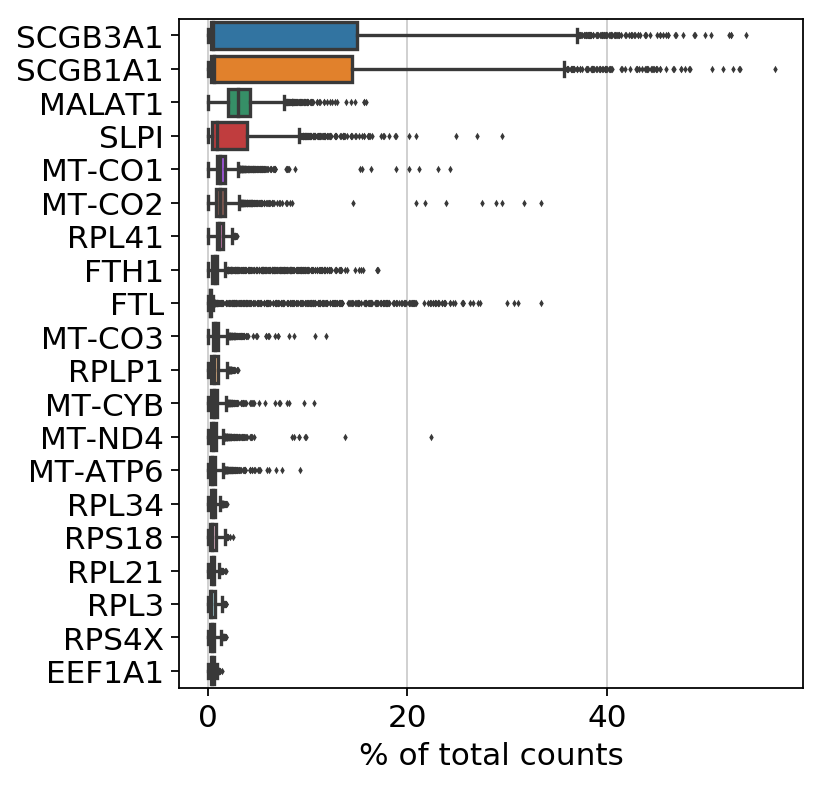

In [255]:
sc.pl.highest_expr_genes(D353_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


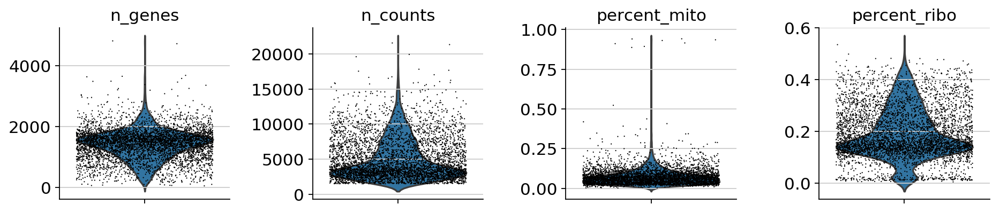

In [256]:
sc.pp.filter_cells(D353_Brus_Dis1, min_genes=0)
mito_genes = D353_Brus_Dis1.var_names.str.startswith('MT-')
D353_Brus_Dis1.obs['percent_mito'] = np.sum(
    D353_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D353_Brus_Dis1.X, axis=1).A1
D353_Brus_Dis1.obs['n_counts'] = D353_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Brus_Dis1.to_df())
ribo_genes = D353_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D353_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D353_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Brus_Dis1.X, axis=1).A1
D353_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [257]:
sc.pp.filter_cells(D353_Brus_Dis1, min_genes=500)
D353_Brus_Dis1 = D353_Brus_Dis1[D353_Brus_Dis1.obs['n_counts'] < 20000, :]
D353_Brus_Dis1 = D353_Brus_Dis1[D353_Brus_Dis1.obs['percent_mito'] < 0.5 , :]


filtered out 200 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.19
Detected doublet rate = 2.4%
Estimated detectable doublet fraction = 50.7%
Overall doublet rate:
	Expected   = 3.9%
	Estimated  = 4.8%
Elapsed time: 3.7 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea9ce0e48>,
       dtype=object))

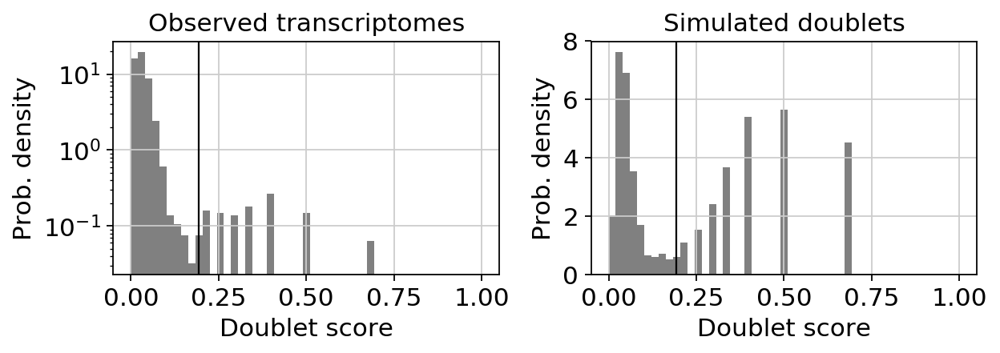

In [258]:
# scrublet
scrub = scr.Scrublet(D353_Brus_Dis1.X, expected_doublet_rate=0.039)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D353_Brus_Dis1.obs['doublet_scores'] = doublet_scores
D353_Brus_Dis1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [259]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D353_Brus_Dis1.X).predict()
D353_Brus_Dis1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.0162525177001953 seconds
Jaccard graph constructed in 0.8561174869537354 seconds
Wrote graph to binary file in 0.3788738250732422 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.906007
After 7 runs, maximum modularity is Q = 0.907108
Louvain completed 27 runs in 2.9793484210968018 seconds
PhenoGraph complete in 5.250179290771484 seconds
Found communities [-1, ... 20], with sizes: [202, 1070, 828, 405, 384, 362, 349, 340, 335, 285, 193, 191, 163, 116, 107, 98, 87, 86, 55, 34, 22, 19]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors u

In [260]:
sc.pp.normalize_per_cell(D353_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Brus_Dis1) # log transform the data
D353_Brus_Dis1.raw = D353_Brus_Dis1 # freeze the object (for later use of the raw state of it)

In [261]:
D353_Brus_Dis1 = D353_Brus_Dis1[:, D353_Brus_Dis1.var['ribo_genes']]
D353_Brus_Dis1

View of AnnData object with n_obs × n_vars = 4585 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [262]:
D354_Brus_Dis1 = sc.read_10x_mtx(
    './D354_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D354_Brus_Dis1.var_names_make_unique()
D354_Brus_Dis1.obs['manip'] = 'D354_Brus_Dis1'
D354_Brus_Dis1.obs['position'] = 'Distal'
D354_Brus_Dis1.obs['method'] = 'Brushing'
D354_Brus_Dis1.obs['donor'] = 'D354'
D354_Brus_Dis1.obs['name'] = ['D354_Brus_Dis1_' + s for s in list(D354_Brus_Dis1.obs.index)]
D354_Brus_Dis1.obs_names = D354_Brus_Dis1.obs['name']
D354_Brus_Dis1

... reading from cache file ./cache/D354_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2674 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

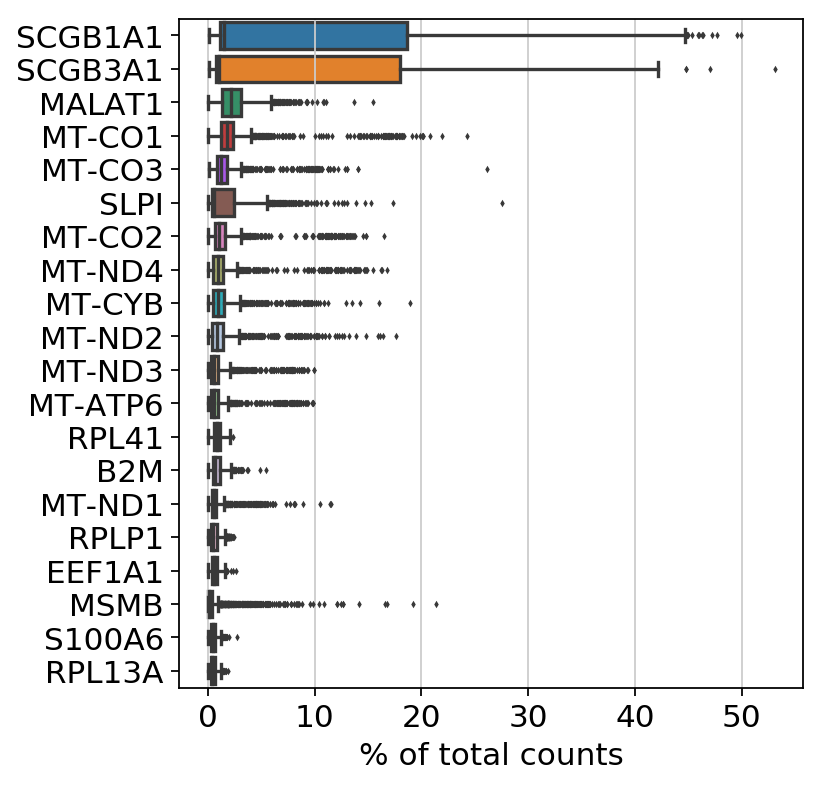

In [263]:
sc.pl.highest_expr_genes(D354_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


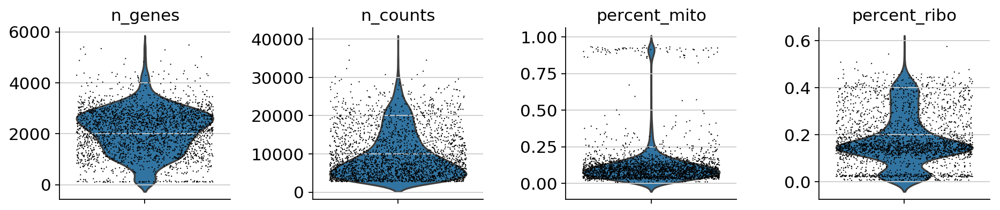

In [264]:
sc.pp.filter_cells(D354_Brus_Dis1, min_genes=0)
mito_genes = D354_Brus_Dis1.var_names.str.startswith('MT-')
D354_Brus_Dis1.obs['percent_mito'] = np.sum(
    D354_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D354_Brus_Dis1.X, axis=1).A1
D354_Brus_Dis1.obs['n_counts'] = D354_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D354_Brus_Dis1.to_df())
ribo_genes = D354_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D354_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D354_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D354_Brus_Dis1.X, axis=1).A1
D354_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D354_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [265]:
sc.pp.filter_cells(D354_Brus_Dis1, min_genes=500)
D354_Brus_Dis1 = D354_Brus_Dis1[D354_Brus_Dis1.obs['n_counts'] < 30000, :]
D354_Brus_Dis1 = D354_Brus_Dis1[D354_Brus_Dis1.obs['percent_mito'] < 0.5 , :]


filtered out 107 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.14
Detected doublet rate = 1.1%
Estimated detectable doublet fraction = 48.4%
Overall doublet rate:
	Expected   = 2.0%
	Estimated  = 2.3%
Elapsed time: 2.1 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1e9dffff28>,
       dtype=object))

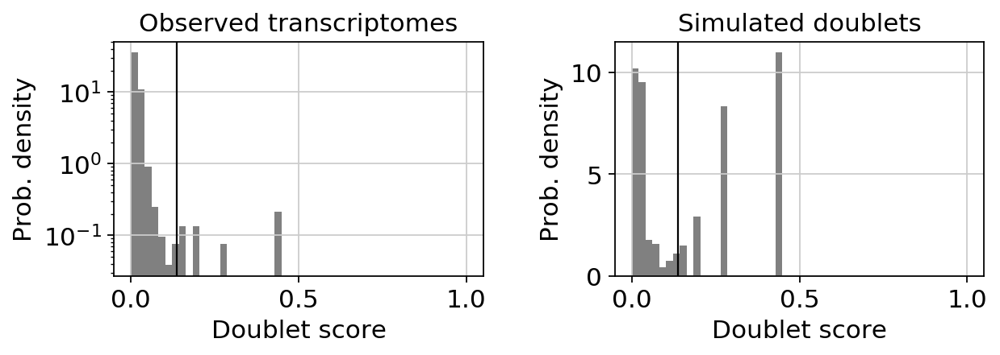

In [266]:
# scrublet
scrub = scr.Scrublet(D354_Brus_Dis1.X, expected_doublet_rate=0.02)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D354_Brus_Dis1.obs['doublet_scores'] = doublet_scores
D354_Brus_Dis1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [267]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D354_Brus_Dis1.X).predict()
D354_Brus_Dis1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.3109779357910156 seconds
Jaccard graph constructed in 0.6154134273529053 seconds
Wrote graph to binary file in 0.05150198936462402 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.912896
Louvain completed 21 runs in 1.676947832107544 seconds
PhenoGraph complete in 2.6751487255096436 seconds
Found communities [-1, ... 19], with sizes: [276, 574, 336, 273, 258, 253, 249, 218, 146, 117, 94, 74, 65, 59, 46, 33, 32, 28, 27, 23, 12]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors compu

In [268]:
sc.pp.normalize_per_cell(D354_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D354_Brus_Dis1) # log transform the data
D354_Brus_Dis1.raw = D354_Brus_Dis1 # freeze the object (for later use of the raw state of it)

In [269]:
D354_Brus_Dis1 = D354_Brus_Dis1[:, D354_Brus_Dis1.var['ribo_genes']]
D354_Brus_Dis1

View of AnnData object with n_obs × n_vars = 2555 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [270]:
D363_Brus_Dis1 = sc.read_10x_mtx(
    './D363_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Brus_Dis1.var_names_make_unique()
D363_Brus_Dis1.obs['manip'] = 'D363_Brus_Dis1'
D363_Brus_Dis1.obs['position'] = 'Distal'
D363_Brus_Dis1.obs['method'] = 'Brushing'
D363_Brus_Dis1.obs['donor'] = 'D363'
D363_Brus_Dis1.obs['name'] = ['D363_Brus_Dis1_' + s for s in list(D363_Brus_Dis1.obs.index)]
D363_Brus_Dis1.obs_names = D363_Brus_Dis1.obs['name']
D363_Brus_Dis1

... reading from cache file ./cache/D363_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1636 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

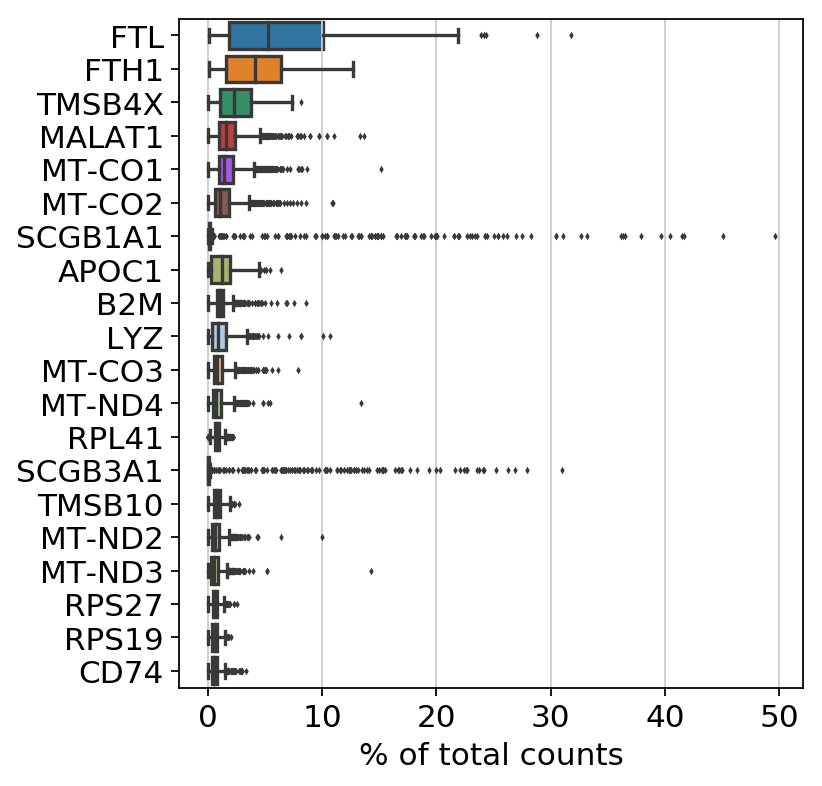

In [271]:
sc.pl.highest_expr_genes(D363_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


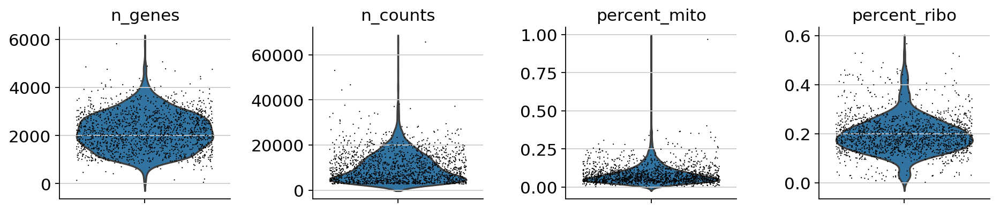

In [272]:
sc.pp.filter_cells(D363_Brus_Dis1, min_genes=0)
mito_genes = D363_Brus_Dis1.var_names.str.startswith('MT-')
D363_Brus_Dis1.obs['percent_mito'] = np.sum(
    D363_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D363_Brus_Dis1.X, axis=1).A1
D363_Brus_Dis1.obs['n_counts'] = D363_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Brus_Dis1.to_df())
ribo_genes = D363_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D363_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D363_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Brus_Dis1.X, axis=1).A1
D363_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [273]:
sc.pp.filter_cells(D363_Brus_Dis1, min_genes=500)
D363_Brus_Dis1 = D363_Brus_Dis1[D363_Brus_Dis1.obs['n_counts'] < 40000, :]
D363_Brus_Dis1 = D363_Brus_Dis1[D363_Brus_Dis1.obs['percent_mito'] < 0.5 , :]


filtered out 7 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.15
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 12.2%
Overall doublet rate:
	Expected   = 1.4%
	Estimated  = 2.5%
Elapsed time: 1.2 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1e9f31f7f0>,
       dtype=object))

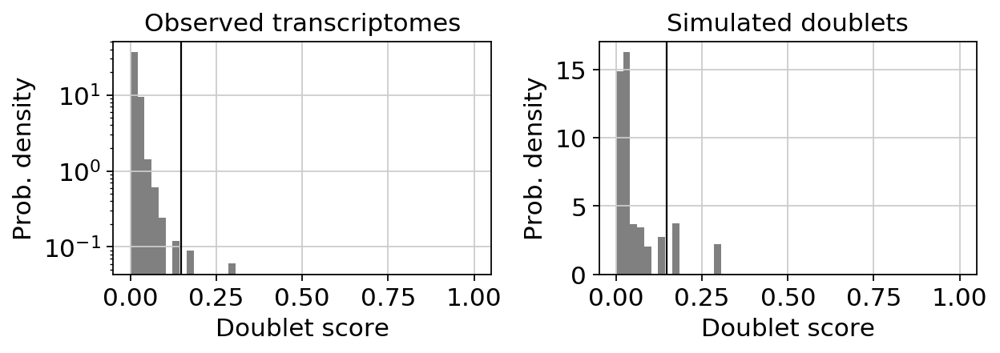

In [274]:
# scrublet
scrub = scr.Scrublet(D363_Brus_Dis1.X, expected_doublet_rate=0.014)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D363_Brus_Dis1.obs['doublet_scores'] = doublet_scores
D363_Brus_Dis1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [275]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D363_Brus_Dis1.X).predict()
D363_Brus_Dis1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.3056020736694336 seconds
Jaccard graph constructed in 0.5146067142486572 seconds
Wrote graph to binary file in 0.03743934631347656 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.888374
Louvain completed 21 runs in 1.5843629837036133 seconds
PhenoGraph complete in 2.453190565109253 seconds
Found communities [-1, ... 16], with sizes: [114, 448, 325, 285, 195, 116, 69, 65, 56, 56, 56, 47, 45, 42, 38, 34, 25, 15]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.3059718

In [276]:
sc.pp.normalize_per_cell(D363_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Brus_Dis1) # log transform the data
D363_Brus_Dis1.raw = D363_Brus_Dis1 # freeze the object (for later use of the raw state of it)

In [277]:
D363_Brus_Dis1 = D363_Brus_Dis1[:, D363_Brus_Dis1.var['ribo_genes']]
D363_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1625 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [278]:
D367_Brus_Dis1 = sc.read_10x_mtx(
    './D367_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Brus_Dis1.var_names_make_unique()
D367_Brus_Dis1.obs['manip'] = 'D367_Brus_Dis1'
D367_Brus_Dis1.obs['position'] = 'Distal'
D367_Brus_Dis1.obs['method'] = 'Brushing'
D367_Brus_Dis1.obs['donor'] = 'D367'
D367_Brus_Dis1.obs['name'] = ['D367_Brus_Dis1_' + s for s in list(D367_Brus_Dis1.obs.index)]
D367_Brus_Dis1.obs_names = D367_Brus_Dis1.obs['name']
D367_Brus_Dis1

... reading from cache file ./cache/D367_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2192 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

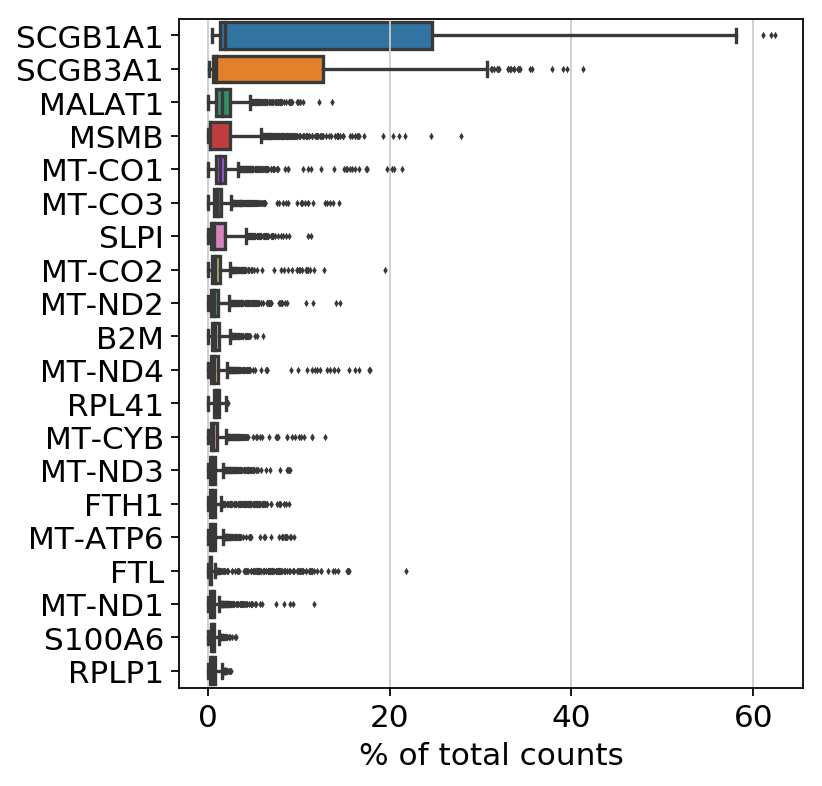

In [279]:
sc.pl.highest_expr_genes(D367_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


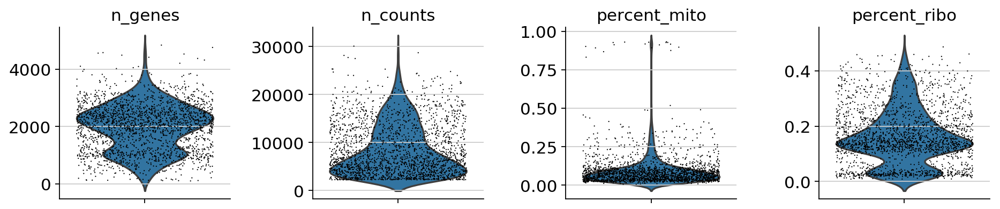

In [280]:
sc.pp.filter_cells(D367_Brus_Dis1, min_genes=0)
mito_genes = D367_Brus_Dis1.var_names.str.startswith('MT-')
D367_Brus_Dis1.obs['percent_mito'] = np.sum(
    D367_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Brus_Dis1.X, axis=1).A1
D367_Brus_Dis1.obs['n_counts'] = D367_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Brus_Dis1.to_df())
ribo_genes = D367_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D367_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D367_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Brus_Dis1.X, axis=1).A1
D367_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [281]:
sc.pp.filter_cells(D367_Brus_Dis1, min_genes=500)
D367_Brus_Dis1 = D367_Brus_Dis1[D367_Brus_Dis1.obs['n_counts'] < 25000, :]
D367_Brus_Dis1 = D367_Brus_Dis1[D367_Brus_Dis1.obs['percent_mito'] < 0.5 , :]


filtered out 63 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.20
Detected doublet rate = 0.5%
Estimated detectable doublet fraction = 34.2%
Overall doublet rate:
	Expected   = 1.8%
	Estimated  = 1.4%
Elapsed time: 1.6 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ea0b48e48>,
       dtype=object))

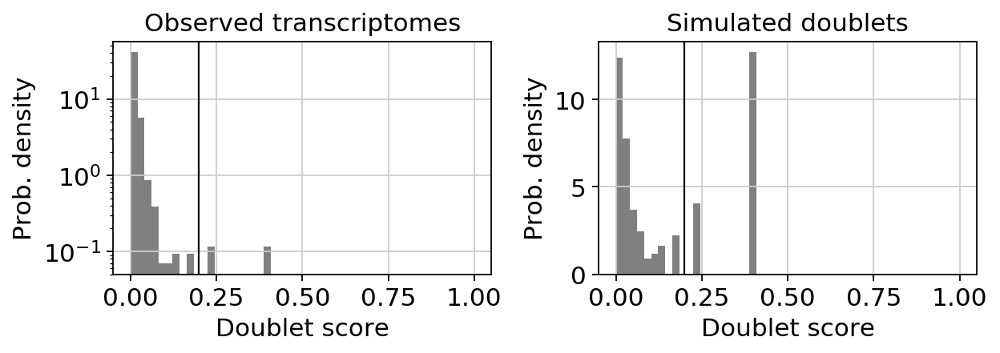

In [282]:
# scrublet
scrub = scr.Scrublet(D367_Brus_Dis1.X, expected_doublet_rate=0.018)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D367_Brus_Dis1.obs['doublet_scores'] = doublet_scores
D367_Brus_Dis1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [283]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D367_Brus_Dis1.X).predict()
D367_Brus_Dis1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.30817437171936035 seconds
Jaccard graph constructed in 0.5569641590118408 seconds
Wrote graph to binary file in 0.05292320251464844 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.915315
Louvain completed 21 runs in 1.6288034915924072 seconds
PhenoGraph complete in 2.5775041580200195 seconds
Found communities [-1, ... 22], with sizes: [210, 389, 372, 142, 138, 129, 123, 121, 106, 96, 94, 90, 88, 86, 85, 78, 78, 62, 61, 30, 24, 23, 14, 11]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Ne

In [284]:
sc.pp.normalize_per_cell(D367_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Brus_Dis1) # log transform the data
D367_Brus_Dis1.raw = D367_Brus_Dis1 # freeze the object (for later use of the raw state of it)

In [285]:
D367_Brus_Dis1 = D367_Brus_Dis1[:, D367_Brus_Dis1.var['ribo_genes']]
D367_Brus_Dis1

View of AnnData object with n_obs × n_vars = 2120 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

In [286]:
D372_Brus_Dis1 = sc.read_10x_mtx(
    './D372_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Brus_Dis1.var_names_make_unique()
D372_Brus_Dis1.obs['manip'] = 'D372_Brus_Dis1'
D372_Brus_Dis1.obs['position'] = 'Distal'
D372_Brus_Dis1.obs['method'] = 'Brushing'
D372_Brus_Dis1.obs['donor'] = 'D372'
D372_Brus_Dis1.obs['name'] = ['D372_Brus_Dis1_' + s for s in list(D372_Brus_Dis1.obs.index)]
D372_Brus_Dis1.obs_names = D372_Brus_Dis1.obs['name']
D372_Brus_Dis1

... reading from cache file ./cache/D372_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1755 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

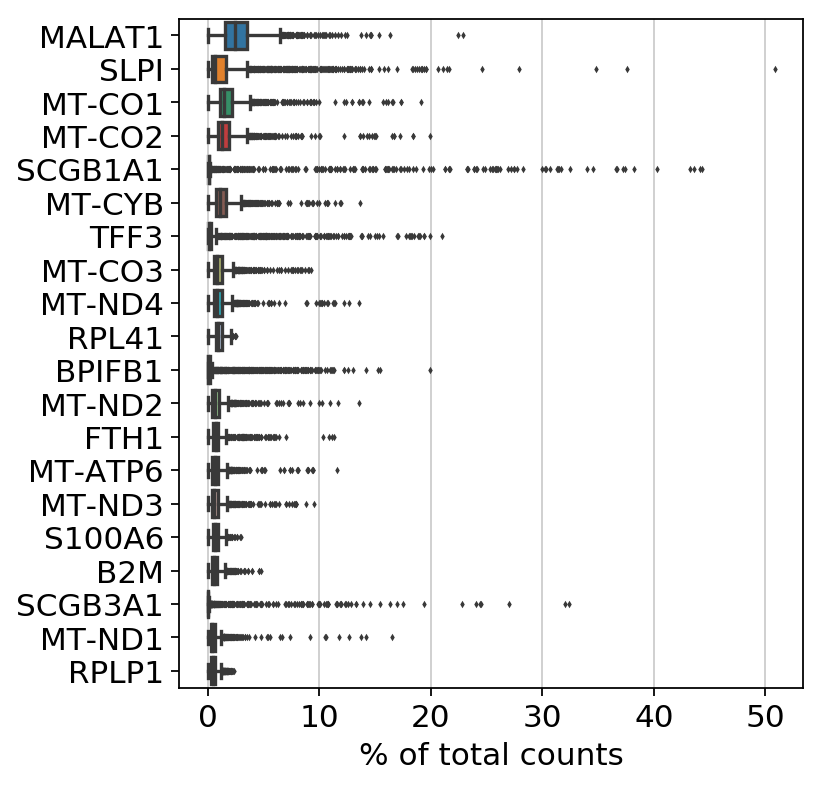

In [287]:
sc.pl.highest_expr_genes(D372_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


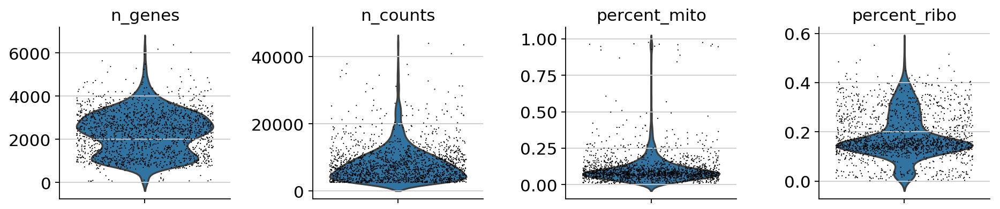

In [288]:
sc.pp.filter_cells(D372_Brus_Dis1, min_genes=0)
mito_genes = D372_Brus_Dis1.var_names.str.startswith('MT-')
D372_Brus_Dis1.obs['percent_mito'] = np.sum(
    D372_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Brus_Dis1.X, axis=1).A1
D372_Brus_Dis1.obs['n_counts'] = D372_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Brus_Dis1.to_df())
ribo_genes = D372_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D372_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D372_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Brus_Dis1.X, axis=1).A1
D372_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [289]:
sc.pp.filter_cells(D372_Brus_Dis1, min_genes=500)
D372_Brus_Dis1 = D372_Brus_Dis1[D372_Brus_Dis1.obs['n_counts'] < 30000, :]
D372_Brus_Dis1 = D372_Brus_Dis1[D372_Brus_Dis1.obs['percent_mito'] < 0.5 , :]


filtered out 19 cells that have less than 500 genes expressed


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.15
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 32.5%
Overall doublet rate:
	Expected   = 1.4%
	Estimated  = 0.9%
Elapsed time: 1.3 seconds


(<Figure size 640x240 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f1e9e45b390>,
       dtype=object))

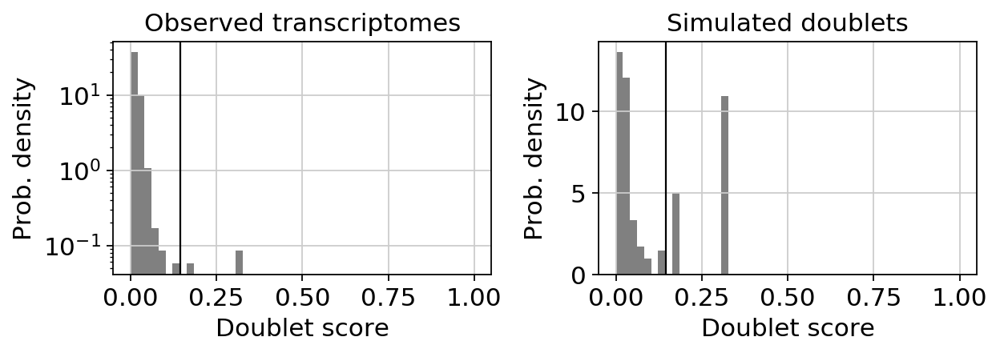

In [290]:
# scrublet
scrub = scr.Scrublet(D372_Brus_Dis1.X, expected_doublet_rate=0.014)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
D372_Brus_Dis1.obs['doublet_scores'] = doublet_scores
D372_Brus_Dis1.obs['predicted_doublets'] = predicted_doublets
scrub.plot_histogram()

In [291]:
# doubletDetection
clf = doubletdetection.BoostClassifier()
labels = clf.fit(D372_Brus_Dis1.X).predict()
D372_Brus_Dis1.obs['doubletDetection'] = labels


/home/deprez/environments/env_HCA/lib/python3.7/site-packages/doubletdetection/doubletdetection.py:178: UserWarning: Sparse raw_counts is automatically densified.
  warnings.warn("Sparse raw_counts is automatically densified.")


Iteration   1/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.20571494102478027 seconds
Jaccard graph constructed in 0.5139338970184326 seconds
Wrote graph to binary file in 0.04161214828491211 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.902631
Louvain completed 21 runs in 1.607027530670166 seconds
PhenoGraph complete in 2.402970790863037 seconds
Found communities [-1, ... 18], with sizes: [151, 517, 267, 180, 134, 120, 113, 95, 90, 79, 62, 57, 55, 47, 46, 44, 32, 21, 19, 14]

Iteration   2/25

Creating synthetic doublets...
Normalizing...
Running PCA...
Clustering augmented data set with Phenograph...

Setting directed=False because prune=True
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 

In [292]:
sc.pp.normalize_per_cell(D372_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Brus_Dis1) # log transform the data
D372_Brus_Dis1.raw = D372_Brus_Dis1 # freeze the object (for later use of the raw state of it)

In [293]:
D372_Brus_Dis1 = D372_Brus_Dis1[:, D372_Brus_Dis1.var['ribo_genes']]
D372_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1715 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'doubletDetection'
    var: 'gene_ids', 'ribo_genes'

***

# Concatenate full dataset
[Back to top](#Full-Aggregate)

In [294]:
adata = D322_Biop_Nas1.concatenate(D322_Biop_Pro1, D322_Biop_Int1, 
                                   D326_Biop_Pro1, D326_Biop_Int1, D326_Brus_Dis1,
                                   D337_Brus_Dis1,
                                   D339_Biop_Nas1, D339_Biop_Pro1, D339_Biop_Int1, D339_Brus_Dis1,
                                   D344_Biop_Nas1, D344_Biop_Pro1, D344_Biop_Int1, D344_Brus_Dis1,
                                   D345_Biop_Nas1,
                                   D353_Brus_Nas1, D353_Biop_Pro1, D353_Biop_Int2, D353_Brus_Dis1,
                                   D354_Biop_Pro1, D354_Biop_Int2, D354_Brus_Dis1,
                                   D363_Brus_Nas1, D363_Biop_Pro1, D363_Biop_Int2, D363_Brus_Dis1,
                                   D367_Brus_Nas1, D367_Biop_Pro1, D367_Biop_Int1, D367_Brus_Dis1,
                                   D372_Brus_Nas1, D372_Biop_Pro1, D372_Biop_Int1, D372_Biop_Int2, D372_Brus_Dis1,
                                   join='inner')

In [295]:
adata.write('/Data/Preprocessed_doublet_dataset.h5ad')

... storing 'donor' as categorical
... storing 'manip' as categorical
... storing 'method' as categorical
... storing 'position' as categorical


In [296]:
adata.obs.to_csv(path_or_buf = '/Data/metadata_doublet.tsv', 
               sep = '\t')